# Download the dataset and supporting codes and pre-trained models

https://drive.google.com/file/d/1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt/view?usp=drivesdk

https://drive.google.com/file/d/1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu/view?usp=drivesdk

https://drive.google.com/file/d/1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro/view?usp=drivesdk

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
"""
from google.colab import auth
auth.authenticate_user()
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
import io
import os
from googleapiclient.http import MediaIoBaseDownload
def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    downloaded.seek(0)
    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)
    with open(fn, 'wb') as f:
        f.write(downloaded.read())
id_to_fn = {
# '1D3rH-gSxIECZnoyc5k77PEucKBVzoiBc': 'edges2shoes.zip',
'1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt': 'edges2shoes.zip',
'1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu': 'CycleGAN_support.zip',
# '1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro': 'test_case.zip',
'1l7gHikhCz64hYHL4n_Ps7nufQcddcRyR': 'test_case.zip'

}
# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)
"""

'\nfrom google.colab import auth\nauth.authenticate_user()\nfrom googleapiclient.discovery import build\ndrive_service = build(\'drive\', \'v3\')\nimport io\nimport os\nfrom googleapiclient.http import MediaIoBaseDownload\ndef download_file(fn, file_id):\n    request = drive_service.files().get_media(fileId=file_id)\n    downloaded = io.BytesIO()\n    downloader = MediaIoBaseDownload(downloaded, request)\n    done = False\n    while done is False:\n        # _ is a placeholder for a progress object that we ignore.\n        # (Our file is small, so we skip reporting progress.)\n        _, done = downloader.next_chunk()\n    downloaded.seek(0)\n    folder = fn.split(\'/\')\n    if len(folder) > 1:\n        os.makedirs(folder[0], exist_ok=True)\n    with open(fn, \'wb\') as f:\n        f.write(downloaded.read())\nid_to_fn = {\n# \'1D3rH-gSxIECZnoyc5k77PEucKBVzoiBc\': \'edges2shoes.zip\',\n\'1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt\': \'edges2shoes.zip\',\n\'1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu\': \

In [3]:
! unzip -q "/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/edge2shoes.zip"
#! unzip -q CycleGAN_support.zip
! unzip -q "/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/test_case_CYCLEGAN.zip"

# CycleGAN training (TODO)

### Upload models.py and datasets.py at this point

In [13]:
## we will do checkpointing while training the model. So make loss directory
#import os
#os.mkdir('/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/cyclegan_losses/')

In [7]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
#from datasets import *
from datasets import *

from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt

the length of training data: 49825


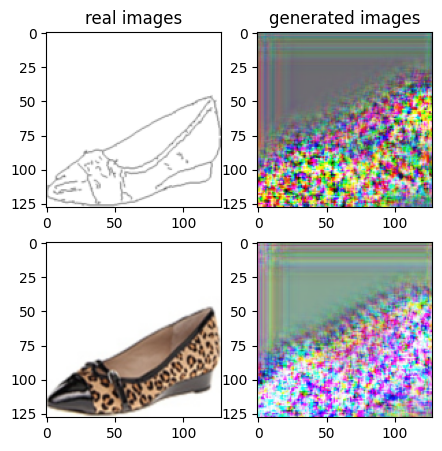

Train Epoch: 1 0% 	Total Loss: 9.639410 	Loss_G_AB: 1.937194	Loss_G_BA: 2.318113	Loss_cycle: 4.005116	Loss_D_A: 1.651271	Loss_D_B: 1.855369
0 9 T:  1.761941909790039
Train Epoch: 1 0% 	Total Loss: 5.868834 	Loss_G_AB: 1.618689	Loss_G_BA: 1.507559	Loss_cycle: 1.782378	Loss_D_A: 1.131302	Loss_D_B: 1.392029
0 19 T:  0.9894464015960693
Train Epoch: 1 0% 	Total Loss: 4.968335 	Loss_G_AB: 1.333832	Loss_G_BA: 0.891933	Loss_cycle: 1.870882	Loss_D_A: 0.669108	Loss_D_B: 1.315462
0 29 T:  0.9905695915222168
Train Epoch: 1 0% 	Total Loss: 3.553646 	Loss_G_AB: 0.887510	Loss_G_BA: 0.827045	Loss_cycle: 1.767942	Loss_D_A: 0.352924	Loss_D_B: 0.575503
0 39 T:  0.9869570732116699
Train Epoch: 1 0% 	Total Loss: 2.888924 	Loss_G_AB: 0.724331	Loss_G_BA: 0.723218	Loss_cycle: 1.374124	Loss_D_A: 0.347211	Loss_D_B: 0.443814
0 49 T:  0.9956939220428467
Train Epoch: 1 0% 	Total Loss: 2.954499 	Loss_G_AB: 0.677672	Loss_G_BA: 0.795187	Loss_cycle: 1.451195	Loss_D_A: 0.417213	Loss_D_B: 0.349661
0 59 T:  0.97466421127

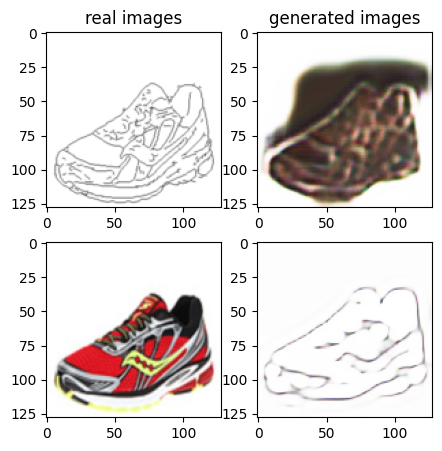

Train Epoch: 1 2% 	Total Loss: 1.663452 	Loss_G_AB: 0.338183	Loss_G_BA: 0.737564	Loss_cycle: 0.753501	Loss_D_A: 0.152186	Loss_D_B: 0.219892
0 1009 T:  1.8877971172332764
Train Epoch: 1 2% 	Total Loss: 1.995557 	Loss_G_AB: 0.361519	Loss_G_BA: 0.816690	Loss_cycle: 1.045797	Loss_D_A: 0.083828	Loss_D_B: 0.276827
0 1019 T:  0.9858393669128418
Train Epoch: 1 2% 	Total Loss: 1.687758 	Loss_G_AB: 0.390349	Loss_G_BA: 0.793513	Loss_cycle: 0.643534	Loss_D_A: 0.118258	Loss_D_B: 0.334036
0 1029 T:  0.9827389717102051
Train Epoch: 1 2% 	Total Loss: 1.700924 	Loss_G_AB: 0.302841	Loss_G_BA: 0.687613	Loss_cycle: 0.848448	Loss_D_A: 0.097674	Loss_D_B: 0.259575
0 1039 T:  0.9848639965057373
Train Epoch: 1 2% 	Total Loss: 1.875761 	Loss_G_AB: 0.328511	Loss_G_BA: 0.895571	Loss_cycle: 0.953754	Loss_D_A: 0.071565	Loss_D_B: 0.238401
0 1049 T:  0.9891269207000732
Train Epoch: 1 2% 	Total Loss: 1.848591 	Loss_G_AB: 0.305582	Loss_G_BA: 0.994869	Loss_cycle: 0.865451	Loss_D_A: 0.061318	Loss_D_B: 0.271596
0 1059 T: 

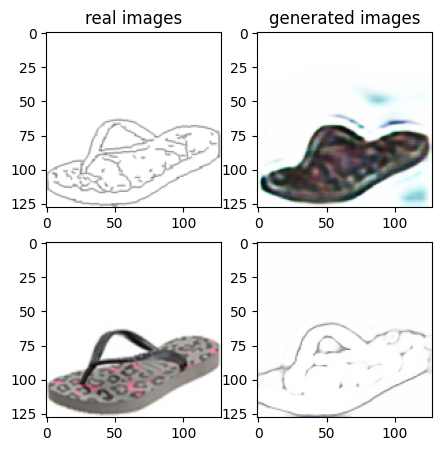

Train Epoch: 1 4% 	Total Loss: 1.848311 	Loss_G_AB: 0.373693	Loss_G_BA: 0.962968	Loss_cycle: 0.822526	Loss_D_A: 0.041380	Loss_D_B: 0.316074
0 2009 T:  1.7332119941711426
Train Epoch: 1 4% 	Total Loss: 1.550029 	Loss_G_AB: 0.322114	Loss_G_BA: 0.803449	Loss_cycle: 0.692879	Loss_D_A: 0.055837	Loss_D_B: 0.238532
0 2019 T:  0.9788839817047119
Train Epoch: 1 4% 	Total Loss: 1.673608 	Loss_G_AB: 0.345385	Loss_G_BA: 0.827247	Loss_cycle: 0.767384	Loss_D_A: 0.065558	Loss_D_B: 0.254351
0 2029 T:  0.9778733253479004
Train Epoch: 1 4% 	Total Loss: 1.452350 	Loss_G_AB: 0.306753	Loss_G_BA: 0.662548	Loss_cycle: 0.603152	Loss_D_A: 0.114937	Loss_D_B: 0.249610
0 2039 T:  0.9806907176971436
Train Epoch: 1 4% 	Total Loss: 1.520852 	Loss_G_AB: 0.298100	Loss_G_BA: 0.602568	Loss_cycle: 0.612613	Loss_D_A: 0.200634	Loss_D_B: 0.257272
0 2049 T:  0.9839050769805908
Train Epoch: 1 4% 	Total Loss: 1.591087 	Loss_G_AB: 0.344668	Loss_G_BA: 0.788912	Loss_cycle: 0.667509	Loss_D_A: 0.107038	Loss_D_B: 0.249750
0 2059 T: 

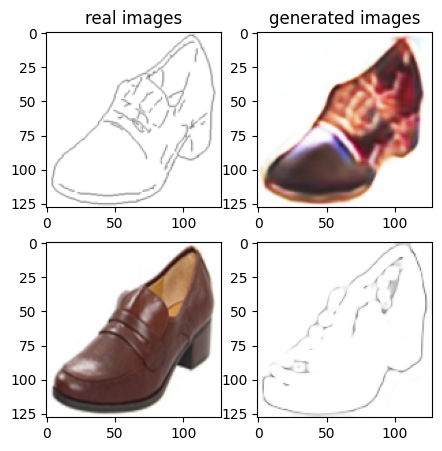

Train Epoch: 1 6% 	Total Loss: 1.763565 	Loss_G_AB: 0.314648	Loss_G_BA: 0.924080	Loss_cycle: 0.833226	Loss_D_A: 0.051339	Loss_D_B: 0.259636
0 3009 T:  1.7360386848449707
Train Epoch: 1 6% 	Total Loss: 1.670943 	Loss_G_AB: 0.306023	Loss_G_BA: 0.820032	Loss_cycle: 0.819535	Loss_D_A: 0.051918	Loss_D_B: 0.236462
0 3019 T:  1.0848889350891113
Train Epoch: 1 6% 	Total Loss: 1.751307 	Loss_G_AB: 0.297285	Loss_G_BA: 0.935892	Loss_cycle: 0.852804	Loss_D_A: 0.030927	Loss_D_B: 0.250988
0 3029 T:  1.0984301567077637
Train Epoch: 1 6% 	Total Loss: 1.672766 	Loss_G_AB: 0.340804	Loss_G_BA: 0.970992	Loss_cycle: 0.751586	Loss_D_A: 0.018782	Loss_D_B: 0.246501
0 3039 T:  1.1810991764068604
Train Epoch: 1 6% 	Total Loss: 1.638948 	Loss_G_AB: 0.306328	Loss_G_BA: 0.920101	Loss_cycle: 0.740555	Loss_D_A: 0.052475	Loss_D_B: 0.232704
0 3049 T:  1.216892957687378
Train Epoch: 1 6% 	Total Loss: 1.925805 	Loss_G_AB: 0.451919	Loss_G_BA: 0.900804	Loss_cycle: 0.903695	Loss_D_A: 0.060642	Loss_D_B: 0.285107
0 3059 T:  

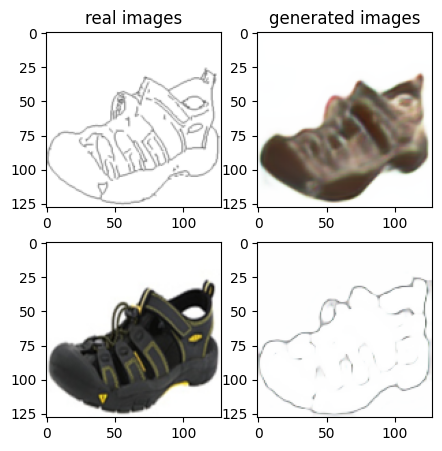

Train Epoch: 1 8% 	Total Loss: 1.606857 	Loss_G_AB: 0.300001	Loss_G_BA: 0.838911	Loss_cycle: 0.725228	Loss_D_A: 0.074765	Loss_D_B: 0.237408
0 4009 T:  2.3363144397735596
Train Epoch: 1 8% 	Total Loss: 1.565074 	Loss_G_AB: 0.325388	Loss_G_BA: 0.676921	Loss_cycle: 0.723977	Loss_D_A: 0.103960	Loss_D_B: 0.235983
0 4019 T:  1.0474183559417725
Train Epoch: 1 8% 	Total Loss: 1.570142 	Loss_G_AB: 0.378222	Loss_G_BA: 0.800204	Loss_cycle: 0.648109	Loss_D_A: 0.080519	Loss_D_B: 0.252300
0 4029 T:  1.1430537700653076
Train Epoch: 1 8% 	Total Loss: 1.914330 	Loss_G_AB: 0.287199	Loss_G_BA: 0.907001	Loss_cycle: 0.969928	Loss_D_A: 0.096676	Loss_D_B: 0.250626
0 4039 T:  1.0805461406707764
Train Epoch: 1 8% 	Total Loss: 1.449336 	Loss_G_AB: 0.370706	Loss_G_BA: 0.781535	Loss_cycle: 0.559398	Loss_D_A: 0.051161	Loss_D_B: 0.262657
0 4049 T:  1.0017197132110596
Train Epoch: 1 8% 	Total Loss: 1.517647 	Loss_G_AB: 0.316984	Loss_G_BA: 0.864851	Loss_cycle: 0.613999	Loss_D_A: 0.072811	Loss_D_B: 0.239919
0 4059 T: 

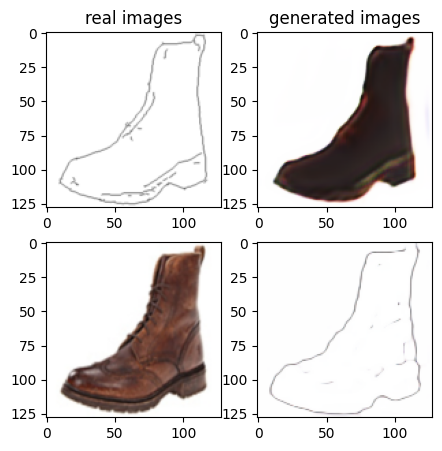

Train Epoch: 1 10% 	Total Loss: 1.482808 	Loss_G_AB: 0.305373	Loss_G_BA: 0.860516	Loss_cycle: 0.592205	Loss_D_A: 0.031379	Loss_D_B: 0.276279
0 5009 T:  2.4230573177337646
Train Epoch: 1 10% 	Total Loss: 1.436164 	Loss_G_AB: 0.325381	Loss_G_BA: 0.954223	Loss_cycle: 0.483980	Loss_D_A: 0.049260	Loss_D_B: 0.263122
0 5019 T:  1.0603227615356445
Train Epoch: 1 10% 	Total Loss: 1.631219 	Loss_G_AB: 0.306673	Loss_G_BA: 0.953770	Loss_cycle: 0.698997	Loss_D_A: 0.016326	Loss_D_B: 0.285673
0 5029 T:  1.063079595565796
Train Epoch: 1 10% 	Total Loss: 1.619930 	Loss_G_AB: 0.329577	Loss_G_BA: 0.831673	Loss_cycle: 0.724280	Loss_D_A: 0.059357	Loss_D_B: 0.255668
0 5039 T:  1.0634145736694336
Train Epoch: 1 10% 	Total Loss: 1.608740 	Loss_G_AB: 0.330308	Loss_G_BA: 0.780297	Loss_cycle: 0.715021	Loss_D_A: 0.078159	Loss_D_B: 0.260258
0 5049 T:  1.0071690082550049
Train Epoch: 1 10% 	Total Loss: 1.614557 	Loss_G_AB: 0.317501	Loss_G_BA: 0.925750	Loss_cycle: 0.717498	Loss_D_A: 0.043142	Loss_D_B: 0.232292
0 505

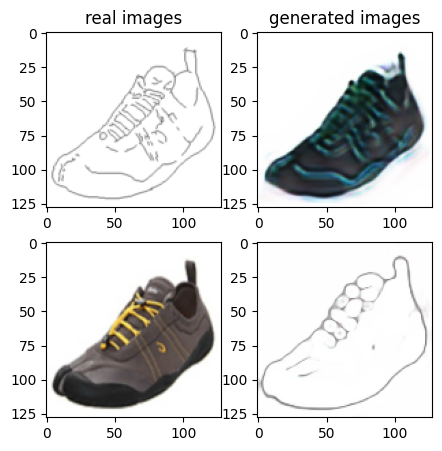

Train Epoch: 1 12% 	Total Loss: 1.686561 	Loss_G_AB: 0.311494	Loss_G_BA: 0.961910	Loss_cycle: 0.775671	Loss_D_A: 0.032078	Loss_D_B: 0.242110
0 6009 T:  1.7279329299926758
Train Epoch: 1 12% 	Total Loss: 1.684902 	Loss_G_AB: 0.334825	Loss_G_BA: 0.844229	Loss_cycle: 0.791028	Loss_D_A: 0.065033	Loss_D_B: 0.239314
0 6019 T:  0.98311448097229
Train Epoch: 1 12% 	Total Loss: 1.816674 	Loss_G_AB: 0.328335	Loss_G_BA: 0.913314	Loss_cycle: 0.903197	Loss_D_A: 0.039567	Loss_D_B: 0.253086
0 6029 T:  0.9813599586486816
Train Epoch: 1 12% 	Total Loss: 1.754705 	Loss_G_AB: 0.294134	Loss_G_BA: 0.996713	Loss_cycle: 0.825209	Loss_D_A: 0.039184	Loss_D_B: 0.244889
0 6039 T:  0.9877395629882812
Train Epoch: 1 12% 	Total Loss: 1.543894 	Loss_G_AB: 0.300572	Loss_G_BA: 0.900696	Loss_cycle: 0.670417	Loss_D_A: 0.032805	Loss_D_B: 0.240038
0 6049 T:  0.9974818229675293
Train Epoch: 1 12% 	Total Loss: 1.627900 	Loss_G_AB: 0.357002	Loss_G_BA: 0.683674	Loss_cycle: 0.750883	Loss_D_A: 0.136762	Loss_D_B: 0.219916
0 6059

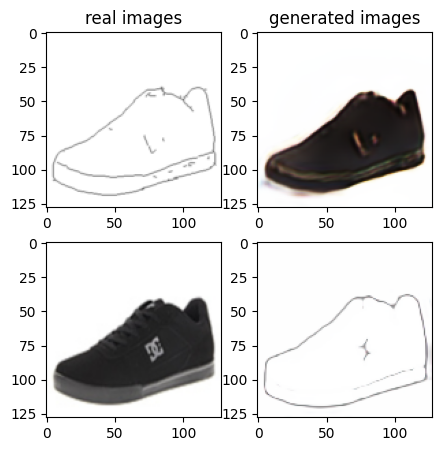

Train Epoch: 1 14% 	Total Loss: 1.665008 	Loss_G_AB: 0.307132	Loss_G_BA: 0.929593	Loss_cycle: 0.742614	Loss_D_A: 0.035446	Loss_D_B: 0.268586
0 7009 T:  2.8806097507476807
Train Epoch: 1 14% 	Total Loss: 1.508958 	Loss_G_AB: 0.360903	Loss_G_BA: 0.886904	Loss_cycle: 0.608700	Loss_D_A: 0.040006	Loss_D_B: 0.236349
0 7019 T:  1.1297900676727295
Train Epoch: 1 14% 	Total Loss: 1.609351 	Loss_G_AB: 0.337699	Loss_G_BA: 0.894987	Loss_cycle: 0.746354	Loss_D_A: 0.027269	Loss_D_B: 0.219385
0 7029 T:  1.0383648872375488
Train Epoch: 1 14% 	Total Loss: 1.746866 	Loss_G_AB: 0.401252	Loss_G_BA: 0.864266	Loss_cycle: 0.773534	Loss_D_A: 0.048916	Loss_D_B: 0.291657
0 7039 T:  1.0899903774261475
Train Epoch: 1 14% 	Total Loss: 1.734705 	Loss_G_AB: 0.293825	Loss_G_BA: 0.988240	Loss_cycle: 0.836531	Loss_D_A: 0.017405	Loss_D_B: 0.239737
0 7049 T:  1.0030632019042969
Train Epoch: 1 14% 	Total Loss: 1.542713 	Loss_G_AB: 0.322174	Loss_G_BA: 0.974073	Loss_cycle: 0.628059	Loss_D_A: 0.031406	Loss_D_B: 0.235125
0 70

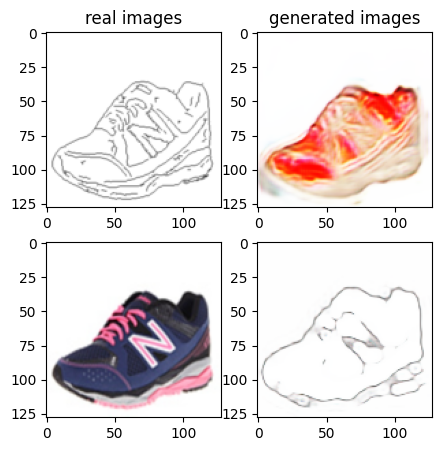

Train Epoch: 1 16% 	Total Loss: 1.708902 	Loss_G_AB: 0.345464	Loss_G_BA: 1.061870	Loss_cycle: 0.773861	Loss_D_A: 0.012171	Loss_D_B: 0.219203
0 8009 T:  1.8330745697021484
Train Epoch: 1 16% 	Total Loss: 1.611632 	Loss_G_AB: 0.310686	Loss_G_BA: 0.937113	Loss_cycle: 0.642430	Loss_D_A: 0.034324	Loss_D_B: 0.310979
0 8019 T:  0.9895467758178711
Train Epoch: 1 16% 	Total Loss: 1.666774 	Loss_G_AB: 0.285603	Loss_G_BA: 0.910211	Loss_cycle: 0.763921	Loss_D_A: 0.045934	Loss_D_B: 0.259011
0 8029 T:  0.9828848838806152
Train Epoch: 1 16% 	Total Loss: 1.495557 	Loss_G_AB: 0.309943	Loss_G_BA: 0.960552	Loss_cycle: 0.567610	Loss_D_A: 0.027860	Loss_D_B: 0.264840
0 8039 T:  0.9821302890777588
Train Epoch: 1 16% 	Total Loss: 1.450569 	Loss_G_AB: 0.282318	Loss_G_BA: 0.979746	Loss_cycle: 0.542525	Loss_D_A: 0.019908	Loss_D_B: 0.257105
0 8049 T:  0.984149694442749
Train Epoch: 1 16% 	Total Loss: 1.578528 	Loss_G_AB: 0.321329	Loss_G_BA: 0.921651	Loss_cycle: 0.667124	Loss_D_A: 0.033600	Loss_D_B: 0.256313
0 805

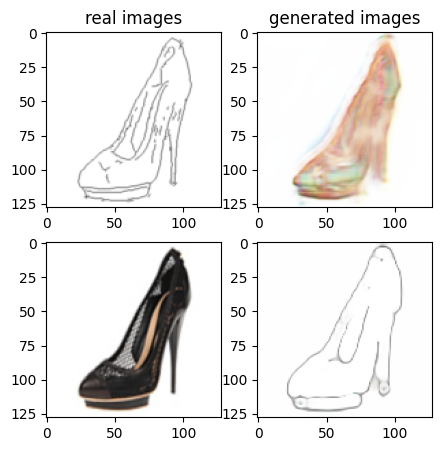

Train Epoch: 1 18% 	Total Loss: 1.572360 	Loss_G_AB: 0.302703	Loss_G_BA: 0.914138	Loss_cycle: 0.637216	Loss_D_A: 0.073838	Loss_D_B: 0.252885
0 9009 T:  1.683626413345337
Train Epoch: 1 18% 	Total Loss: 1.505435 	Loss_G_AB: 0.362937	Loss_G_BA: 0.865572	Loss_cycle: 0.587267	Loss_D_A: 0.054699	Loss_D_B: 0.249215
0 9019 T:  0.9798810482025146
Train Epoch: 1 18% 	Total Loss: 1.716382 	Loss_G_AB: 0.392941	Loss_G_BA: 0.867265	Loss_cycle: 0.794086	Loss_D_A: 0.047072	Loss_D_B: 0.245121
0 9029 T:  0.9851748943328857
Train Epoch: 1 18% 	Total Loss: 1.559342 	Loss_G_AB: 0.331042	Loss_G_BA: 0.859593	Loss_cycle: 0.601335	Loss_D_A: 0.077314	Loss_D_B: 0.285377
0 9039 T:  0.9812114238739014
Train Epoch: 1 18% 	Total Loss: 1.712104 	Loss_G_AB: 0.310342	Loss_G_BA: 0.986717	Loss_cycle: 0.789501	Loss_D_A: 0.034450	Loss_D_B: 0.239624
0 9049 T:  0.9864208698272705
Train Epoch: 1 18% 	Total Loss: 1.587927 	Loss_G_AB: 0.317135	Loss_G_BA: 0.960810	Loss_cycle: 0.648582	Loss_D_A: 0.022591	Loss_D_B: 0.277782
0 905

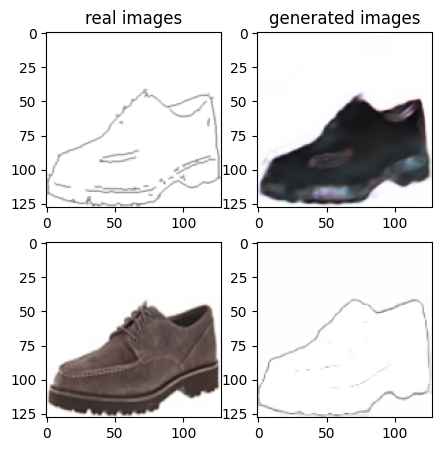

Train Epoch: 1 20% 	Total Loss: 1.624559 	Loss_G_AB: 0.273341	Loss_G_BA: 0.873164	Loss_cycle: 0.708352	Loss_D_A: 0.064638	Loss_D_B: 0.278316
0 10009 T:  1.7034943103790283
Train Epoch: 1 20% 	Total Loss: 1.435204 	Loss_G_AB: 0.275075	Loss_G_BA: 0.915438	Loss_cycle: 0.554651	Loss_D_A: 0.037642	Loss_D_B: 0.247655
0 10019 T:  1.0027580261230469
Train Epoch: 1 20% 	Total Loss: 1.629650 	Loss_G_AB: 0.383824	Loss_G_BA: 0.986765	Loss_cycle: 0.678974	Loss_D_A: 0.031714	Loss_D_B: 0.233667
0 10029 T:  0.995842695236206
Train Epoch: 1 20% 	Total Loss: 1.437747 	Loss_G_AB: 0.367239	Loss_G_BA: 0.664223	Loss_cycle: 0.566713	Loss_D_A: 0.131284	Loss_D_B: 0.224018
0 10039 T:  1.0096094608306885
Train Epoch: 1 20% 	Total Loss: 1.521871 	Loss_G_AB: 0.353254	Loss_G_BA: 0.910192	Loss_cycle: 0.587586	Loss_D_A: 0.044242	Loss_D_B: 0.258319
0 10049 T:  1.0049614906311035
Train Epoch: 1 20% 	Total Loss: 1.596853 	Loss_G_AB: 0.394214	Loss_G_BA: 0.803318	Loss_cycle: 0.543537	Loss_D_A: 0.157601	Loss_D_B: 0.296949


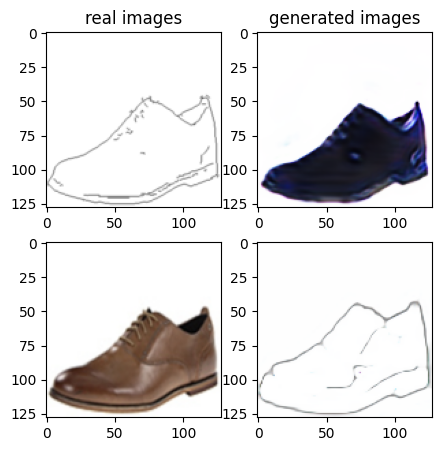

Train Epoch: 1 22% 	Total Loss: 1.456948 	Loss_G_AB: 0.353412	Loss_G_BA: 0.905152	Loss_cycle: 0.543466	Loss_D_A: 0.039082	Loss_D_B: 0.245118
0 11009 T:  2.0507450103759766
Train Epoch: 1 22% 	Total Loss: 1.827427 	Loss_G_AB: 0.571213	Loss_G_BA: 0.960071	Loss_cycle: 0.635923	Loss_D_A: 0.017223	Loss_D_B: 0.408639
0 11019 T:  1.0043220520019531
Train Epoch: 1 22% 	Total Loss: 1.549139 	Loss_G_AB: 0.354186	Loss_G_BA: 1.023458	Loss_cycle: 0.559696	Loss_D_A: 0.013097	Loss_D_B: 0.287523
0 11029 T:  0.9809558391571045
Train Epoch: 1 22% 	Total Loss: 1.612868 	Loss_G_AB: 0.299126	Loss_G_BA: 1.032962	Loss_cycle: 0.680562	Loss_D_A: 0.012474	Loss_D_B: 0.253787
0 11039 T:  0.9829807281494141
Train Epoch: 1 22% 	Total Loss: 1.462710 	Loss_G_AB: 0.317294	Loss_G_BA: 0.958953	Loss_cycle: 0.575337	Loss_D_A: 0.013595	Loss_D_B: 0.235655
0 11049 T:  0.9815080165863037
Train Epoch: 1 22% 	Total Loss: 1.505495 	Loss_G_AB: 0.304609	Loss_G_BA: 0.903977	Loss_cycle: 0.633903	Loss_D_A: 0.024470	Loss_D_B: 0.242829

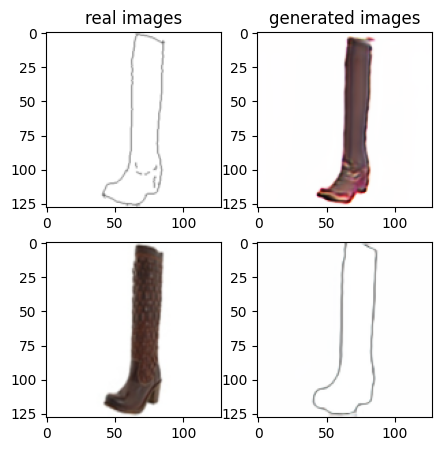

Train Epoch: 1 24% 	Total Loss: 1.391907 	Loss_G_AB: 0.288245	Loss_G_BA: 0.849965	Loss_cycle: 0.482943	Loss_D_A: 0.069488	Loss_D_B: 0.270371
0 12009 T:  1.6856815814971924
Train Epoch: 1 24% 	Total Loss: 1.400403 	Loss_G_AB: 0.278922	Loss_G_BA: 0.812118	Loss_cycle: 0.546486	Loss_D_A: 0.061465	Loss_D_B: 0.246932
0 12019 T:  0.9852542877197266
Train Epoch: 1 24% 	Total Loss: 1.632146 	Loss_G_AB: 0.282487	Loss_G_BA: 0.755141	Loss_cycle: 0.744676	Loss_D_A: 0.094926	Loss_D_B: 0.273730
0 12029 T:  0.9801881313323975
Train Epoch: 1 24% 	Total Loss: 1.683335 	Loss_G_AB: 0.309877	Loss_G_BA: 1.027124	Loss_cycle: 0.726955	Loss_D_A: 0.049169	Loss_D_B: 0.238711
0 12039 T:  0.9854791164398193
Train Epoch: 1 24% 	Total Loss: 1.354305 	Loss_G_AB: 0.309641	Loss_G_BA: 0.868980	Loss_cycle: 0.483291	Loss_D_A: 0.029554	Loss_D_B: 0.252149
0 12049 T:  0.9779667854309082
Train Epoch: 1 24% 	Total Loss: 1.571065 	Loss_G_AB: 0.349344	Loss_G_BA: 0.992612	Loss_cycle: 0.605814	Loss_D_A: 0.026373	Loss_D_B: 0.267900

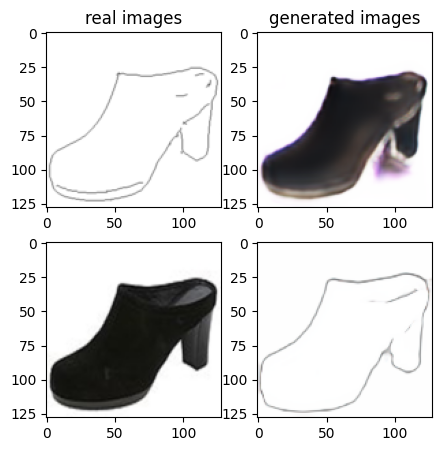

Train Epoch: 1 26% 	Total Loss: 1.571726 	Loss_G_AB: 0.352343	Loss_G_BA: 0.984609	Loss_cycle: 0.653486	Loss_D_A: 0.009176	Loss_D_B: 0.240588
0 13009 T:  1.6798839569091797
Train Epoch: 1 26% 	Total Loss: 1.457695 	Loss_G_AB: 0.342574	Loss_G_BA: 1.018212	Loss_cycle: 0.553654	Loss_D_A: 0.007087	Loss_D_B: 0.216561
0 13019 T:  0.9823358058929443
Train Epoch: 1 26% 	Total Loss: 1.369104 	Loss_G_AB: 0.315616	Loss_G_BA: 0.972408	Loss_cycle: 0.469582	Loss_D_A: 0.006532	Loss_D_B: 0.248979
0 13029 T:  0.9827873706817627
Train Epoch: 1 26% 	Total Loss: 1.605405 	Loss_G_AB: 0.405353	Loss_G_BA: 0.983199	Loss_cycle: 0.703061	Loss_D_A: 0.007821	Loss_D_B: 0.200247
0 13039 T:  0.982877254486084
Train Epoch: 1 26% 	Total Loss: 1.571045 	Loss_G_AB: 0.345014	Loss_G_BA: 0.986606	Loss_cycle: 0.642856	Loss_D_A: 0.007473	Loss_D_B: 0.254906
0 13049 T:  0.9826076030731201
Train Epoch: 1 26% 	Total Loss: 1.456659 	Loss_G_AB: 0.320791	Loss_G_BA: 1.017372	Loss_cycle: 0.522416	Loss_D_A: 0.005630	Loss_D_B: 0.259531


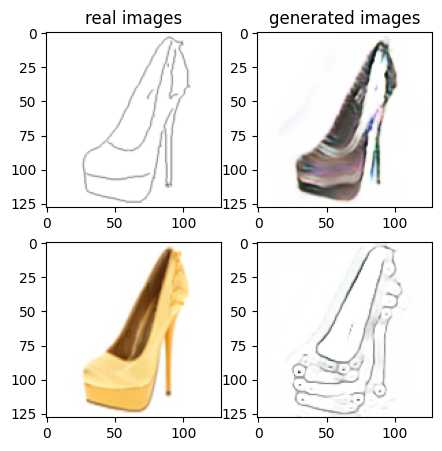

Train Epoch: 1 28% 	Total Loss: 1.307944 	Loss_G_AB: 0.278763	Loss_G_BA: 0.489035	Loss_cycle: 0.527772	Loss_D_A: 0.161899	Loss_D_B: 0.234374
0 14009 T:  1.7390186786651611
Train Epoch: 1 28% 	Total Loss: 1.549980 	Loss_G_AB: 0.360255	Loss_G_BA: 0.854847	Loss_cycle: 0.615622	Loss_D_A: 0.090400	Loss_D_B: 0.236407
0 14019 T:  0.9826843738555908
Train Epoch: 1 28% 	Total Loss: 1.525876 	Loss_G_AB: 0.340984	Loss_G_BA: 0.948392	Loss_cycle: 0.542100	Loss_D_A: 0.045886	Loss_D_B: 0.293202
0 14029 T:  0.9950985908508301
Train Epoch: 1 28% 	Total Loss: 1.634026 	Loss_G_AB: 0.299237	Loss_G_BA: 1.030955	Loss_cycle: 0.700987	Loss_D_A: 0.012824	Loss_D_B: 0.255119
0 14039 T:  1.003509283065796
Train Epoch: 1 28% 	Total Loss: 1.617701 	Loss_G_AB: 0.305187	Loss_G_BA: 0.928620	Loss_cycle: 0.712845	Loss_D_A: 0.031882	Loss_D_B: 0.256071
0 14049 T:  1.007617473602295
Train Epoch: 1 28% 	Total Loss: 1.730952 	Loss_G_AB: 0.320919	Loss_G_BA: 0.861918	Loss_cycle: 0.834679	Loss_D_A: 0.072782	Loss_D_B: 0.232072
0

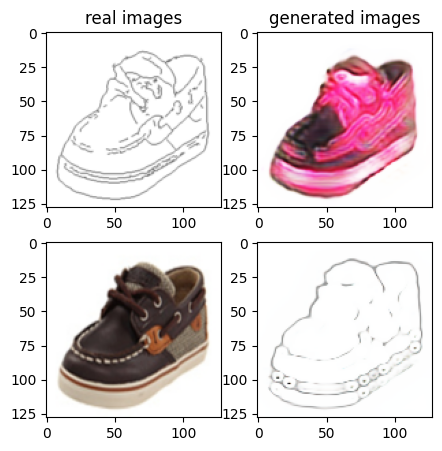

Train Epoch: 1 30% 	Total Loss: 1.477943 	Loss_G_AB: 0.317009	Loss_G_BA: 0.890458	Loss_cycle: 0.591498	Loss_D_A: 0.042501	Loss_D_B: 0.240211
0 15009 T:  2.5337047576904297
Train Epoch: 1 30% 	Total Loss: 1.759700 	Loss_G_AB: 0.352536	Loss_G_BA: 1.025582	Loss_cycle: 0.810166	Loss_D_A: 0.018103	Loss_D_B: 0.242372
0 15019 T:  1.0334908962249756
Train Epoch: 1 30% 	Total Loss: 1.565429 	Loss_G_AB: 0.273909	Loss_G_BA: 1.023603	Loss_cycle: 0.656559	Loss_D_A: 0.016209	Loss_D_B: 0.243905
0 15029 T:  1.0131680965423584
Train Epoch: 1 30% 	Total Loss: 1.345737 	Loss_G_AB: 0.299170	Loss_G_BA: 0.931108	Loss_cycle: 0.472688	Loss_D_A: 0.011258	Loss_D_B: 0.246651
0 15039 T:  0.9980049133300781
Train Epoch: 1 30% 	Total Loss: 1.523737 	Loss_G_AB: 0.297837	Loss_G_BA: 1.005229	Loss_cycle: 0.611312	Loss_D_A: 0.013160	Loss_D_B: 0.247732
0 15049 T:  0.983562707901001
Train Epoch: 1 30% 	Total Loss: 1.401825 	Loss_G_AB: 0.334193	Loss_G_BA: 0.840209	Loss_cycle: 0.506494	Loss_D_A: 0.053081	Loss_D_B: 0.255049


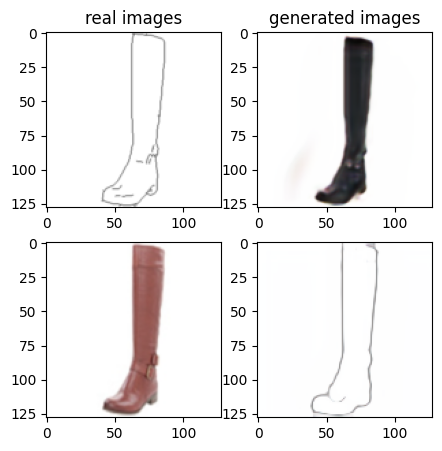

Train Epoch: 1 32% 	Total Loss: 1.552194 	Loss_G_AB: 0.301138	Loss_G_BA: 1.017738	Loss_cycle: 0.632983	Loss_D_A: 0.013300	Loss_D_B: 0.246473
0 16009 T:  2.0837931632995605
Train Epoch: 1 32% 	Total Loss: 1.272758 	Loss_G_AB: 0.286022	Loss_G_BA: 1.000734	Loss_cycle: 0.385599	Loss_D_A: 0.008139	Loss_D_B: 0.235641
0 16019 T:  0.9814901351928711
Train Epoch: 1 32% 	Total Loss: 1.430695 	Loss_G_AB: 0.274629	Loss_G_BA: 1.005376	Loss_cycle: 0.531382	Loss_D_A: 0.006669	Loss_D_B: 0.252642
0 16029 T:  0.9810125827789307
Train Epoch: 1 32% 	Total Loss: 1.318145 	Loss_G_AB: 0.288383	Loss_G_BA: 0.979324	Loss_cycle: 0.420177	Loss_D_A: 0.010914	Loss_D_B: 0.253200
0 16039 T:  0.9817848205566406
Train Epoch: 1 32% 	Total Loss: 1.503559 	Loss_G_AB: 0.298293	Loss_G_BA: 0.975431	Loss_cycle: 0.590531	Loss_D_A: 0.013259	Loss_D_B: 0.262907
0 16049 T:  0.9853429794311523
Train Epoch: 1 32% 	Total Loss: 1.598689 	Loss_G_AB: 0.301830	Loss_G_BA: 0.918446	Loss_cycle: 0.705751	Loss_D_A: 0.033851	Loss_D_B: 0.248949

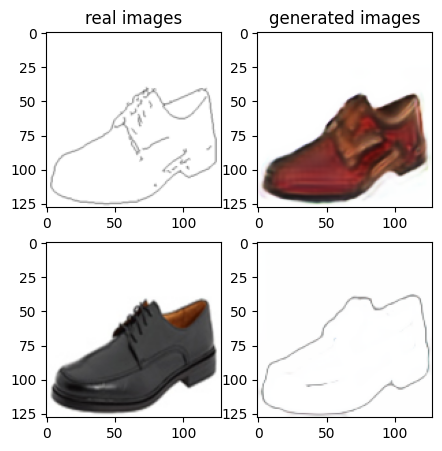

Train Epoch: 1 34% 	Total Loss: 1.514926 	Loss_G_AB: 0.336708	Loss_G_BA: 0.997401	Loss_cycle: 0.546435	Loss_D_A: 0.022447	Loss_D_B: 0.278989
0 17009 T:  2.3771955966949463
Train Epoch: 1 34% 	Total Loss: 1.590134 	Loss_G_AB: 0.272329	Loss_G_BA: 0.999472	Loss_cycle: 0.671142	Loss_D_A: 0.012673	Loss_D_B: 0.270418
0 17019 T:  1.0787584781646729
Train Epoch: 1 34% 	Total Loss: 1.412199 	Loss_G_AB: 0.298900	Loss_G_BA: 0.977367	Loss_cycle: 0.524790	Loss_D_A: 0.010046	Loss_D_B: 0.239229
0 17029 T:  1.0963935852050781
Train Epoch: 1 34% 	Total Loss: 1.576182 	Loss_G_AB: 0.315657	Loss_G_BA: 1.032506	Loss_cycle: 0.635222	Loss_D_A: 0.005440	Loss_D_B: 0.261438
0 17039 T:  1.0829145908355713
Train Epoch: 1 34% 	Total Loss: 1.422027 	Loss_G_AB: 0.279759	Loss_G_BA: 0.982207	Loss_cycle: 0.520472	Loss_D_A: 0.012554	Loss_D_B: 0.258018
0 17049 T:  1.15330171585083
Train Epoch: 1 34% 	Total Loss: 1.465463 	Loss_G_AB: 0.323166	Loss_G_BA: 0.794630	Loss_cycle: 0.568394	Loss_D_A: 0.086279	Loss_D_B: 0.251892
0

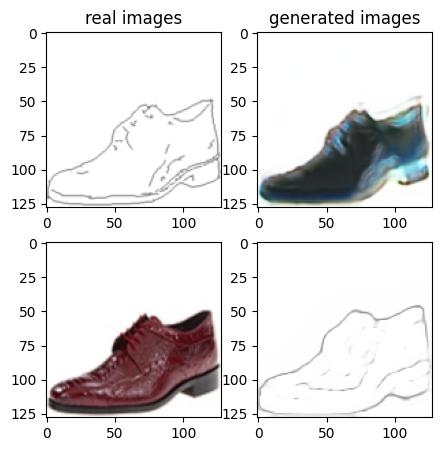

Train Epoch: 1 36% 	Total Loss: 1.480234 	Loss_G_AB: 0.342282	Loss_G_BA: 0.939710	Loss_cycle: 0.495441	Loss_D_A: 0.070766	Loss_D_B: 0.273030
0 18009 T:  1.7263681888580322
Train Epoch: 1 36% 	Total Loss: 1.331132 	Loss_G_AB: 0.329147	Loss_G_BA: 0.898993	Loss_cycle: 0.455306	Loss_D_A: 0.030064	Loss_D_B: 0.231691
0 18019 T:  0.9813086986541748
Train Epoch: 1 36% 	Total Loss: 1.515025 	Loss_G_AB: 0.287024	Loss_G_BA: 1.027163	Loss_cycle: 0.579193	Loss_D_A: 0.011539	Loss_D_B: 0.267200
0 18029 T:  0.9769115447998047
Train Epoch: 1 36% 	Total Loss: 1.728417 	Loss_G_AB: 0.322201	Loss_G_BA: 1.035962	Loss_cycle: 0.778317	Loss_D_A: 0.018711	Loss_D_B: 0.252308
0 18039 T:  0.9958479404449463
Train Epoch: 1 36% 	Total Loss: 1.375618 	Loss_G_AB: 0.305151	Loss_G_BA: 0.976009	Loss_cycle: 0.474262	Loss_D_A: 0.014740	Loss_D_B: 0.246035
0 18049 T:  1.0472702980041504
Train Epoch: 1 36% 	Total Loss: 1.403638 	Loss_G_AB: 0.297653	Loss_G_BA: 0.986035	Loss_cycle: 0.497454	Loss_D_A: 0.012423	Loss_D_B: 0.251916

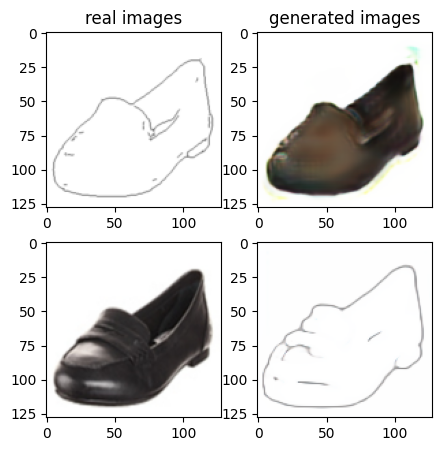

Train Epoch: 1 38% 	Total Loss: 1.371184 	Loss_G_AB: 0.290401	Loss_G_BA: 0.934217	Loss_cycle: 0.497767	Loss_D_A: 0.013073	Loss_D_B: 0.248035
0 19009 T:  2.072920799255371
Train Epoch: 1 38% 	Total Loss: 1.351077 	Loss_G_AB: 0.316171	Loss_G_BA: 0.943568	Loss_cycle: 0.455435	Loss_D_A: 0.030914	Loss_D_B: 0.234859
0 19019 T:  1.0036821365356445
Train Epoch: 1 38% 	Total Loss: 1.409919 	Loss_G_AB: 0.295826	Loss_G_BA: 0.856419	Loss_cycle: 0.522057	Loss_D_A: 0.051964	Loss_D_B: 0.259776
0 19029 T:  1.0054495334625244
Train Epoch: 1 38% 	Total Loss: 1.574113 	Loss_G_AB: 0.303854	Loss_G_BA: 0.950556	Loss_cycle: 0.677670	Loss_D_A: 0.027097	Loss_D_B: 0.242140
0 19039 T:  0.9919662475585938
Train Epoch: 1 38% 	Total Loss: 1.487267 	Loss_G_AB: 0.327276	Loss_G_BA: 0.839807	Loss_cycle: 0.583002	Loss_D_A: 0.082838	Loss_D_B: 0.237884
0 19049 T:  0.9873545169830322
Train Epoch: 1 38% 	Total Loss: 1.549316 	Loss_G_AB: 0.312884	Loss_G_BA: 0.693834	Loss_cycle: 0.591530	Loss_D_A: 0.204617	Loss_D_B: 0.249809


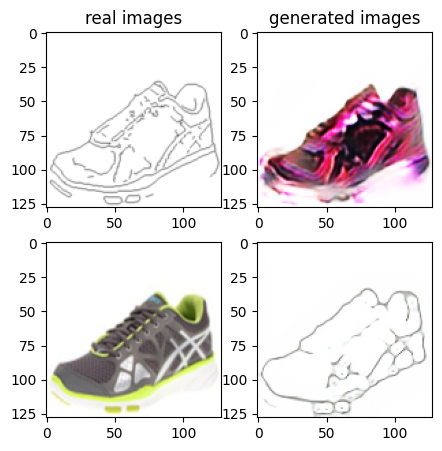

Train Epoch: 1 40% 	Total Loss: 1.462619 	Loss_G_AB: 0.314528	Loss_G_BA: 0.871277	Loss_cycle: 0.588550	Loss_D_A: 0.045357	Loss_D_B: 0.235810
0 20009 T:  1.7708613872528076
Train Epoch: 1 40% 	Total Loss: 1.498739 	Loss_G_AB: 0.303985	Loss_G_BA: 0.919585	Loss_cycle: 0.577219	Loss_D_A: 0.042706	Loss_D_B: 0.267028
0 20019 T:  0.9846391677856445
Train Epoch: 1 40% 	Total Loss: 1.429312 	Loss_G_AB: 0.358548	Loss_G_BA: 1.002157	Loss_cycle: 0.505463	Loss_D_A: 0.015323	Loss_D_B: 0.228174
0 20029 T:  0.984652042388916
Train Epoch: 1 40% 	Total Loss: 1.468167 	Loss_G_AB: 0.338024	Loss_G_BA: 0.956932	Loss_cycle: 0.508616	Loss_D_A: 0.025176	Loss_D_B: 0.286898
0 20039 T:  0.9887902736663818
Train Epoch: 1 40% 	Total Loss: 1.567830 	Loss_G_AB: 0.324249	Loss_G_BA: 0.802892	Loss_cycle: 0.620724	Loss_D_A: 0.141769	Loss_D_B: 0.241767
0 20049 T:  1.0081019401550293
Train Epoch: 1 40% 	Total Loss: 1.678244 	Loss_G_AB: 0.375269	Loss_G_BA: 0.781643	Loss_cycle: 0.790228	Loss_D_A: 0.081445	Loss_D_B: 0.228115


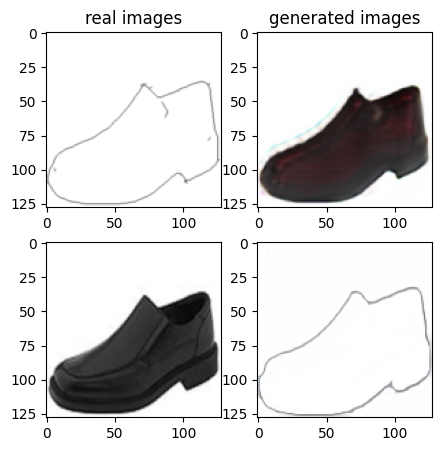

Train Epoch: 1 42% 	Total Loss: 1.386288 	Loss_G_AB: 0.321561	Loss_G_BA: 0.983122	Loss_cycle: 0.477540	Loss_D_A: 0.010746	Loss_D_B: 0.245660
0 21009 T:  1.7404365539550781
Train Epoch: 1 42% 	Total Loss: 1.645952 	Loss_G_AB: 0.300729	Loss_G_BA: 1.016093	Loss_cycle: 0.733232	Loss_D_A: 0.005797	Loss_D_B: 0.248512
0 21019 T:  0.9849040508270264
Train Epoch: 1 42% 	Total Loss: 1.480495 	Loss_G_AB: 0.321346	Loss_G_BA: 0.988618	Loss_cycle: 0.598956	Loss_D_A: 0.008703	Loss_D_B: 0.217853
0 21029 T:  0.9803271293640137
Train Epoch: 1 42% 	Total Loss: 1.446899 	Loss_G_AB: 0.322392	Loss_G_BA: 0.994731	Loss_cycle: 0.555369	Loss_D_A: 0.007201	Loss_D_B: 0.225767
0 21039 T:  0.9816453456878662
Train Epoch: 1 42% 	Total Loss: 1.389120 	Loss_G_AB: 0.351388	Loss_G_BA: 1.013856	Loss_cycle: 0.430236	Loss_D_A: 0.006355	Loss_D_B: 0.269907
0 21049 T:  0.9895176887512207
Train Epoch: 1 42% 	Total Loss: 1.401187 	Loss_G_AB: 0.333641	Loss_G_BA: 1.009330	Loss_cycle: 0.447429	Loss_D_A: 0.013031	Loss_D_B: 0.269242

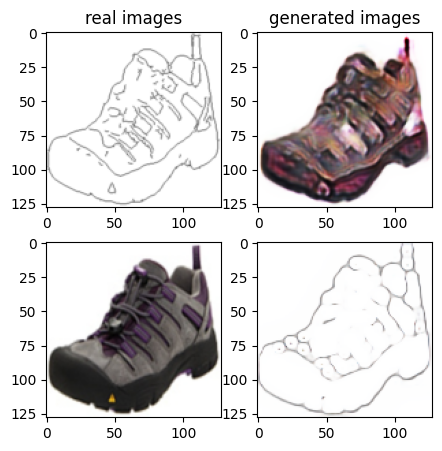

Train Epoch: 1 44% 	Total Loss: 1.439679 	Loss_G_AB: 0.308918	Loss_G_BA: 1.039155	Loss_cycle: 0.497971	Loss_D_A: 0.007436	Loss_D_B: 0.260236
0 22009 T:  1.7413249015808105
Train Epoch: 1 44% 	Total Loss: 1.354726 	Loss_G_AB: 0.311121	Loss_G_BA: 0.969643	Loss_cycle: 0.453748	Loss_D_A: 0.004269	Loss_D_B: 0.256327
0 22019 T:  0.9871726036071777
Train Epoch: 1 44% 	Total Loss: 1.333033 	Loss_G_AB: 0.255910	Loss_G_BA: 1.002861	Loss_cycle: 0.429609	Loss_D_A: 0.009062	Loss_D_B: 0.264977
0 22029 T:  0.9895548820495605
Train Epoch: 1 44% 	Total Loss: 1.452191 	Loss_G_AB: 0.313985	Loss_G_BA: 1.005439	Loss_cycle: 0.545811	Loss_D_A: 0.005803	Loss_D_B: 0.240865
0 22039 T:  0.9961535930633545
Train Epoch: 1 44% 	Total Loss: 1.382306 	Loss_G_AB: 0.308785	Loss_G_BA: 0.966584	Loss_cycle: 0.505165	Loss_D_A: 0.004672	Loss_D_B: 0.234785
0 22049 T:  1.006866693496704
Train Epoch: 1 44% 	Total Loss: 1.420334 	Loss_G_AB: 0.345166	Loss_G_BA: 0.961191	Loss_cycle: 0.501379	Loss_D_A: 0.009676	Loss_D_B: 0.256100


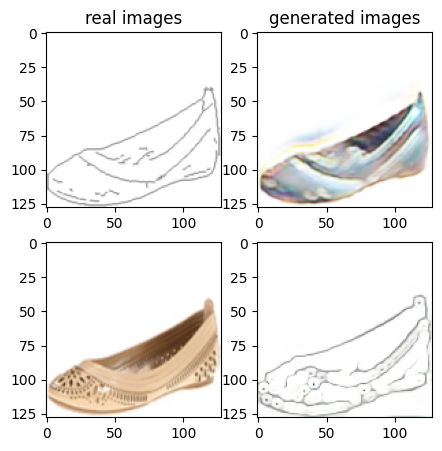

Train Epoch: 1 46% 	Total Loss: 1.489159 	Loss_G_AB: 0.317521	Loss_G_BA: 0.951508	Loss_cycle: 0.549696	Loss_D_A: 0.043080	Loss_D_B: 0.261868
0 23009 T:  2.3081538677215576
Train Epoch: 1 46% 	Total Loss: 1.657425 	Loss_G_AB: 0.337974	Loss_G_BA: 0.828949	Loss_cycle: 0.753715	Loss_D_A: 0.096996	Loss_D_B: 0.223254
0 23019 T:  1.0043838024139404
Train Epoch: 1 46% 	Total Loss: 1.278541 	Loss_G_AB: 0.272421	Loss_G_BA: 0.840438	Loss_cycle: 0.442076	Loss_D_A: 0.032631	Loss_D_B: 0.247404
0 23029 T:  0.9805784225463867
Train Epoch: 1 46% 	Total Loss: 1.405204 	Loss_G_AB: 0.356650	Loss_G_BA: 0.903284	Loss_cycle: 0.485296	Loss_D_A: 0.041205	Loss_D_B: 0.248736
0 23039 T:  0.9821066856384277
Train Epoch: 1 46% 	Total Loss: 1.412983 	Loss_G_AB: 0.295260	Loss_G_BA: 0.966317	Loss_cycle: 0.517371	Loss_D_A: 0.022570	Loss_D_B: 0.242254
0 23049 T:  0.9784133434295654
Train Epoch: 1 46% 	Total Loss: 1.468710 	Loss_G_AB: 0.292057	Loss_G_BA: 0.963236	Loss_cycle: 0.567600	Loss_D_A: 0.019177	Loss_D_B: 0.254286

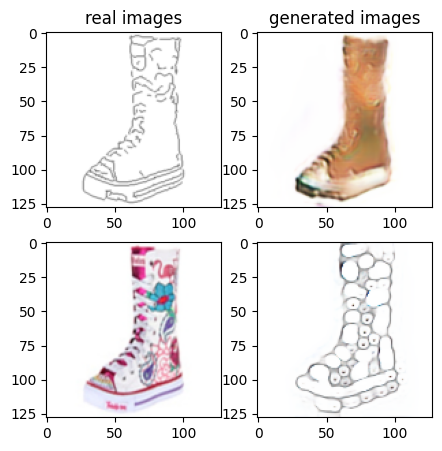

Train Epoch: 1 48% 	Total Loss: 1.437779 	Loss_G_AB: 0.339387	Loss_G_BA: 0.992446	Loss_cycle: 0.516856	Loss_D_A: 0.006931	Loss_D_B: 0.248076
0 24009 T:  1.7444005012512207
Train Epoch: 1 48% 	Total Loss: 1.458251 	Loss_G_AB: 0.286799	Loss_G_BA: 0.976057	Loss_cycle: 0.553716	Loss_D_A: 0.008476	Loss_D_B: 0.264631
0 24019 T:  0.9830691814422607
Train Epoch: 1 48% 	Total Loss: 1.492141 	Loss_G_AB: 0.319115	Loss_G_BA: 1.018341	Loss_cycle: 0.578509	Loss_D_A: 0.004662	Loss_D_B: 0.240242
0 24029 T:  0.9830803871154785
Train Epoch: 1 48% 	Total Loss: 1.406330 	Loss_G_AB: 0.404755	Loss_G_BA: 0.985182	Loss_cycle: 0.483214	Loss_D_A: 0.004184	Loss_D_B: 0.223963
0 24039 T:  0.9862515926361084
Train Epoch: 1 48% 	Total Loss: 1.490262 	Loss_G_AB: 0.306483	Loss_G_BA: 0.982560	Loss_cycle: 0.516064	Loss_D_A: 0.004380	Loss_D_B: 0.325297
0 24049 T:  0.9845991134643555
Train Epoch: 1 48% 	Total Loss: 1.398988 	Loss_G_AB: 0.309178	Loss_G_BA: 1.007045	Loss_cycle: 0.474660	Loss_D_A: 0.006765	Loss_D_B: 0.259452

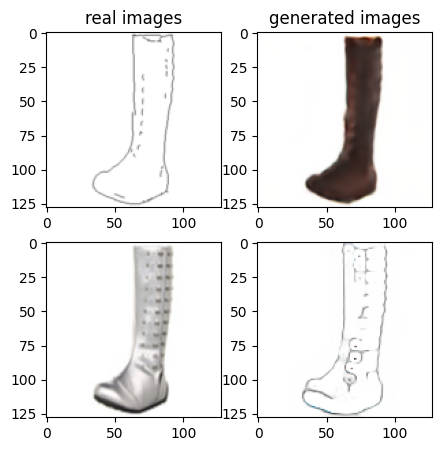

Train Epoch: 1 50% 	Total Loss: 1.338345 	Loss_G_AB: 0.300363	Loss_G_BA: 0.975254	Loss_cycle: 0.460805	Loss_D_A: 0.011217	Loss_D_B: 0.228514
0 25009 T:  1.7421960830688477
Train Epoch: 1 50% 	Total Loss: 1.364564 	Loss_G_AB: 0.329123	Loss_G_BA: 0.909726	Loss_cycle: 0.466776	Loss_D_A: 0.028069	Loss_D_B: 0.250294
0 25019 T:  0.9806740283966064
Train Epoch: 1 50% 	Total Loss: 1.388372 	Loss_G_AB: 0.328809	Loss_G_BA: 1.026512	Loss_cycle: 0.448049	Loss_D_A: 0.021899	Loss_D_B: 0.240764
0 25029 T:  0.9805128574371338
Train Epoch: 1 50% 	Total Loss: 1.337238 	Loss_G_AB: 0.277693	Loss_G_BA: 0.957605	Loss_cycle: 0.444252	Loss_D_A: 0.017147	Loss_D_B: 0.258189
0 25039 T:  0.9821135997772217
Train Epoch: 1 50% 	Total Loss: 1.338782 	Loss_G_AB: 0.278822	Loss_G_BA: 0.947692	Loss_cycle: 0.424751	Loss_D_A: 0.033837	Loss_D_B: 0.266936
0 25049 T:  1.0119819641113281
Train Epoch: 1 50% 	Total Loss: 1.314251 	Loss_G_AB: 0.294464	Loss_G_BA: 0.906564	Loss_cycle: 0.438079	Loss_D_A: 0.039952	Loss_D_B: 0.235706

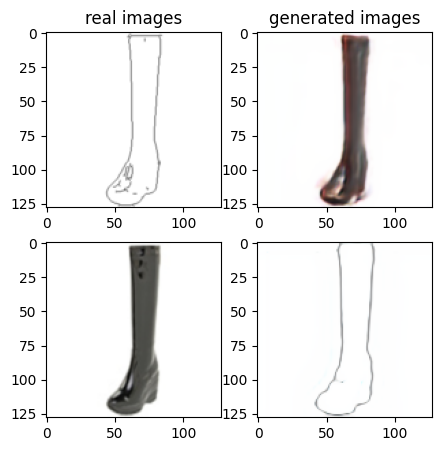

Train Epoch: 1 52% 	Total Loss: 1.560545 	Loss_G_AB: 0.334645	Loss_G_BA: 0.918882	Loss_cycle: 0.646995	Loss_D_A: 0.055112	Loss_D_B: 0.231675
0 26009 T:  1.7257776260375977
Train Epoch: 1 52% 	Total Loss: 1.667114 	Loss_G_AB: 0.274584	Loss_G_BA: 1.037092	Loss_cycle: 0.710809	Loss_D_A: 0.016106	Loss_D_B: 0.284361
0 26019 T:  1.005124807357788
Train Epoch: 1 52% 	Total Loss: 1.395300 	Loss_G_AB: 0.341749	Loss_G_BA: 0.977483	Loss_cycle: 0.508558	Loss_D_A: 0.025119	Loss_D_B: 0.202006
0 26029 T:  1.0095124244689941
Train Epoch: 1 52% 	Total Loss: 1.425455 	Loss_G_AB: 0.265805	Loss_G_BA: 0.925738	Loss_cycle: 0.501081	Loss_D_A: 0.032478	Loss_D_B: 0.296125
0 26039 T:  1.0992846488952637
Train Epoch: 1 52% 	Total Loss: 1.512474 	Loss_G_AB: 0.298203	Loss_G_BA: 1.003963	Loss_cycle: 0.567979	Loss_D_A: 0.025661	Loss_D_B: 0.267750
0 26049 T:  1.1404964923858643
Train Epoch: 1 52% 	Total Loss: 1.505623 	Loss_G_AB: 0.345963	Loss_G_BA: 0.944368	Loss_cycle: 0.602565	Loss_D_A: 0.031911	Loss_D_B: 0.225982


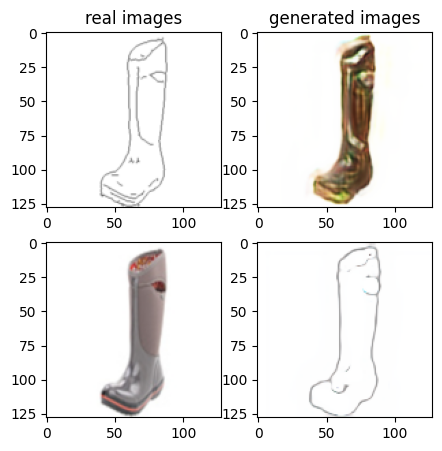

Train Epoch: 1 54% 	Total Loss: 1.481887 	Loss_G_AB: 0.283699	Loss_G_BA: 1.036217	Loss_cycle: 0.540919	Loss_D_A: 0.026562	Loss_D_B: 0.254448
0 27009 T:  2.269923686981201
Train Epoch: 1 54% 	Total Loss: 1.481726 	Loss_G_AB: 0.288848	Loss_G_BA: 0.942642	Loss_cycle: 0.589670	Loss_D_A: 0.020920	Loss_D_B: 0.255391
0 27019 T:  1.0507838726043701
Train Epoch: 1 54% 	Total Loss: 1.330254 	Loss_G_AB: 0.268880	Loss_G_BA: 0.867214	Loss_cycle: 0.464971	Loss_D_A: 0.050786	Loss_D_B: 0.246451
0 27029 T:  0.9822416305541992
Train Epoch: 1 54% 	Total Loss: 1.436431 	Loss_G_AB: 0.278484	Loss_G_BA: 1.037090	Loss_cycle: 0.469904	Loss_D_A: 0.042755	Loss_D_B: 0.265986
0 27039 T:  0.9830124378204346
Train Epoch: 1 54% 	Total Loss: 1.347458 	Loss_G_AB: 0.261879	Loss_G_BA: 0.833038	Loss_cycle: 0.446686	Loss_D_A: 0.103985	Loss_D_B: 0.249328
0 27049 T:  0.9823513031005859
Train Epoch: 1 54% 	Total Loss: 1.373731 	Loss_G_AB: 0.291701	Loss_G_BA: 0.857521	Loss_cycle: 0.415937	Loss_D_A: 0.120470	Loss_D_B: 0.262713


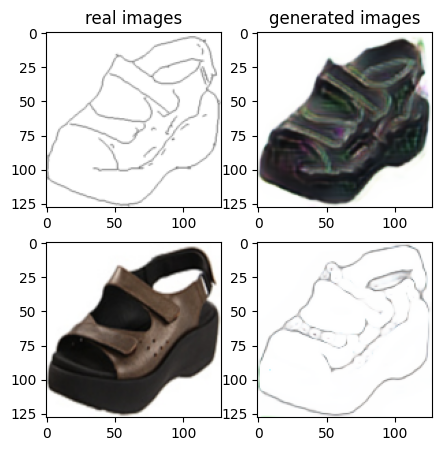

Train Epoch: 1 56% 	Total Loss: 1.358575 	Loss_G_AB: 0.285906	Loss_G_BA: 0.985604	Loss_cycle: 0.453771	Loss_D_A: 0.003342	Loss_D_B: 0.265707
0 28009 T:  1.7325809001922607
Train Epoch: 1 56% 	Total Loss: 1.433548 	Loss_G_AB: 0.296036	Loss_G_BA: 1.002684	Loss_cycle: 0.539478	Loss_D_A: 0.003476	Loss_D_B: 0.241234
0 28019 T:  0.9835948944091797
Train Epoch: 1 56% 	Total Loss: 1.423655 	Loss_G_AB: 0.303437	Loss_G_BA: 0.991058	Loss_cycle: 0.528407	Loss_D_A: 0.002427	Loss_D_B: 0.245572
0 28029 T:  0.9838128089904785
Train Epoch: 1 56% 	Total Loss: 1.432850 	Loss_G_AB: 0.298600	Loss_G_BA: 0.995622	Loss_cycle: 0.518738	Loss_D_A: 0.005085	Loss_D_B: 0.261917
0 28039 T:  0.9811923503875732
Train Epoch: 1 56% 	Total Loss: 1.329554 	Loss_G_AB: 0.292232	Loss_G_BA: 1.007758	Loss_cycle: 0.447782	Loss_D_A: 0.002874	Loss_D_B: 0.228903
0 28049 T:  0.9800853729248047
Train Epoch: 1 56% 	Total Loss: 1.334640 	Loss_G_AB: 0.322053	Loss_G_BA: 0.997459	Loss_cycle: 0.433055	Loss_D_A: 0.008175	Loss_D_B: 0.233654

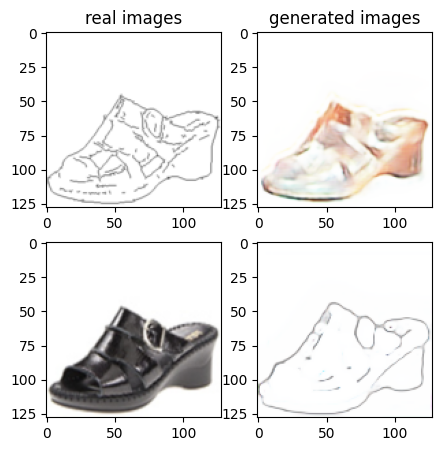

Train Epoch: 1 58% 	Total Loss: 1.376823 	Loss_G_AB: 0.255860	Loss_G_BA: 0.926657	Loss_cycle: 0.469039	Loss_D_A: 0.027149	Loss_D_B: 0.289376
0 29009 T:  1.7297916412353516
Train Epoch: 1 58% 	Total Loss: 1.316661 	Loss_G_AB: 0.374816	Loss_G_BA: 0.993224	Loss_cycle: 0.378171	Loss_D_A: 0.016440	Loss_D_B: 0.238030
0 29019 T:  0.9809277057647705
Train Epoch: 1 58% 	Total Loss: 1.350517 	Loss_G_AB: 0.287750	Loss_G_BA: 0.992775	Loss_cycle: 0.448591	Loss_D_A: 0.007403	Loss_D_B: 0.254261
0 29029 T:  0.9776902198791504
Train Epoch: 1 58% 	Total Loss: 1.373041 	Loss_G_AB: 0.300368	Loss_G_BA: 0.996705	Loss_cycle: 0.479290	Loss_D_A: 0.005197	Loss_D_B: 0.240017
0 29039 T:  0.978607177734375
Train Epoch: 1 58% 	Total Loss: 1.536030 	Loss_G_AB: 0.288030	Loss_G_BA: 1.017004	Loss_cycle: 0.578664	Loss_D_A: 0.003595	Loss_D_B: 0.301255
0 29049 T:  0.9794695377349854
Train Epoch: 1 58% 	Total Loss: 1.476041 	Loss_G_AB: 0.329105	Loss_G_BA: 0.988429	Loss_cycle: 0.586112	Loss_D_A: 0.010785	Loss_D_B: 0.220376


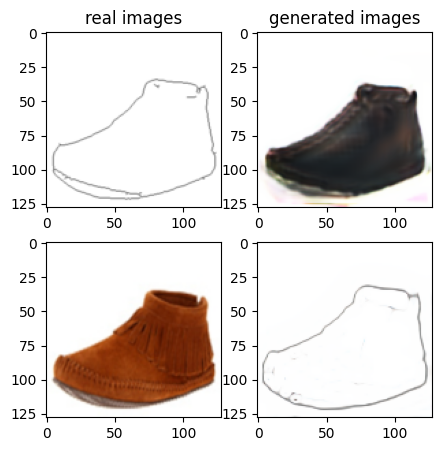

Train Epoch: 1 60% 	Total Loss: 1.368729 	Loss_G_AB: 0.294651	Loss_G_BA: 0.867179	Loss_cycle: 0.480820	Loss_D_A: 0.056915	Loss_D_B: 0.250079
0 30009 T:  1.9575822353363037
Train Epoch: 1 60% 	Total Loss: 1.279634 	Loss_G_AB: 0.272189	Loss_G_BA: 1.008986	Loss_cycle: 0.376306	Loss_D_A: 0.009914	Loss_D_B: 0.252826
0 30019 T:  0.9778957366943359
Train Epoch: 1 60% 	Total Loss: 1.323318 	Loss_G_AB: 0.305034	Loss_G_BA: 0.994147	Loss_cycle: 0.387721	Loss_D_A: 0.028714	Loss_D_B: 0.257293
0 30029 T:  0.9768335819244385
Train Epoch: 1 60% 	Total Loss: 1.547300 	Loss_G_AB: 0.324664	Loss_G_BA: 0.999608	Loss_cycle: 0.643481	Loss_D_A: 0.005498	Loss_D_B: 0.236185
0 30039 T:  0.9889786243438721
Train Epoch: 1 60% 	Total Loss: 1.390064 	Loss_G_AB: 0.281294	Loss_G_BA: 1.004350	Loss_cycle: 0.484954	Loss_D_A: 0.011698	Loss_D_B: 0.250590
0 30049 T:  1.0259325504302979
Train Epoch: 1 60% 	Total Loss: 1.343727 	Loss_G_AB: 0.298728	Loss_G_BA: 0.927503	Loss_cycle: 0.482482	Loss_D_A: 0.012971	Loss_D_B: 0.235158

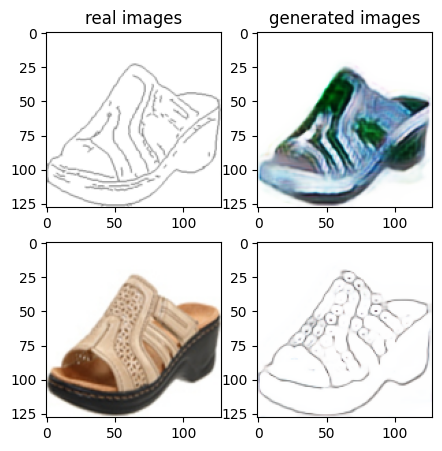

Train Epoch: 1 62% 	Total Loss: 1.353272 	Loss_G_AB: 0.288092	Loss_G_BA: 0.942542	Loss_cycle: 0.434136	Loss_D_A: 0.042076	Loss_D_B: 0.261743
0 31009 T:  2.0129613876342773
Train Epoch: 1 62% 	Total Loss: 1.393490 	Loss_G_AB: 0.286225	Loss_G_BA: 0.892194	Loss_cycle: 0.508853	Loss_D_A: 0.048389	Loss_D_B: 0.247039
0 31019 T:  1.0178327560424805
Train Epoch: 1 62% 	Total Loss: 1.421910 	Loss_G_AB: 0.295933	Loss_G_BA: 1.004984	Loss_cycle: 0.485362	Loss_D_A: 0.037393	Loss_D_B: 0.248696
0 31029 T:  1.0075201988220215
Train Epoch: 1 62% 	Total Loss: 1.538764 	Loss_G_AB: 0.314186	Loss_G_BA: 1.040156	Loss_cycle: 0.612140	Loss_D_A: 0.006464	Loss_D_B: 0.242989
0 31039 T:  0.9902355670928955
Train Epoch: 1 62% 	Total Loss: 1.378782 	Loss_G_AB: 0.330206	Loss_G_BA: 0.994430	Loss_cycle: 0.475507	Loss_D_A: 0.004959	Loss_D_B: 0.235999
0 31049 T:  0.9790709018707275
Train Epoch: 1 62% 	Total Loss: 1.398438 	Loss_G_AB: 0.263933	Loss_G_BA: 1.011668	Loss_cycle: 0.487458	Loss_D_A: 0.004381	Loss_D_B: 0.268798

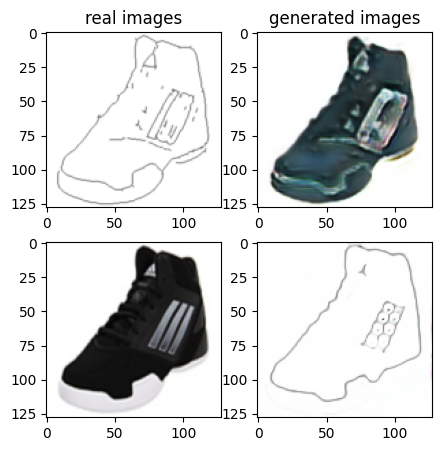

Train Epoch: 1 64% 	Total Loss: 1.338596 	Loss_G_AB: 0.326167	Loss_G_BA: 1.003184	Loss_cycle: 0.433187	Loss_D_A: 0.005761	Loss_D_B: 0.234973
0 32009 T:  1.7606747150421143
Train Epoch: 1 64% 	Total Loss: 1.329459 	Loss_G_AB: 0.265292	Loss_G_BA: 1.026999	Loss_cycle: 0.430054	Loss_D_A: 0.005344	Loss_D_B: 0.247915
0 32019 T:  0.9816880226135254
Train Epoch: 1 64% 	Total Loss: 1.345040 	Loss_G_AB: 0.257077	Loss_G_BA: 0.971566	Loss_cycle: 0.446304	Loss_D_A: 0.004563	Loss_D_B: 0.279851
0 32029 T:  0.9838647842407227
Train Epoch: 1 64% 	Total Loss: 1.395928 	Loss_G_AB: 0.314910	Loss_G_BA: 0.999288	Loss_cycle: 0.500523	Loss_D_A: 0.004769	Loss_D_B: 0.233536
0 32039 T:  0.9836220741271973
Train Epoch: 1 64% 	Total Loss: 1.196887 	Loss_G_AB: 0.312038	Loss_G_BA: 0.782630	Loss_cycle: 0.331753	Loss_D_A: 0.059550	Loss_D_B: 0.258249
0 32049 T:  0.9843902587890625
Train Epoch: 1 64% 	Total Loss: 1.500045 	Loss_G_AB: 0.311536	Loss_G_BA: 0.847779	Loss_cycle: 0.467711	Loss_D_A: 0.218556	Loss_D_B: 0.234121

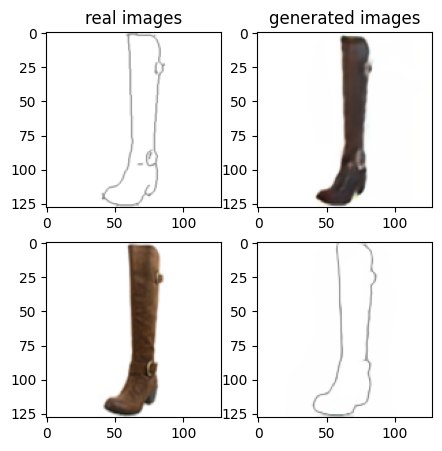

Train Epoch: 1 66% 	Total Loss: 1.278527 	Loss_G_AB: 0.289353	Loss_G_BA: 0.981154	Loss_cycle: 0.405463	Loss_D_A: 0.005610	Loss_D_B: 0.232201
0 33009 T:  2.4040591716766357
Train Epoch: 1 66% 	Total Loss: 1.411037 	Loss_G_AB: 0.320700	Loss_G_BA: 1.006502	Loss_cycle: 0.514250	Loss_D_A: 0.005421	Loss_D_B: 0.227766
0 33019 T:  1.0776100158691406
Train Epoch: 1 66% 	Total Loss: 1.421101 	Loss_G_AB: 0.321421	Loss_G_BA: 1.011312	Loss_cycle: 0.516218	Loss_D_A: 0.002953	Loss_D_B: 0.235564
0 33029 T:  1.0867125988006592
Train Epoch: 1 66% 	Total Loss: 1.277228 	Loss_G_AB: 0.323987	Loss_G_BA: 0.981700	Loss_cycle: 0.368775	Loss_D_A: 0.003542	Loss_D_B: 0.252068
0 33039 T:  1.0789034366607666
Train Epoch: 1 66% 	Total Loss: 1.291892 	Loss_G_AB: 0.368862	Loss_G_BA: 1.010070	Loss_cycle: 0.354478	Loss_D_A: 0.003755	Loss_D_B: 0.244194
0 33049 T:  1.1715974807739258
Train Epoch: 1 66% 	Total Loss: 1.446470 	Loss_G_AB: 0.324829	Loss_G_BA: 1.009496	Loss_cycle: 0.537872	Loss_D_A: 0.003089	Loss_D_B: 0.238347

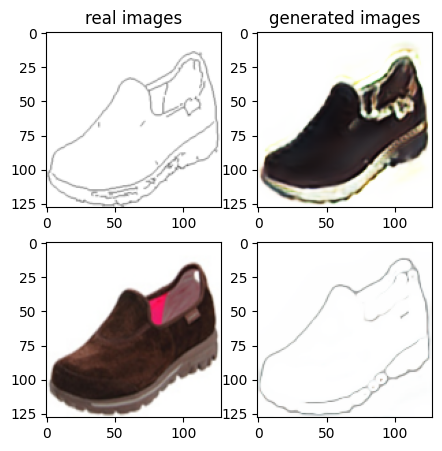

Train Epoch: 1 68% 	Total Loss: 1.469749 	Loss_G_AB: 0.317410	Loss_G_BA: 0.994090	Loss_cycle: 0.581573	Loss_D_A: 0.003519	Loss_D_B: 0.228907
0 34009 T:  1.7220466136932373
Train Epoch: 1 68% 	Total Loss: 1.429064 	Loss_G_AB: 0.349005	Loss_G_BA: 0.994743	Loss_cycle: 0.519520	Loss_D_A: 0.004116	Loss_D_B: 0.233554
0 34019 T:  0.9836881160736084
Train Epoch: 1 68% 	Total Loss: 1.408472 	Loss_G_AB: 0.264943	Loss_G_BA: 0.981002	Loss_cycle: 0.488833	Loss_D_A: 0.003492	Loss_D_B: 0.293174
0 34029 T:  0.998572587966919
Train Epoch: 1 68% 	Total Loss: 1.397230 	Loss_G_AB: 0.272829	Loss_G_BA: 1.004852	Loss_cycle: 0.483054	Loss_D_A: 0.008670	Loss_D_B: 0.266665
0 34039 T:  1.020068645477295
Train Epoch: 1 68% 	Total Loss: 1.242982 	Loss_G_AB: 0.299345	Loss_G_BA: 0.985694	Loss_cycle: 0.338391	Loss_D_A: 0.006616	Loss_D_B: 0.255456
0 34049 T:  1.0140843391418457
Train Epoch: 1 68% 	Total Loss: 1.524190 	Loss_G_AB: 0.294871	Loss_G_BA: 1.004559	Loss_cycle: 0.633946	Loss_D_A: 0.003205	Loss_D_B: 0.237324
0

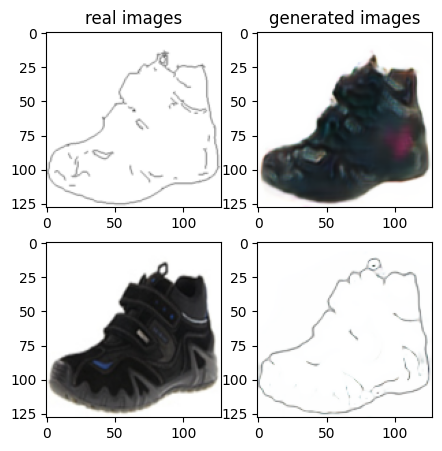

Train Epoch: 1 70% 	Total Loss: 1.284503 	Loss_G_AB: 0.277554	Loss_G_BA: 0.841977	Loss_cycle: 0.369144	Loss_D_A: 0.101044	Loss_D_B: 0.254549
0 35009 T:  2.043520450592041
Train Epoch: 1 70% 	Total Loss: 1.482929 	Loss_G_AB: 0.307915	Loss_G_BA: 0.884912	Loss_cycle: 0.565919	Loss_D_A: 0.089913	Loss_D_B: 0.230684
0 35019 T:  1.0239288806915283
Train Epoch: 1 70% 	Total Loss: 1.524885 	Loss_G_AB: 0.285925	Loss_G_BA: 1.049985	Loss_cycle: 0.602146	Loss_D_A: 0.008111	Loss_D_B: 0.246672
0 35029 T:  0.9802074432373047
Train Epoch: 1 70% 	Total Loss: 1.382325 	Loss_G_AB: 0.320172	Loss_G_BA: 0.987356	Loss_cycle: 0.473789	Loss_D_A: 0.006226	Loss_D_B: 0.248546
0 35039 T:  0.9830315113067627
Train Epoch: 1 70% 	Total Loss: 1.475998 	Loss_G_AB: 0.272901	Loss_G_BA: 0.977953	Loss_cycle: 0.562371	Loss_D_A: 0.024860	Loss_D_B: 0.263339
0 35049 T:  0.9842288494110107
Train Epoch: 1 70% 	Total Loss: 1.483054 	Loss_G_AB: 0.300794	Loss_G_BA: 0.906552	Loss_cycle: 0.571145	Loss_D_A: 0.056512	Loss_D_B: 0.251724


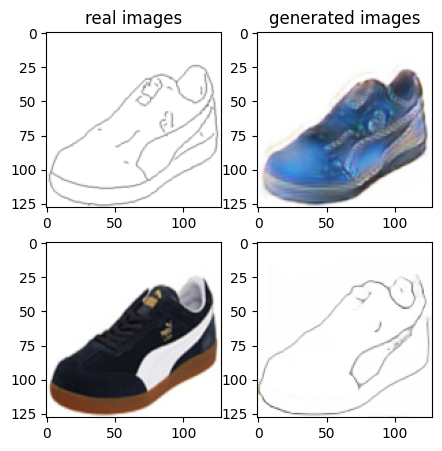

Train Epoch: 1 72% 	Total Loss: 1.391892 	Loss_G_AB: 0.327682	Loss_G_BA: 0.976563	Loss_cycle: 0.534050	Loss_D_A: 0.003905	Loss_D_B: 0.201814
0 36009 T:  2.118443012237549
Train Epoch: 1 72% 	Total Loss: 1.482679 	Loss_G_AB: 0.360011	Loss_G_BA: 1.018888	Loss_cycle: 0.516428	Loss_D_A: 0.006946	Loss_D_B: 0.269855
0 36019 T:  0.979466438293457
Train Epoch: 1 72% 	Total Loss: 1.396989 	Loss_G_AB: 0.349199	Loss_G_BA: 0.974667	Loss_cycle: 0.480198	Loss_D_A: 0.003917	Loss_D_B: 0.250940
0 36029 T:  0.9790744781494141
Train Epoch: 1 72% 	Total Loss: 1.354674 	Loss_G_AB: 0.275300	Loss_G_BA: 1.010937	Loss_cycle: 0.454998	Loss_D_A: 0.004128	Loss_D_B: 0.252428
0 36039 T:  0.9865071773529053
Train Epoch: 1 72% 	Total Loss: 1.383336 	Loss_G_AB: 0.307578	Loss_G_BA: 1.004441	Loss_cycle: 0.497902	Loss_D_A: 0.003562	Loss_D_B: 0.225862
0 36049 T:  0.9798839092254639
Train Epoch: 1 72% 	Total Loss: 1.662474 	Loss_G_AB: 0.324261	Loss_G_BA: 0.990441	Loss_cycle: 0.761762	Loss_D_A: 0.004042	Loss_D_B: 0.239319
0

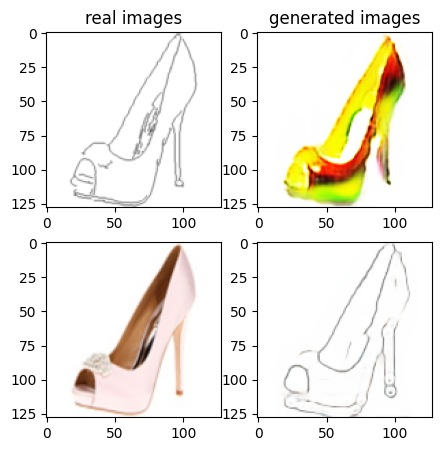

Train Epoch: 1 74% 	Total Loss: 1.356216 	Loss_G_AB: 0.348769	Loss_G_BA: 0.972360	Loss_cycle: 0.427684	Loss_D_A: 0.026153	Loss_D_B: 0.241815
0 37009 T:  2.0601160526275635
Train Epoch: 1 74% 	Total Loss: 1.307395 	Loss_G_AB: 0.317257	Loss_G_BA: 0.787065	Loss_cycle: 0.380505	Loss_D_A: 0.131091	Loss_D_B: 0.243638
0 37019 T:  0.9851927757263184
Train Epoch: 1 74% 	Total Loss: 1.220273 	Loss_G_AB: 0.288775	Loss_G_BA: 0.802738	Loss_cycle: 0.353424	Loss_D_A: 0.078403	Loss_D_B: 0.242690
0 37029 T:  0.9779841899871826
Train Epoch: 1 74% 	Total Loss: 1.375934 	Loss_G_AB: 0.316323	Loss_G_BA: 0.863611	Loss_cycle: 0.487584	Loss_D_A: 0.043198	Loss_D_B: 0.255185
0 37039 T:  0.9835939407348633
Train Epoch: 1 74% 	Total Loss: 1.497725 	Loss_G_AB: 0.313499	Loss_G_BA: 1.029858	Loss_cycle: 0.542219	Loss_D_A: 0.011467	Loss_D_B: 0.272361
0 37049 T:  0.9920763969421387
Train Epoch: 1 74% 	Total Loss: 1.436144 	Loss_G_AB: 0.348213	Loss_G_BA: 0.880003	Loss_cycle: 0.450910	Loss_D_A: 0.070493	Loss_D_B: 0.300633

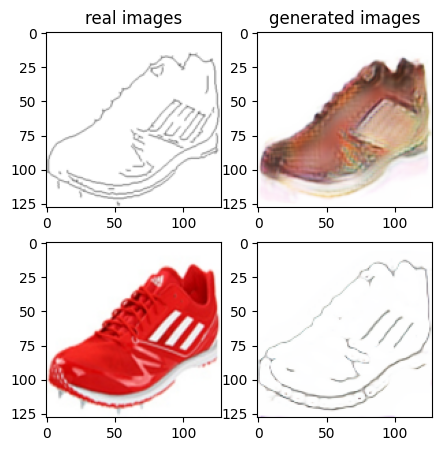

Train Epoch: 1 76% 	Total Loss: 1.382346 	Loss_G_AB: 0.312514	Loss_G_BA: 0.973947	Loss_cycle: 0.489960	Loss_D_A: 0.021491	Loss_D_B: 0.227665
0 38009 T:  1.9388172626495361
Train Epoch: 1 76% 	Total Loss: 1.422844 	Loss_G_AB: 0.321673	Loss_G_BA: 1.002272	Loss_cycle: 0.501126	Loss_D_A: 0.005896	Loss_D_B: 0.253850
0 38019 T:  0.979588508605957
Train Epoch: 1 76% 	Total Loss: 1.449727 	Loss_G_AB: 0.259268	Loss_G_BA: 1.009637	Loss_cycle: 0.545416	Loss_D_A: 0.002956	Loss_D_B: 0.266903
0 38029 T:  0.9798047542572021
Train Epoch: 1 76% 	Total Loss: 1.204532 	Loss_G_AB: 0.284981	Loss_G_BA: 0.975786	Loss_cycle: 0.333774	Loss_D_A: 0.007622	Loss_D_B: 0.232753
0 38039 T:  0.9822824001312256
Train Epoch: 1 76% 	Total Loss: 1.230694 	Loss_G_AB: 0.332418	Loss_G_BA: 1.016854	Loss_cycle: 0.332530	Loss_D_A: 0.008155	Loss_D_B: 0.215373
0 38049 T:  0.9866297245025635
Train Epoch: 1 76% 	Total Loss: 1.373989 	Loss_G_AB: 0.347108	Loss_G_BA: 1.005477	Loss_cycle: 0.455168	Loss_D_A: 0.004521	Loss_D_B: 0.238008


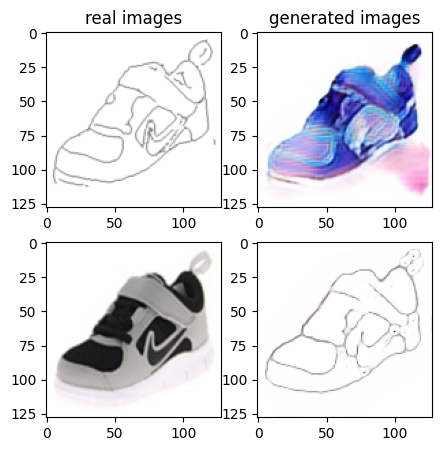

Train Epoch: 1 78% 	Total Loss: 1.297556 	Loss_G_AB: 0.325680	Loss_G_BA: 0.984090	Loss_cycle: 0.412799	Loss_D_A: 0.003623	Loss_D_B: 0.226249
0 39009 T:  1.7258107662200928
Train Epoch: 1 78% 	Total Loss: 1.327686 	Loss_G_AB: 0.285798	Loss_G_BA: 0.990000	Loss_cycle: 0.428363	Loss_D_A: 0.002066	Loss_D_B: 0.259358
0 39019 T:  0.9810807704925537
Train Epoch: 1 78% 	Total Loss: 1.294358 	Loss_G_AB: 0.286597	Loss_G_BA: 1.014120	Loss_cycle: 0.395982	Loss_D_A: 0.003897	Loss_D_B: 0.244121
0 39029 T:  0.9799292087554932
Train Epoch: 1 78% 	Total Loss: 1.306985 	Loss_G_AB: 0.290973	Loss_G_BA: 0.977434	Loss_cycle: 0.412263	Loss_D_A: 0.003299	Loss_D_B: 0.257220
0 39039 T:  0.9802024364471436
Train Epoch: 1 78% 	Total Loss: 1.415897 	Loss_G_AB: 0.289517	Loss_G_BA: 0.958248	Loss_cycle: 0.529718	Loss_D_A: 0.029240	Loss_D_B: 0.233057
0 39049 T:  1.0225350856781006
Train Epoch: 1 78% 	Total Loss: 1.312813 	Loss_G_AB: 0.365220	Loss_G_BA: 0.926015	Loss_cycle: 0.404202	Loss_D_A: 0.023088	Loss_D_B: 0.239906

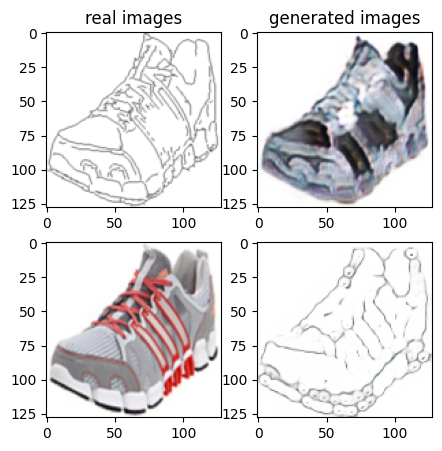

Train Epoch: 1 80% 	Total Loss: 1.404545 	Loss_G_AB: 0.280582	Loss_G_BA: 0.991186	Loss_cycle: 0.490625	Loss_D_A: 0.020129	Loss_D_B: 0.257907
0 40009 T:  1.7413842678070068
Train Epoch: 1 80% 	Total Loss: 1.314924 	Loss_G_AB: 0.285636	Loss_G_BA: 0.990071	Loss_cycle: 0.438718	Loss_D_A: 0.007519	Loss_D_B: 0.230833
0 40019 T:  0.9843106269836426
Train Epoch: 1 80% 	Total Loss: 1.295168 	Loss_G_AB: 0.310704	Loss_G_BA: 0.949487	Loss_cycle: 0.411836	Loss_D_A: 0.024687	Loss_D_B: 0.228549
0 40029 T:  0.9928812980651855
Train Epoch: 1 80% 	Total Loss: 1.350095 	Loss_G_AB: 0.287610	Loss_G_BA: 0.871124	Loss_cycle: 0.358639	Loss_D_A: 0.147983	Loss_D_B: 0.264107
0 40039 T:  1.0178632736206055
Train Epoch: 1 80% 	Total Loss: 1.321708 	Loss_G_AB: 0.360068	Loss_G_BA: 0.766359	Loss_cycle: 0.441311	Loss_D_A: 0.070199	Loss_D_B: 0.246984
0 40049 T:  1.0160315036773682
Train Epoch: 1 80% 	Total Loss: 1.285110 	Loss_G_AB: 0.279352	Loss_G_BA: 0.852751	Loss_cycle: 0.409124	Loss_D_A: 0.046915	Loss_D_B: 0.263019

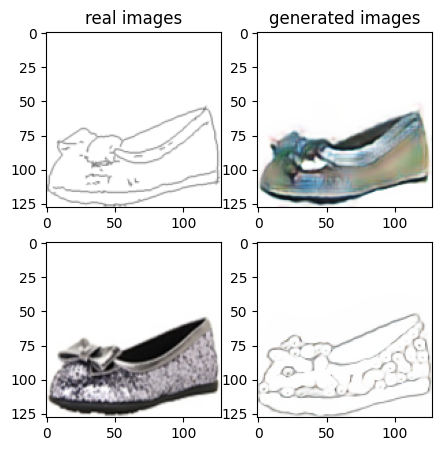

Train Epoch: 1 82% 	Total Loss: 1.328534 	Loss_G_AB: 0.313376	Loss_G_BA: 0.988867	Loss_cycle: 0.393360	Loss_D_A: 0.002697	Loss_D_B: 0.281357
0 41009 T:  2.1161458492279053
Train Epoch: 1 82% 	Total Loss: 1.420641 	Loss_G_AB: 0.418649	Loss_G_BA: 0.996417	Loss_cycle: 0.482483	Loss_D_A: 0.003652	Loss_D_B: 0.226972
0 41019 T:  1.038733720779419
Train Epoch: 1 82% 	Total Loss: 1.299020 	Loss_G_AB: 0.372547	Loss_G_BA: 1.010409	Loss_cycle: 0.366097	Loss_D_A: 0.002469	Loss_D_B: 0.238977
0 41029 T:  1.0039844512939453
Train Epoch: 1 82% 	Total Loss: 1.353195 	Loss_G_AB: 0.302478	Loss_G_BA: 0.995597	Loss_cycle: 0.463180	Loss_D_A: 0.001990	Loss_D_B: 0.238988
0 41039 T:  0.9802632331848145
Train Epoch: 1 82% 	Total Loss: 1.466703 	Loss_G_AB: 0.248350	Loss_G_BA: 0.991753	Loss_cycle: 0.560290	Loss_D_A: 0.002706	Loss_D_B: 0.283656
0 41049 T:  0.9792509078979492
Train Epoch: 1 82% 	Total Loss: 1.259400 	Loss_G_AB: 0.331792	Loss_G_BA: 0.975304	Loss_cycle: 0.378679	Loss_D_A: 0.005840	Loss_D_B: 0.221334


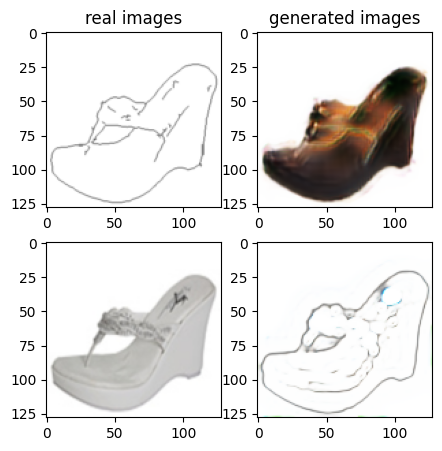

Train Epoch: 1 84% 	Total Loss: 1.416741 	Loss_G_AB: 0.256270	Loss_G_BA: 0.999262	Loss_cycle: 0.521434	Loss_D_A: 0.002978	Loss_D_B: 0.264563
0 42009 T:  1.8827695846557617
Train Epoch: 1 84% 	Total Loss: 1.270080 	Loss_G_AB: 0.278348	Loss_G_BA: 0.997203	Loss_cycle: 0.381034	Loss_D_A: 0.003590	Loss_D_B: 0.247681
0 42019 T:  0.9854490756988525
Train Epoch: 1 84% 	Total Loss: 1.329780 	Loss_G_AB: 0.277702	Loss_G_BA: 1.002912	Loss_cycle: 0.447017	Loss_D_A: 0.002270	Loss_D_B: 0.240187
0 42029 T:  0.9857742786407471
Train Epoch: 1 84% 	Total Loss: 1.264455 	Loss_G_AB: 0.308264	Loss_G_BA: 0.998921	Loss_cycle: 0.384218	Loss_D_A: 0.005145	Loss_D_B: 0.221498
0 42039 T:  0.9812002182006836
Train Epoch: 1 84% 	Total Loss: 1.299723 	Loss_G_AB: 0.294721	Loss_G_BA: 1.007687	Loss_cycle: 0.413333	Loss_D_A: 0.005288	Loss_D_B: 0.229898
0 42049 T:  0.9836199283599854
Train Epoch: 1 84% 	Total Loss: 1.390706 	Loss_G_AB: 0.291616	Loss_G_BA: 0.996286	Loss_cycle: 0.477781	Loss_D_A: 0.002935	Loss_D_B: 0.266039

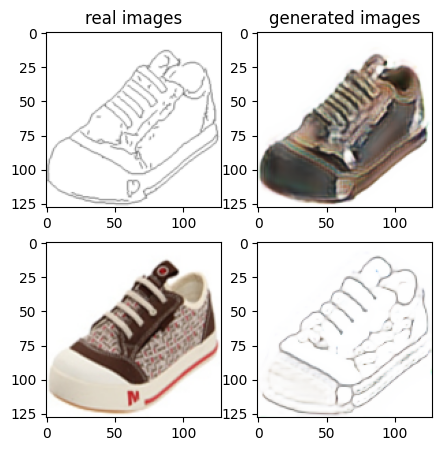

Train Epoch: 1 86% 	Total Loss: 1.325865 	Loss_G_AB: 0.313083	Loss_G_BA: 0.988688	Loss_cycle: 0.448096	Loss_D_A: 0.002473	Loss_D_B: 0.224411
0 43009 T:  1.7307014465332031
Train Epoch: 1 86% 	Total Loss: 1.314998 	Loss_G_AB: 0.288573	Loss_G_BA: 1.001082	Loss_cycle: 0.424571	Loss_D_A: 0.002250	Loss_D_B: 0.243349
0 43019 T:  0.9807393550872803
Train Epoch: 1 86% 	Total Loss: 1.368818 	Loss_G_AB: 0.321175	Loss_G_BA: 1.024199	Loss_cycle: 0.467457	Loss_D_A: 0.002278	Loss_D_B: 0.226396
0 43029 T:  0.9810628890991211
Train Epoch: 1 86% 	Total Loss: 1.289688 	Loss_G_AB: 0.297087	Loss_G_BA: 0.967849	Loss_cycle: 0.419764	Loss_D_A: 0.003343	Loss_D_B: 0.234112
0 43039 T:  0.981114387512207
Train Epoch: 1 86% 	Total Loss: 1.387747 	Loss_G_AB: 0.278899	Loss_G_BA: 1.014978	Loss_cycle: 0.487663	Loss_D_A: 0.002457	Loss_D_B: 0.250689
0 43049 T:  0.9811222553253174
Train Epoch: 1 86% 	Total Loss: 1.322140 	Loss_G_AB: 0.292160	Loss_G_BA: 0.988860	Loss_cycle: 0.438068	Loss_D_A: 0.002268	Loss_D_B: 0.241294


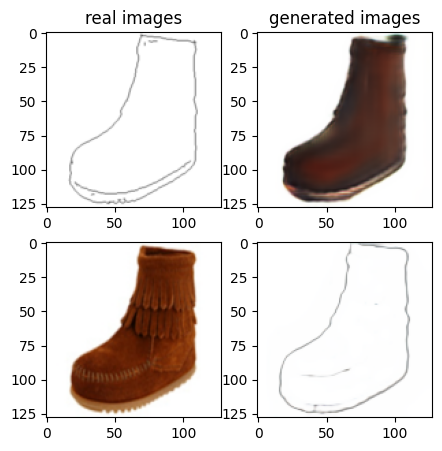

Train Epoch: 1 88% 	Total Loss: 1.370221 	Loss_G_AB: 0.302491	Loss_G_BA: 0.801639	Loss_cycle: 0.507987	Loss_D_A: 0.071832	Loss_D_B: 0.238337
0 44009 T:  1.7352983951568604
Train Epoch: 1 88% 	Total Loss: 1.525501 	Loss_G_AB: 0.342070	Loss_G_BA: 1.042865	Loss_cycle: 0.596615	Loss_D_A: 0.009324	Loss_D_B: 0.227095
0 44019 T:  0.990788459777832
Train Epoch: 1 88% 	Total Loss: 1.324589 	Loss_G_AB: 0.316316	Loss_G_BA: 0.863410	Loss_cycle: 0.432535	Loss_D_A: 0.035915	Loss_D_B: 0.266276
0 44029 T:  0.9791741371154785
Train Epoch: 1 88% 	Total Loss: 1.370165 	Loss_G_AB: 0.315668	Loss_G_BA: 0.992278	Loss_cycle: 0.434798	Loss_D_A: 0.042763	Loss_D_B: 0.238630
0 44039 T:  0.9880709648132324
Train Epoch: 1 88% 	Total Loss: 1.260776 	Loss_G_AB: 0.288114	Loss_G_BA: 0.985931	Loss_cycle: 0.375587	Loss_D_A: 0.005703	Loss_D_B: 0.242463
0 44049 T:  0.982337236404419
Train Epoch: 1 88% 	Total Loss: 1.325758 	Loss_G_AB: 0.288545	Loss_G_BA: 0.955093	Loss_cycle: 0.439662	Loss_D_A: 0.021170	Loss_D_B: 0.243107
0

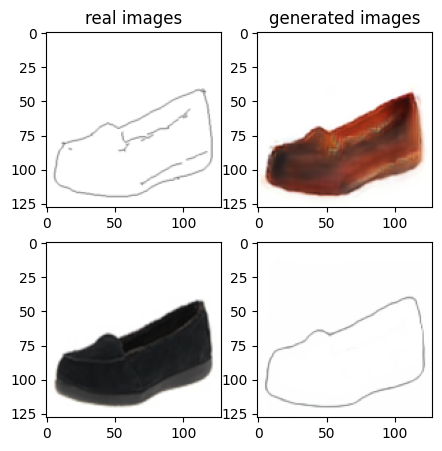

Train Epoch: 1 90% 	Total Loss: 1.208211 	Loss_G_AB: 0.319568	Loss_G_BA: 0.963956	Loss_cycle: 0.341180	Loss_D_A: 0.007704	Loss_D_B: 0.217565
0 45009 T:  1.7418017387390137
Train Epoch: 1 90% 	Total Loss: 1.334101 	Loss_G_AB: 0.301818	Loss_G_BA: 1.006164	Loss_cycle: 0.411578	Loss_D_A: 0.005897	Loss_D_B: 0.262635
0 45019 T:  0.9790503978729248
Train Epoch: 1 90% 	Total Loss: 1.240552 	Loss_G_AB: 0.281748	Loss_G_BA: 1.026293	Loss_cycle: 0.336858	Loss_D_A: 0.005179	Loss_D_B: 0.244494
0 45029 T:  0.9822776317596436
Train Epoch: 1 90% 	Total Loss: 1.322932 	Loss_G_AB: 0.303871	Loss_G_BA: 0.984933	Loss_cycle: 0.439986	Loss_D_A: 0.002718	Loss_D_B: 0.235826
0 45039 T:  0.9877955913543701
Train Epoch: 1 90% 	Total Loss: 1.249318 	Loss_G_AB: 0.280928	Loss_G_BA: 0.926174	Loss_cycle: 0.340227	Loss_D_A: 0.063015	Loss_D_B: 0.242524
0 45049 T:  1.0028929710388184
Train Epoch: 1 90% 	Total Loss: 1.195632 	Loss_G_AB: 0.303073	Loss_G_BA: 0.954788	Loss_cycle: 0.332529	Loss_D_A: 0.011987	Loss_D_B: 0.222186

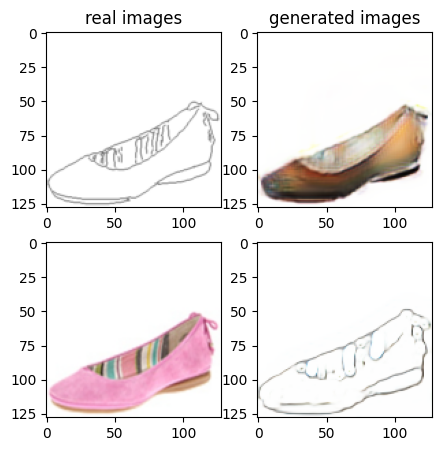

Train Epoch: 1 92% 	Total Loss: 1.249927 	Loss_G_AB: 0.300656	Loss_G_BA: 0.982882	Loss_cycle: 0.357222	Loss_D_A: 0.002038	Loss_D_B: 0.248897
0 46009 T:  1.984487771987915
Train Epoch: 1 92% 	Total Loss: 1.335340 	Loss_G_AB: 0.276752	Loss_G_BA: 1.010691	Loss_cycle: 0.440161	Loss_D_A: 0.002508	Loss_D_B: 0.248948
0 46019 T:  0.9831092357635498
Train Epoch: 1 92% 	Total Loss: 1.318870 	Loss_G_AB: 0.310024	Loss_G_BA: 1.008298	Loss_cycle: 0.441214	Loss_D_A: 0.002044	Loss_D_B: 0.216451
0 46029 T:  1.0079834461212158
Train Epoch: 1 92% 	Total Loss: 1.291285 	Loss_G_AB: 0.333848	Loss_G_BA: 0.998047	Loss_cycle: 0.360139	Loss_D_A: 0.002195	Loss_D_B: 0.263003
0 46039 T:  0.9980087280273438
Train Epoch: 1 92% 	Total Loss: 1.339111 	Loss_G_AB: 0.296358	Loss_G_BA: 1.009269	Loss_cycle: 0.416024	Loss_D_A: 0.002123	Loss_D_B: 0.268151
0 46049 T:  1.0617413520812988
Train Epoch: 1 92% 	Total Loss: 1.370962 	Loss_G_AB: 0.290222	Loss_G_BA: 0.988577	Loss_cycle: 0.472609	Loss_D_A: 0.001498	Loss_D_B: 0.257455


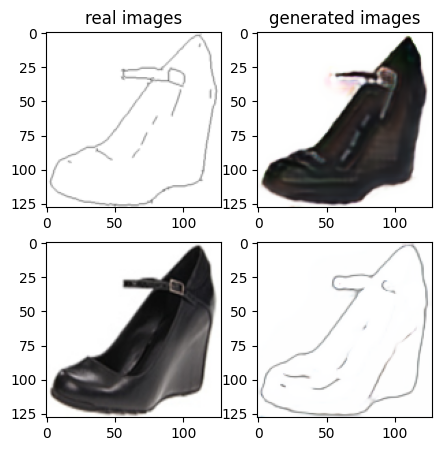

Train Epoch: 1 94% 	Total Loss: 1.306551 	Loss_G_AB: 0.319484	Loss_G_BA: 0.991652	Loss_cycle: 0.396648	Loss_D_A: 0.015931	Loss_D_B: 0.238405
0 47009 T:  2.1358325481414795
Train Epoch: 1 94% 	Total Loss: 1.320362 	Loss_G_AB: 0.277645	Loss_G_BA: 1.005477	Loss_cycle: 0.408152	Loss_D_A: 0.009608	Loss_D_B: 0.261041
0 47019 T:  1.0064473152160645
Train Epoch: 1 94% 	Total Loss: 1.217839 	Loss_G_AB: 0.289431	Loss_G_BA: 1.008804	Loss_cycle: 0.334439	Loss_D_A: 0.002487	Loss_D_B: 0.231796
0 47029 T:  0.9998407363891602
Train Epoch: 1 94% 	Total Loss: 1.246969 	Loss_G_AB: 0.296560	Loss_G_BA: 0.994547	Loss_cycle: 0.352255	Loss_D_A: 0.001950	Loss_D_B: 0.247210
0 47039 T:  0.9804208278656006
Train Epoch: 1 94% 	Total Loss: 1.394617 	Loss_G_AB: 0.329751	Loss_G_BA: 1.007503	Loss_cycle: 0.508480	Loss_D_A: 0.001973	Loss_D_B: 0.215537
0 47049 T:  0.985694169998169
Train Epoch: 1 94% 	Total Loss: 1.306644 	Loss_G_AB: 0.357340	Loss_G_BA: 0.991308	Loss_cycle: 0.385835	Loss_D_A: 0.002437	Loss_D_B: 0.244049


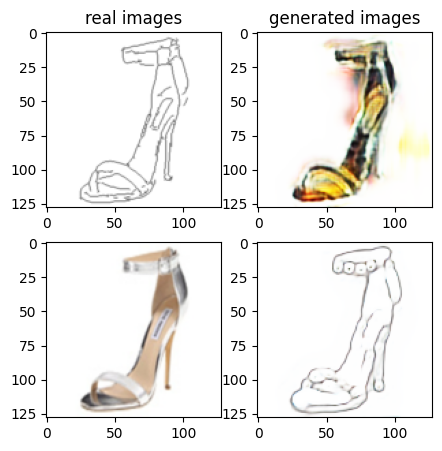

Train Epoch: 1 96% 	Total Loss: 1.266041 	Loss_G_AB: 0.284830	Loss_G_BA: 1.010516	Loss_cycle: 0.363041	Loss_D_A: 0.002415	Loss_D_B: 0.252912
0 48009 T:  2.1365089416503906
Train Epoch: 1 96% 	Total Loss: 1.344162 	Loss_G_AB: 0.283062	Loss_G_BA: 1.002728	Loss_cycle: 0.438744	Loss_D_A: 0.002425	Loss_D_B: 0.260098
0 48019 T:  0.9815223217010498
Train Epoch: 1 96% 	Total Loss: 1.336023 	Loss_G_AB: 0.283199	Loss_G_BA: 1.004416	Loss_cycle: 0.449079	Loss_D_A: 0.003918	Loss_D_B: 0.239219
0 48029 T:  0.9773879051208496
Train Epoch: 1 96% 	Total Loss: 1.212959 	Loss_G_AB: 0.296786	Loss_G_BA: 0.987381	Loss_cycle: 0.321520	Loss_D_A: 0.002351	Loss_D_B: 0.247004
0 48039 T:  0.9803364276885986
Train Epoch: 1 96% 	Total Loss: 1.294741 	Loss_G_AB: 0.326471	Loss_G_BA: 1.000756	Loss_cycle: 0.410885	Loss_D_A: 0.003214	Loss_D_B: 0.217029
0 48049 T:  0.982529878616333
Train Epoch: 1 96% 	Total Loss: 1.294269 	Loss_G_AB: 0.294679	Loss_G_BA: 1.000996	Loss_cycle: 0.415893	Loss_D_A: 0.002770	Loss_D_B: 0.227768


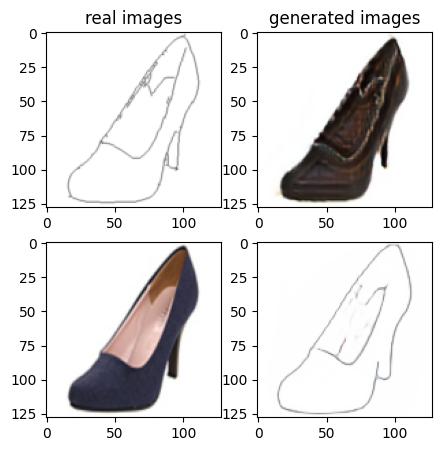

Train Epoch: 1 98% 	Total Loss: 1.259383 	Loss_G_AB: 0.329333	Loss_G_BA: 0.996930	Loss_cycle: 0.359129	Loss_D_A: 0.002719	Loss_D_B: 0.234404
0 49009 T:  1.7423982620239258
Train Epoch: 1 98% 	Total Loss: 1.264799 	Loss_G_AB: 0.264238	Loss_G_BA: 1.002789	Loss_cycle: 0.379907	Loss_D_A: 0.003905	Loss_D_B: 0.247473
0 49019 T:  0.9837212562561035
Train Epoch: 1 98% 	Total Loss: 1.218176 	Loss_G_AB: 0.323927	Loss_G_BA: 1.004491	Loss_cycle: 0.348329	Loss_D_A: 0.004569	Loss_D_B: 0.201069
0 49029 T:  0.9814314842224121
Train Epoch: 1 98% 	Total Loss: 1.408949 	Loss_G_AB: 0.363074	Loss_G_BA: 0.993445	Loss_cycle: 0.481983	Loss_D_A: 0.002006	Loss_D_B: 0.246700
0 49039 T:  0.9835128784179688
Train Epoch: 1 98% 	Total Loss: 1.328691 	Loss_G_AB: 0.297635	Loss_G_BA: 0.998268	Loss_cycle: 0.434098	Loss_D_A: 0.003210	Loss_D_B: 0.243432
0 49049 T:  0.9885640144348145
Train Epoch: 1 98% 	Total Loss: 1.249237 	Loss_G_AB: 0.388910	Loss_G_BA: 1.004304	Loss_cycle: 0.343296	Loss_D_A: 0.002323	Loss_D_B: 0.207011

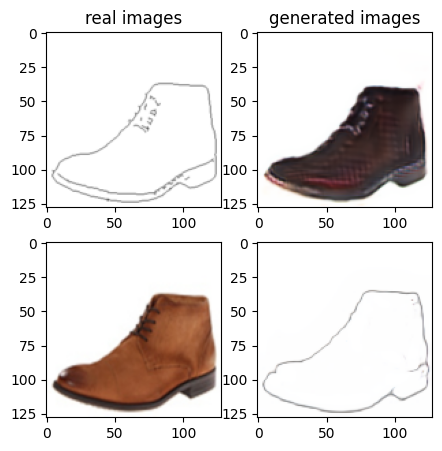

Train Epoch: 2 0% 	Total Loss: 1.252713 	Loss_G_AB: 0.294108	Loss_G_BA: 0.906564	Loss_cycle: 0.335152	Loss_D_A: 0.060800	Loss_D_B: 0.256425
1 50009 T:  1.7577605247497559
Train Epoch: 2 0% 	Total Loss: 1.448985 	Loss_G_AB: 0.349266	Loss_G_BA: 0.908960	Loss_cycle: 0.424640	Loss_D_A: 0.100046	Loss_D_B: 0.295186
1 50019 T:  0.9867377281188965
Train Epoch: 2 0% 	Total Loss: 1.446434 	Loss_G_AB: 0.466158	Loss_G_BA: 0.972217	Loss_cycle: 0.444653	Loss_D_A: 0.015053	Loss_D_B: 0.267541
1 50029 T:  0.9932079315185547
Train Epoch: 2 0% 	Total Loss: 1.225687 	Loss_G_AB: 0.312027	Loss_G_BA: 0.997445	Loss_cycle: 0.293794	Loss_D_A: 0.010686	Loss_D_B: 0.266471
1 50039 T:  0.9843530654907227
Train Epoch: 2 0% 	Total Loss: 1.337857 	Loss_G_AB: 0.272282	Loss_G_BA: 1.009306	Loss_cycle: 0.423691	Loss_D_A: 0.003184	Loss_D_B: 0.270188
1 50049 T:  0.986870527267456
Train Epoch: 2 0% 	Total Loss: 1.275009 	Loss_G_AB: 0.277449	Loss_G_BA: 0.989604	Loss_cycle: 0.378248	Loss_D_A: 0.003932	Loss_D_B: 0.259302
1 5005

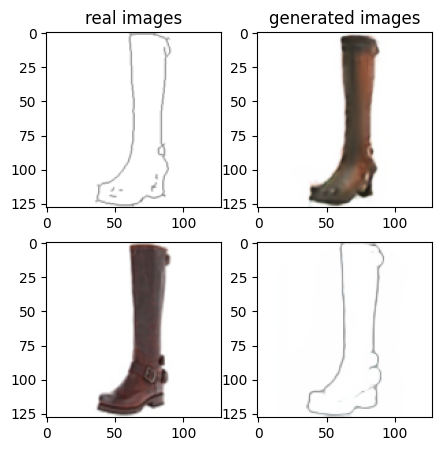

Train Epoch: 2 2% 	Total Loss: 1.289734 	Loss_G_AB: 0.258692	Loss_G_BA: 1.002616	Loss_cycle: 0.383006	Loss_D_A: 0.005036	Loss_D_B: 0.271038
1 51009 T:  1.7705514430999756
Train Epoch: 2 2% 	Total Loss: 1.218196 	Loss_G_AB: 0.268063	Loss_G_BA: 0.973574	Loss_cycle: 0.335145	Loss_D_A: 0.003642	Loss_D_B: 0.258591
1 51019 T:  0.9824528694152832
Train Epoch: 2 2% 	Total Loss: 1.342383 	Loss_G_AB: 0.412913	Loss_G_BA: 1.007332	Loss_cycle: 0.434714	Loss_D_A: 0.003305	Loss_D_B: 0.194241
1 51029 T:  0.9943134784698486
Train Epoch: 2 2% 	Total Loss: 1.419304 	Loss_G_AB: 0.254595	Loss_G_BA: 0.980163	Loss_cycle: 0.532306	Loss_D_A: 0.006423	Loss_D_B: 0.263196
1 51039 T:  1.0004892349243164
Train Epoch: 2 2% 	Total Loss: 1.320600 	Loss_G_AB: 0.292967	Loss_G_BA: 1.010034	Loss_cycle: 0.420771	Loss_D_A: 0.004537	Loss_D_B: 0.243792
1 51049 T:  0.9985983371734619
Train Epoch: 2 2% 	Total Loss: 1.287660 	Loss_G_AB: 0.299893	Loss_G_BA: 0.990083	Loss_cycle: 0.401110	Loss_D_A: 0.001941	Loss_D_B: 0.239622
1 510

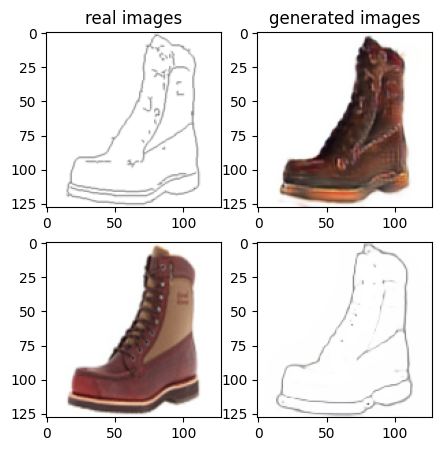

Train Epoch: 2 4% 	Total Loss: 1.342777 	Loss_G_AB: 0.305811	Loss_G_BA: 0.998221	Loss_cycle: 0.439305	Loss_D_A: 0.001889	Loss_D_B: 0.249568
1 52009 T:  1.7866370677947998
Train Epoch: 2 4% 	Total Loss: 1.319097 	Loss_G_AB: 0.302128	Loss_G_BA: 1.005017	Loss_cycle: 0.424010	Loss_D_A: 0.004263	Loss_D_B: 0.237253
1 52019 T:  1.004054307937622
Train Epoch: 2 4% 	Total Loss: 1.294809 	Loss_G_AB: 0.263006	Loss_G_BA: 1.008868	Loss_cycle: 0.379954	Loss_D_A: 0.008617	Loss_D_B: 0.270300
1 52029 T:  1.035210132598877
Train Epoch: 2 4% 	Total Loss: 1.232578 	Loss_G_AB: 0.275148	Loss_G_BA: 1.012646	Loss_cycle: 0.328910	Loss_D_A: 0.002338	Loss_D_B: 0.257434
1 52039 T:  0.9981372356414795
Train Epoch: 2 4% 	Total Loss: 1.296741 	Loss_G_AB: 0.270440	Loss_G_BA: 0.982136	Loss_cycle: 0.412566	Loss_D_A: 0.002385	Loss_D_B: 0.255502
1 52049 T:  1.0139570236206055
Train Epoch: 2 4% 	Total Loss: 1.333544 	Loss_G_AB: 0.255375	Loss_G_BA: 1.006316	Loss_cycle: 0.440839	Loss_D_A: 0.001925	Loss_D_B: 0.259934
1 52059

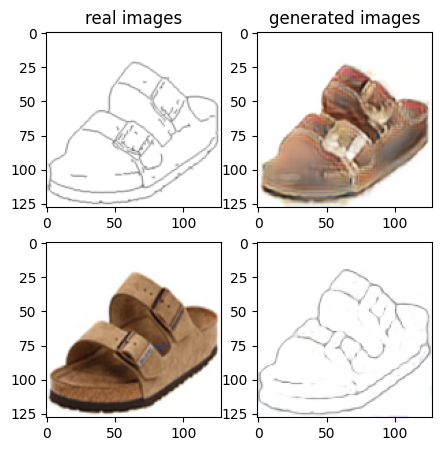

Train Epoch: 2 6% 	Total Loss: 1.264375 	Loss_G_AB: 0.260881	Loss_G_BA: 0.988507	Loss_cycle: 0.378815	Loss_D_A: 0.004222	Loss_D_B: 0.256644
1 53009 T:  1.9968461990356445
Train Epoch: 2 6% 	Total Loss: 1.277290 	Loss_G_AB: 0.303604	Loss_G_BA: 0.999936	Loss_cycle: 0.397516	Loss_D_A: 0.003999	Loss_D_B: 0.224005
1 53019 T:  1.0261623859405518
Train Epoch: 2 6% 	Total Loss: 1.283915 	Loss_G_AB: 0.324058	Loss_G_BA: 0.997547	Loss_cycle: 0.379927	Loss_D_A: 0.004395	Loss_D_B: 0.238791
1 53029 T:  1.015584945678711
Train Epoch: 2 6% 	Total Loss: 1.287119 	Loss_G_AB: 0.326618	Loss_G_BA: 0.974482	Loss_cycle: 0.403881	Loss_D_A: 0.005962	Loss_D_B: 0.226726
1 53039 T:  1.0338375568389893
Train Epoch: 2 6% 	Total Loss: 1.313860 	Loss_G_AB: 0.361079	Loss_G_BA: 1.010574	Loss_cycle: 0.409854	Loss_D_A: 0.004194	Loss_D_B: 0.213986
1 53049 T:  1.0076096057891846
Train Epoch: 2 6% 	Total Loss: 1.338514 	Loss_G_AB: 0.275080	Loss_G_BA: 1.003520	Loss_cycle: 0.387921	Loss_D_A: 0.003174	Loss_D_B: 0.308120
1 5305

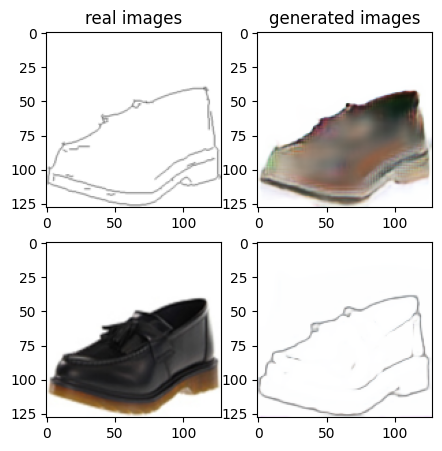

Train Epoch: 2 8% 	Total Loss: 1.274813 	Loss_G_AB: 0.298549	Loss_G_BA: 0.956588	Loss_cycle: 0.391864	Loss_D_A: 0.006504	Loss_D_B: 0.248876
1 54009 T:  1.7375586032867432
Train Epoch: 2 8% 	Total Loss: 1.309733 	Loss_G_AB: 0.309242	Loss_G_BA: 1.008661	Loss_cycle: 0.400484	Loss_D_A: 0.012685	Loss_D_B: 0.237613
1 54019 T:  0.9915947914123535
Train Epoch: 2 8% 	Total Loss: 1.298672 	Loss_G_AB: 0.288148	Loss_G_BA: 0.959614	Loss_cycle: 0.409828	Loss_D_A: 0.007851	Loss_D_B: 0.257112
1 54029 T:  1.0148062705993652
Train Epoch: 2 8% 	Total Loss: 1.349149 	Loss_G_AB: 0.314498	Loss_G_BA: 1.015745	Loss_cycle: 0.442064	Loss_D_A: 0.003679	Loss_D_B: 0.238284
1 54039 T:  1.0257339477539062
Train Epoch: 2 8% 	Total Loss: 1.343166 	Loss_G_AB: 0.297097	Loss_G_BA: 0.987020	Loss_cycle: 0.418304	Loss_D_A: 0.010531	Loss_D_B: 0.272272
1 54049 T:  1.0718176364898682
Train Epoch: 2 8% 	Total Loss: 1.312372 	Loss_G_AB: 0.308394	Loss_G_BA: 0.996567	Loss_cycle: 0.426114	Loss_D_A: 0.004472	Loss_D_B: 0.229305
1 540

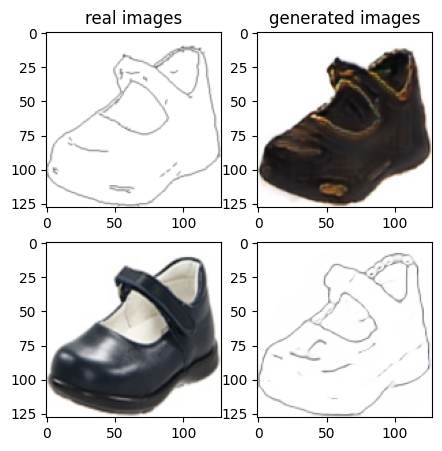

Train Epoch: 2 10% 	Total Loss: 1.338234 	Loss_G_AB: 0.308044	Loss_G_BA: 1.010188	Loss_cycle: 0.425435	Loss_D_A: 0.011489	Loss_D_B: 0.242194
1 55009 T:  2.118864059448242
Train Epoch: 2 10% 	Total Loss: 1.301887 	Loss_G_AB: 0.283098	Loss_G_BA: 1.003921	Loss_cycle: 0.374979	Loss_D_A: 0.007134	Loss_D_B: 0.276265
1 55019 T:  1.0203492641448975
Train Epoch: 2 10% 	Total Loss: 1.229952 	Loss_G_AB: 0.371056	Loss_G_BA: 0.980931	Loss_cycle: 0.349595	Loss_D_A: 0.002464	Loss_D_B: 0.201900
1 55029 T:  0.9823567867279053
Train Epoch: 2 10% 	Total Loss: 1.178588 	Loss_G_AB: 0.291257	Loss_G_BA: 0.980195	Loss_cycle: 0.284649	Loss_D_A: 0.006093	Loss_D_B: 0.252120
1 55039 T:  0.9824271202087402
Train Epoch: 2 10% 	Total Loss: 1.316741 	Loss_G_AB: 0.335320	Loss_G_BA: 0.966476	Loss_cycle: 0.399180	Loss_D_A: 0.018605	Loss_D_B: 0.248059
1 55049 T:  0.9772543907165527
Train Epoch: 2 11% 	Total Loss: 1.299209 	Loss_G_AB: 0.256786	Loss_G_BA: 1.017999	Loss_cycle: 0.394748	Loss_D_A: 0.003143	Loss_D_B: 0.263925


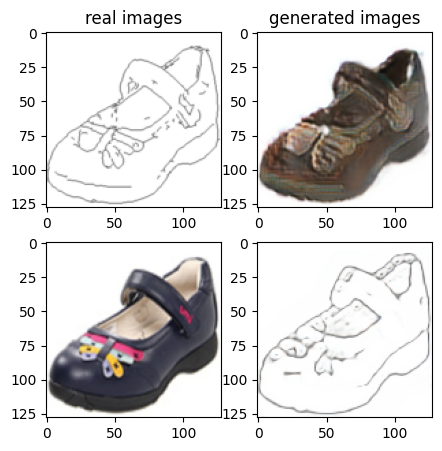

Train Epoch: 2 12% 	Total Loss: 1.362940 	Loss_G_AB: 0.273615	Loss_G_BA: 1.027603	Loss_cycle: 0.456330	Loss_D_A: 0.002613	Loss_D_B: 0.253388
1 56009 T:  2.126380443572998
Train Epoch: 2 12% 	Total Loss: 1.291245 	Loss_G_AB: 0.270176	Loss_G_BA: 1.008771	Loss_cycle: 0.406010	Loss_D_A: 0.002378	Loss_D_B: 0.243383
1 56019 T:  0.9797887802124023
Train Epoch: 2 12% 	Total Loss: 1.281835 	Loss_G_AB: 0.330786	Loss_G_BA: 0.983392	Loss_cycle: 0.412620	Loss_D_A: 0.001670	Loss_D_B: 0.210455
1 56029 T:  0.9781694412231445
Train Epoch: 2 12% 	Total Loss: 1.260409 	Loss_G_AB: 0.279997	Loss_G_BA: 0.998635	Loss_cycle: 0.370601	Loss_D_A: 0.004242	Loss_D_B: 0.246249
1 56039 T:  0.9859893321990967
Train Epoch: 2 12% 	Total Loss: 1.215119 	Loss_G_AB: 0.316451	Loss_G_BA: 0.979414	Loss_cycle: 0.314095	Loss_D_A: 0.003642	Loss_D_B: 0.249450
1 56049 T:  0.9773299694061279
Train Epoch: 2 13% 	Total Loss: 1.174284 	Loss_G_AB: 0.272647	Loss_G_BA: 1.000751	Loss_cycle: 0.284596	Loss_D_A: 0.005472	Loss_D_B: 0.247517


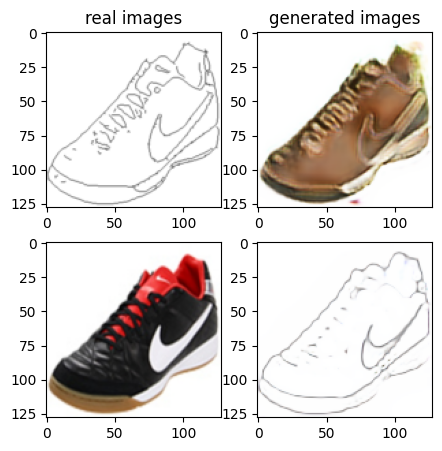

Train Epoch: 2 14% 	Total Loss: 1.278104 	Loss_G_AB: 0.302348	Loss_G_BA: 0.995978	Loss_cycle: 0.361469	Loss_D_A: 0.004783	Loss_D_B: 0.262689
1 57009 T:  1.7442355155944824
Train Epoch: 2 14% 	Total Loss: 1.238722 	Loss_G_AB: 0.280026	Loss_G_BA: 0.909187	Loss_cycle: 0.352042	Loss_D_A: 0.031240	Loss_D_B: 0.260834
1 57019 T:  0.9821412563323975
Train Epoch: 2 14% 	Total Loss: 1.239851 	Loss_G_AB: 0.282961	Loss_G_BA: 1.005805	Loss_cycle: 0.346488	Loss_D_A: 0.004376	Loss_D_B: 0.244605
1 57029 T:  0.9897594451904297
Train Epoch: 2 14% 	Total Loss: 1.357132 	Loss_G_AB: 0.316746	Loss_G_BA: 0.996562	Loss_cycle: 0.455102	Loss_D_A: 0.005528	Loss_D_B: 0.239848
1 57039 T:  0.9807350635528564
Train Epoch: 2 14% 	Total Loss: 1.208531 	Loss_G_AB: 0.305140	Loss_G_BA: 0.983497	Loss_cycle: 0.320527	Loss_D_A: 0.010120	Loss_D_B: 0.233566
1 57049 T:  0.9887540340423584
Train Epoch: 2 15% 	Total Loss: 1.296017 	Loss_G_AB: 0.279260	Loss_G_BA: 0.943935	Loss_cycle: 0.428258	Loss_D_A: 0.007994	Loss_D_B: 0.248169

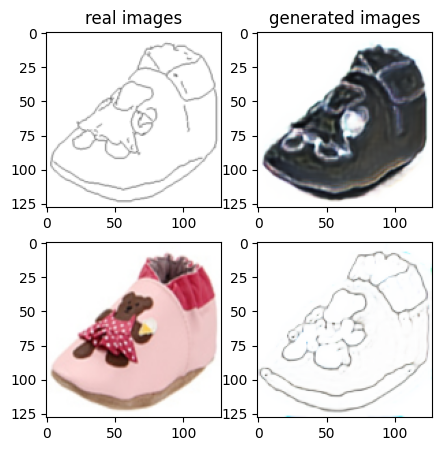

Train Epoch: 2 16% 	Total Loss: 1.461778 	Loss_G_AB: 0.312883	Loss_G_BA: 0.967329	Loss_cycle: 0.579722	Loss_D_A: 0.007625	Loss_D_B: 0.234326
1 58009 T:  2.407855749130249
Train Epoch: 2 16% 	Total Loss: 1.158132 	Loss_G_AB: 0.307173	Loss_G_BA: 0.843860	Loss_cycle: 0.295503	Loss_D_A: 0.055570	Loss_D_B: 0.231543
1 58019 T:  1.1511263847351074
Train Epoch: 2 16% 	Total Loss: 1.432986 	Loss_G_AB: 0.361814	Loss_G_BA: 0.886061	Loss_cycle: 0.376646	Loss_D_A: 0.160847	Loss_D_B: 0.271555
1 58029 T:  1.0783700942993164
Train Epoch: 2 16% 	Total Loss: 1.508086 	Loss_G_AB: 0.341128	Loss_G_BA: 0.871255	Loss_cycle: 0.590439	Loss_D_A: 0.089221	Loss_D_B: 0.222235
1 58039 T:  1.2379603385925293
Train Epoch: 2 17% 	Total Loss: 1.316810 	Loss_G_AB: 0.283878	Loss_G_BA: 0.682331	Loss_cycle: 0.374813	Loss_D_A: 0.191679	Loss_D_B: 0.267213
1 58049 T:  1.362377405166626
Train Epoch: 2 17% 	Total Loss: 1.570422 	Loss_G_AB: 0.349055	Loss_G_BA: 0.879007	Loss_cycle: 0.685577	Loss_D_A: 0.049940	Loss_D_B: 0.220874
1

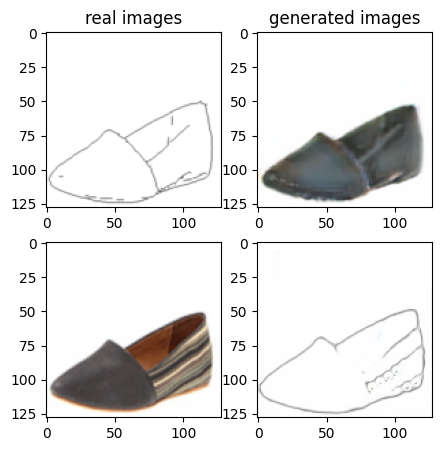

Train Epoch: 2 18% 	Total Loss: 1.285702 	Loss_G_AB: 0.357840	Loss_G_BA: 0.985549	Loss_cycle: 0.383969	Loss_D_A: 0.005917	Loss_D_B: 0.224120
1 59009 T:  1.7768476009368896
Train Epoch: 2 18% 	Total Loss: 1.304864 	Loss_G_AB: 0.315206	Loss_G_BA: 0.798359	Loss_cycle: 0.325389	Loss_D_A: 0.163156	Loss_D_B: 0.259538
1 59019 T:  0.9846007823944092
Train Epoch: 2 18% 	Total Loss: 1.385459 	Loss_G_AB: 0.313480	Loss_G_BA: 0.678594	Loss_cycle: 0.439337	Loss_D_A: 0.220248	Loss_D_B: 0.229837
1 59029 T:  0.9871010780334473
Train Epoch: 2 18% 	Total Loss: 1.233704 	Loss_G_AB: 0.308013	Loss_G_BA: 0.882203	Loss_cycle: 0.366990	Loss_D_A: 0.027730	Loss_D_B: 0.243877
1 59039 T:  1.0339164733886719
Train Epoch: 2 19% 	Total Loss: 1.302073 	Loss_G_AB: 0.325858	Loss_G_BA: 0.981787	Loss_cycle: 0.361443	Loss_D_A: 0.026928	Loss_D_B: 0.259880
1 59049 T:  1.0005075931549072
Train Epoch: 2 19% 	Total Loss: 1.445965 	Loss_G_AB: 0.342900	Loss_G_BA: 1.024156	Loss_cycle: 0.542410	Loss_D_A: 0.006072	Loss_D_B: 0.213955

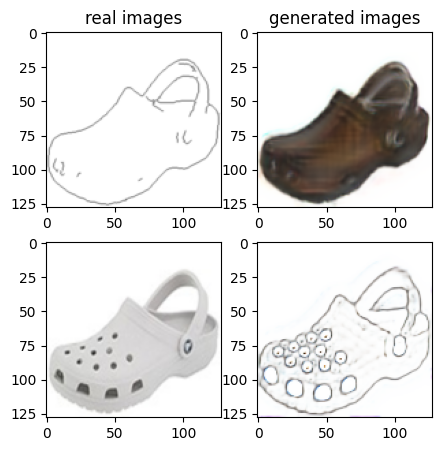

Train Epoch: 2 20% 	Total Loss: 1.314085 	Loss_G_AB: 0.296626	Loss_G_BA: 0.990659	Loss_cycle: 0.430116	Loss_D_A: 0.005716	Loss_D_B: 0.234610
1 60009 T:  1.763951063156128
Train Epoch: 2 20% 	Total Loss: 1.291227 	Loss_G_AB: 0.273889	Loss_G_BA: 0.994220	Loss_cycle: 0.380165	Loss_D_A: 0.004627	Loss_D_B: 0.272381
1 60019 T:  1.0340781211853027
Train Epoch: 2 20% 	Total Loss: 1.224475 	Loss_G_AB: 0.304833	Loss_G_BA: 1.004936	Loss_cycle: 0.331923	Loss_D_A: 0.003532	Loss_D_B: 0.234134
1 60029 T:  0.9982190132141113
Train Epoch: 2 20% 	Total Loss: 1.212066 	Loss_G_AB: 0.308416	Loss_G_BA: 1.005176	Loss_cycle: 0.326800	Loss_D_A: 0.002243	Loss_D_B: 0.226227
1 60039 T:  1.0097935199737549
Train Epoch: 2 21% 	Total Loss: 1.330609 	Loss_G_AB: 0.323193	Loss_G_BA: 1.012510	Loss_cycle: 0.423266	Loss_D_A: 0.002127	Loss_D_B: 0.237365
1 60049 T:  1.0149693489074707
Train Epoch: 2 21% 	Total Loss: 1.214978 	Loss_G_AB: 0.265098	Loss_G_BA: 0.987166	Loss_cycle: 0.321262	Loss_D_A: 0.002255	Loss_D_B: 0.265330


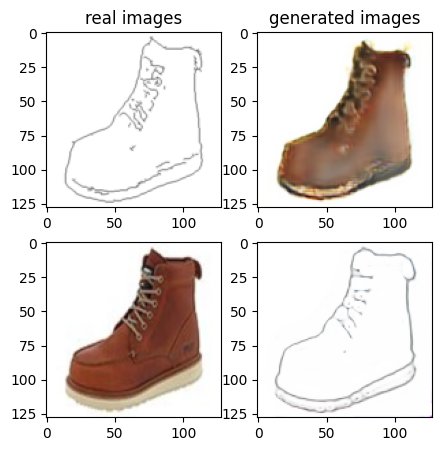

Train Epoch: 2 22% 	Total Loss: 1.306033 	Loss_G_AB: 0.335165	Loss_G_BA: 0.996464	Loss_cycle: 0.414585	Loss_D_A: 0.001939	Loss_D_B: 0.223694
1 61009 T:  1.9664180278778076
Train Epoch: 2 22% 	Total Loss: 1.332167 	Loss_G_AB: 0.380187	Loss_G_BA: 0.998235	Loss_cycle: 0.422647	Loss_D_A: 0.001227	Loss_D_B: 0.219081
1 61019 T:  1.0191435813903809
Train Epoch: 2 22% 	Total Loss: 1.295972 	Loss_G_AB: 0.274356	Loss_G_BA: 0.994752	Loss_cycle: 0.350757	Loss_D_A: 0.002521	Loss_D_B: 0.308140
1 61029 T:  1.0248990058898926
Train Epoch: 2 23% 	Total Loss: 1.318599 	Loss_G_AB: 0.288234	Loss_G_BA: 1.007000	Loss_cycle: 0.413248	Loss_D_A: 0.002193	Loss_D_B: 0.255542
1 61039 T:  0.9901907444000244
Train Epoch: 2 23% 	Total Loss: 1.195599 	Loss_G_AB: 0.294599	Loss_G_BA: 1.007767	Loss_cycle: 0.296219	Loss_D_A: 0.001558	Loss_D_B: 0.246639
1 61049 T:  1.0469818115234375
Train Epoch: 2 23% 	Total Loss: 1.145044 	Loss_G_AB: 0.311409	Loss_G_BA: 0.981971	Loss_cycle: 0.288487	Loss_D_A: 0.002434	Loss_D_B: 0.207434

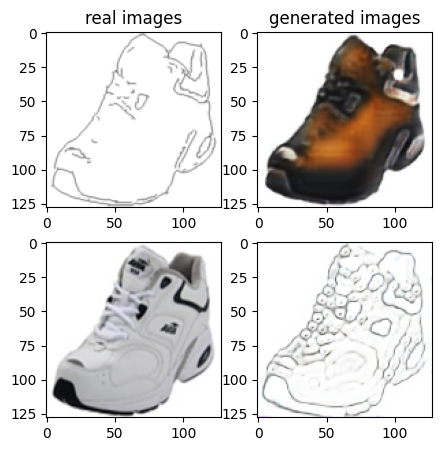

Train Epoch: 2 24% 	Total Loss: 1.316366 	Loss_G_AB: 0.391843	Loss_G_BA: 0.994495	Loss_cycle: 0.396207	Loss_D_A: 0.002260	Loss_D_B: 0.224730
1 62009 T:  2.160285472869873
Train Epoch: 2 24% 	Total Loss: 1.240072 	Loss_G_AB: 0.307645	Loss_G_BA: 1.000641	Loss_cycle: 0.349678	Loss_D_A: 0.001490	Loss_D_B: 0.234761
1 62019 T:  1.022261142730713
Train Epoch: 2 24% 	Total Loss: 1.267354 	Loss_G_AB: 0.330538	Loss_G_BA: 0.988981	Loss_cycle: 0.363475	Loss_D_A: 0.002053	Loss_D_B: 0.242067
1 62029 T:  1.135127305984497
Train Epoch: 2 25% 	Total Loss: 1.309106 	Loss_G_AB: 0.400056	Loss_G_BA: 1.005060	Loss_cycle: 0.414088	Loss_D_A: 0.002185	Loss_D_B: 0.190275
1 62039 T:  1.0101990699768066
Train Epoch: 2 25% 	Total Loss: 1.275061 	Loss_G_AB: 0.296267	Loss_G_BA: 0.957044	Loss_cycle: 0.399651	Loss_D_A: 0.005107	Loss_D_B: 0.243648
1 62049 T:  1.0044500827789307
Train Epoch: 2 25% 	Total Loss: 1.318779 	Loss_G_AB: 0.330747	Loss_G_BA: 0.930483	Loss_cycle: 0.418864	Loss_D_A: 0.051830	Loss_D_B: 0.217470
1 

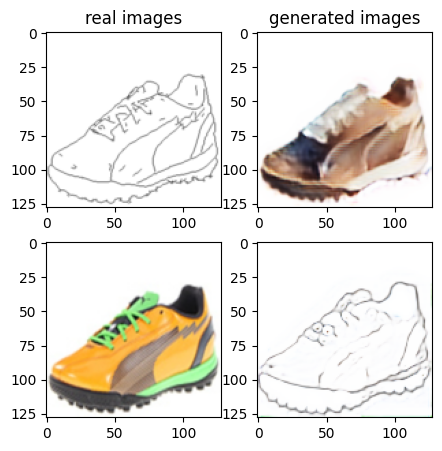

Train Epoch: 2 26% 	Total Loss: 1.251277 	Loss_G_AB: 0.285541	Loss_G_BA: 1.002240	Loss_cycle: 0.353783	Loss_D_A: 0.001665	Loss_D_B: 0.251938
1 63009 T:  2.159292697906494
Train Epoch: 2 26% 	Total Loss: 1.159858 	Loss_G_AB: 0.293252	Loss_G_BA: 0.989416	Loss_cycle: 0.280753	Loss_D_A: 0.001683	Loss_D_B: 0.236087
1 63019 T:  0.9831721782684326
Train Epoch: 2 27% 	Total Loss: 1.175198 	Loss_G_AB: 0.304679	Loss_G_BA: 1.004462	Loss_cycle: 0.280769	Loss_D_A: 0.002357	Loss_D_B: 0.237501
1 63029 T:  0.9913535118103027
Train Epoch: 2 27% 	Total Loss: 1.304819 	Loss_G_AB: 0.321015	Loss_G_BA: 0.992947	Loss_cycle: 0.419232	Loss_D_A: 0.002168	Loss_D_B: 0.226438
1 63039 T:  0.9849882125854492
Train Epoch: 2 27% 	Total Loss: 1.275062 	Loss_G_AB: 0.246728	Loss_G_BA: 0.996811	Loss_cycle: 0.370283	Loss_D_A: 0.002159	Loss_D_B: 0.280851
1 63049 T:  0.9780104160308838
Train Epoch: 2 27% 	Total Loss: 1.276032 	Loss_G_AB: 0.323552	Loss_G_BA: 1.006039	Loss_cycle: 0.380889	Loss_D_A: 0.001763	Loss_D_B: 0.228584


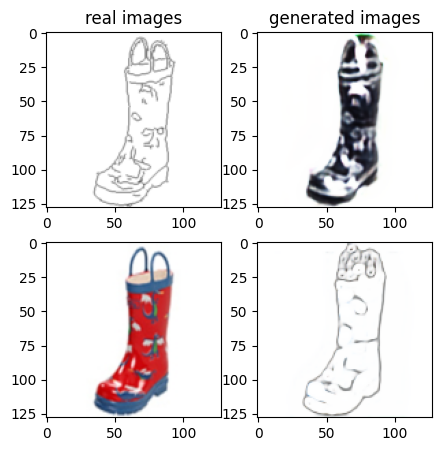

Train Epoch: 2 28% 	Total Loss: 1.349731 	Loss_G_AB: 0.319622	Loss_G_BA: 0.999421	Loss_cycle: 0.467619	Loss_D_A: 0.002035	Loss_D_B: 0.220555
1 64009 T:  1.7494957447052002
Train Epoch: 2 28% 	Total Loss: 1.263233 	Loss_G_AB: 0.326163	Loss_G_BA: 0.997182	Loss_cycle: 0.380716	Loss_D_A: 0.001682	Loss_D_B: 0.219163
1 64019 T:  0.9832980632781982
Train Epoch: 2 29% 	Total Loss: 1.290445 	Loss_G_AB: 0.351104	Loss_G_BA: 0.986969	Loss_cycle: 0.390483	Loss_D_A: 0.007276	Loss_D_B: 0.223649
1 64029 T:  0.9796407222747803
Train Epoch: 2 29% 	Total Loss: 1.285548 	Loss_G_AB: 0.276753	Loss_G_BA: 1.002696	Loss_cycle: 0.384531	Loss_D_A: 0.002235	Loss_D_B: 0.259057
1 64039 T:  0.9845459461212158
Train Epoch: 2 29% 	Total Loss: 1.300617 	Loss_G_AB: 0.301530	Loss_G_BA: 0.996235	Loss_cycle: 0.415460	Loss_D_A: 0.002503	Loss_D_B: 0.233771
1 64049 T:  0.9825143814086914
Train Epoch: 2 29% 	Total Loss: 1.328978 	Loss_G_AB: 0.425134	Loss_G_BA: 0.991118	Loss_cycle: 0.362343	Loss_D_A: 0.005108	Loss_D_B: 0.253401

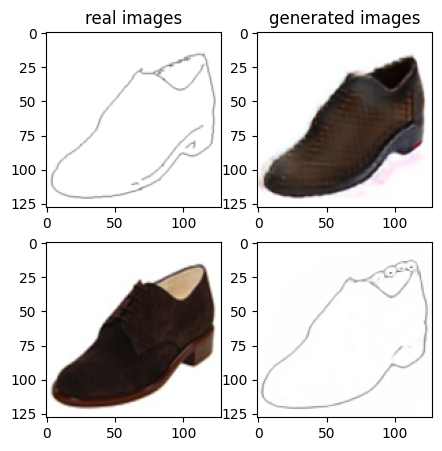

Train Epoch: 2 30% 	Total Loss: 1.173889 	Loss_G_AB: 0.293213	Loss_G_BA: 0.996121	Loss_cycle: 0.289899	Loss_D_A: 0.001679	Loss_D_B: 0.237644
1 65009 T:  2.491718292236328
Train Epoch: 2 30% 	Total Loss: 1.242206 	Loss_G_AB: 0.340217	Loss_G_BA: 0.930923	Loss_cycle: 0.368970	Loss_D_A: 0.016544	Loss_D_B: 0.221122
1 65019 T:  1.069180965423584
Train Epoch: 2 31% 	Total Loss: 1.246896 	Loss_G_AB: 0.311594	Loss_G_BA: 1.013957	Loss_cycle: 0.327109	Loss_D_A: 0.019717	Loss_D_B: 0.237295
1 65029 T:  1.0576958656311035
Train Epoch: 2 31% 	Total Loss: 1.256511 	Loss_G_AB: 0.302150	Loss_G_BA: 1.031476	Loss_cycle: 0.333897	Loss_D_A: 0.004957	Loss_D_B: 0.250843
1 65039 T:  1.0509746074676514
Train Epoch: 2 31% 	Total Loss: 1.168478 	Loss_G_AB: 0.328026	Loss_G_BA: 1.002807	Loss_cycle: 0.283667	Loss_D_A: 0.003567	Loss_D_B: 0.215827
1 65049 T:  1.0508973598480225
Train Epoch: 2 31% 	Total Loss: 1.322052 	Loss_G_AB: 0.331831	Loss_G_BA: 1.012971	Loss_cycle: 0.424382	Loss_D_A: 0.001468	Loss_D_B: 0.223800
1

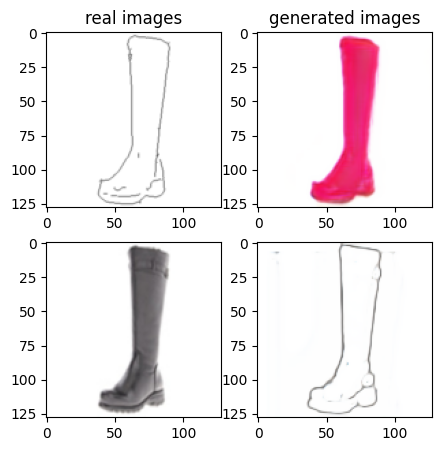

Train Epoch: 2 32% 	Total Loss: 1.404273 	Loss_G_AB: 0.429590	Loss_G_BA: 0.986010	Loss_cycle: 0.497353	Loss_D_A: 0.003314	Loss_D_B: 0.195807
1 66009 T:  1.7345683574676514
Train Epoch: 2 33% 	Total Loss: 1.329964 	Loss_G_AB: 0.266030	Loss_G_BA: 1.009282	Loss_cycle: 0.422505	Loss_D_A: 0.002399	Loss_D_B: 0.267405
1 66019 T:  0.982602596282959
Train Epoch: 2 33% 	Total Loss: 1.330935 	Loss_G_AB: 0.285344	Loss_G_BA: 0.988828	Loss_cycle: 0.437900	Loss_D_A: 0.002265	Loss_D_B: 0.253684
1 66029 T:  0.9814152717590332
Train Epoch: 2 33% 	Total Loss: 1.412882 	Loss_G_AB: 0.288679	Loss_G_BA: 1.000386	Loss_cycle: 0.506671	Loss_D_A: 0.002343	Loss_D_B: 0.259335
1 66039 T:  0.9813835620880127
Train Epoch: 2 33% 	Total Loss: 1.212572 	Loss_G_AB: 0.302995	Loss_G_BA: 1.011265	Loss_cycle: 0.313573	Loss_D_A: 0.003545	Loss_D_B: 0.238324
1 66049 T:  0.9913139343261719
Train Epoch: 2 33% 	Total Loss: 1.241288 	Loss_G_AB: 0.277956	Loss_G_BA: 0.992253	Loss_cycle: 0.350286	Loss_D_A: 0.005840	Loss_D_B: 0.250057


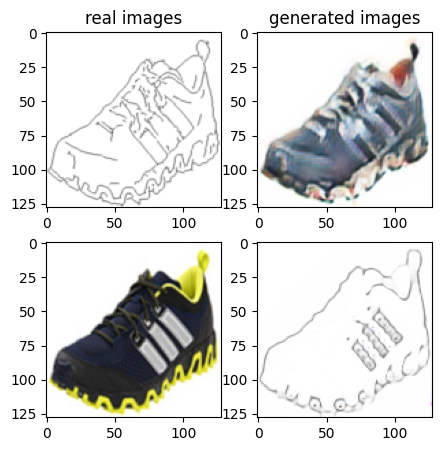

Train Epoch: 2 34% 	Total Loss: 1.403808 	Loss_G_AB: 0.296713	Loss_G_BA: 0.997152	Loss_cycle: 0.509498	Loss_D_A: 0.001841	Loss_D_B: 0.245537
1 67009 T:  1.7797718048095703
Train Epoch: 2 35% 	Total Loss: 1.268755 	Loss_G_AB: 0.533608	Loss_G_BA: 1.018820	Loss_cycle: 0.361411	Loss_D_A: 0.007652	Loss_D_B: 0.123479
1 67019 T:  0.9838919639587402
Train Epoch: 2 35% 	Total Loss: 1.312313 	Loss_G_AB: 0.298815	Loss_G_BA: 0.990545	Loss_cycle: 0.398458	Loss_D_A: 0.002931	Loss_D_B: 0.266244
1 67029 T:  0.983135461807251
Train Epoch: 2 35% 	Total Loss: 1.230280 	Loss_G_AB: 0.307638	Loss_G_BA: 0.938291	Loss_cycle: 0.328527	Loss_D_A: 0.014994	Loss_D_B: 0.263794
1 67039 T:  0.9790904521942139
Train Epoch: 2 35% 	Total Loss: 1.312419 	Loss_G_AB: 0.352932	Loss_G_BA: 0.982296	Loss_cycle: 0.415231	Loss_D_A: 0.004359	Loss_D_B: 0.225216
1 67049 T:  0.992171049118042
Train Epoch: 2 35% 	Total Loss: 1.374418 	Loss_G_AB: 0.350900	Loss_G_BA: 0.985302	Loss_cycle: 0.439928	Loss_D_A: 0.008086	Loss_D_B: 0.258302
1

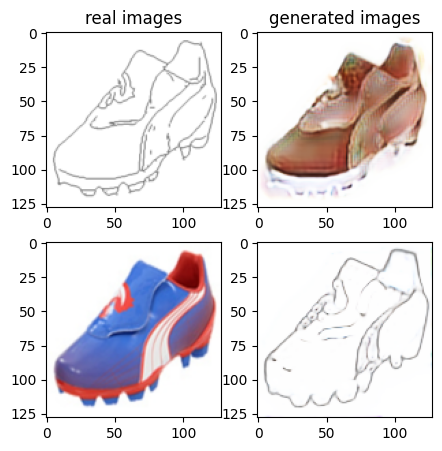

Train Epoch: 2 36% 	Total Loss: 1.327689 	Loss_G_AB: 0.337914	Loss_G_BA: 1.003517	Loss_cycle: 0.434304	Loss_D_A: 0.001932	Loss_D_B: 0.220738
1 68009 T:  1.723684549331665
Train Epoch: 2 37% 	Total Loss: 1.217930 	Loss_G_AB: 0.356041	Loss_G_BA: 0.984905	Loss_cycle: 0.301650	Loss_D_A: 0.005128	Loss_D_B: 0.240679
1 68019 T:  0.9782156944274902
Train Epoch: 2 37% 	Total Loss: 1.322829 	Loss_G_AB: 0.305917	Loss_G_BA: 1.006534	Loss_cycle: 0.354870	Loss_D_A: 0.003799	Loss_D_B: 0.307935
1 68029 T:  0.9799942970275879
Train Epoch: 2 37% 	Total Loss: 1.375461 	Loss_G_AB: 0.303425	Loss_G_BA: 0.998939	Loss_cycle: 0.459388	Loss_D_A: 0.001330	Loss_D_B: 0.263560
1 68039 T:  0.981036901473999
Train Epoch: 2 37% 	Total Loss: 1.214179 	Loss_G_AB: 0.340080	Loss_G_BA: 1.001586	Loss_cycle: 0.346743	Loss_D_A: 0.002665	Loss_D_B: 0.193939
1 68049 T:  0.9829394817352295
Train Epoch: 2 37% 	Total Loss: 1.295154 	Loss_G_AB: 0.344555	Loss_G_BA: 0.995140	Loss_cycle: 0.406852	Loss_D_A: 0.001663	Loss_D_B: 0.216792
1

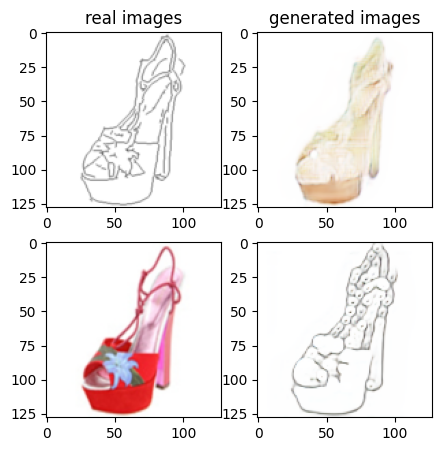

Train Epoch: 2 39% 	Total Loss: 1.316887 	Loss_G_AB: 0.329334	Loss_G_BA: 0.945780	Loss_cycle: 0.419817	Loss_D_A: 0.017267	Loss_D_B: 0.242246
1 69009 T:  2.008687973022461
Train Epoch: 2 39% 	Total Loss: 1.254014 	Loss_G_AB: 0.311640	Loss_G_BA: 0.991175	Loss_cycle: 0.334182	Loss_D_A: 0.009661	Loss_D_B: 0.258764
1 69019 T:  0.9871699810028076
Train Epoch: 2 39% 	Total Loss: 1.321583 	Loss_G_AB: 0.294797	Loss_G_BA: 1.002921	Loss_cycle: 0.421649	Loss_D_A: 0.006716	Loss_D_B: 0.244360
1 69029 T:  1.03236722946167
Train Epoch: 2 39% 	Total Loss: 1.178961 	Loss_G_AB: 0.312195	Loss_G_BA: 0.906810	Loss_cycle: 0.304068	Loss_D_A: 0.023934	Loss_D_B: 0.241457
1 69039 T:  1.0222675800323486
Train Epoch: 2 39% 	Total Loss: 1.329963 	Loss_G_AB: 0.324661	Loss_G_BA: 1.029475	Loss_cycle: 0.418461	Loss_D_A: 0.009018	Loss_D_B: 0.225417
1 69049 T:  1.029935359954834
Train Epoch: 2 39% 	Total Loss: 1.379654 	Loss_G_AB: 0.281111	Loss_G_BA: 1.003053	Loss_cycle: 0.467656	Loss_D_A: 0.003211	Loss_D_B: 0.266706
1 6

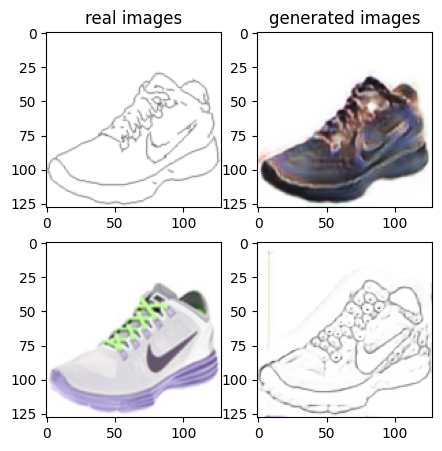

Train Epoch: 2 41% 	Total Loss: 1.384741 	Loss_G_AB: 0.307106	Loss_G_BA: 0.815370	Loss_cycle: 0.514785	Loss_D_A: 0.078690	Loss_D_B: 0.230029
1 70009 T:  1.9141714572906494
Train Epoch: 2 41% 	Total Loss: 1.233484 	Loss_G_AB: 0.380267	Loss_G_BA: 0.724294	Loss_cycle: 0.379962	Loss_D_A: 0.077174	Loss_D_B: 0.224068
1 70019 T:  1.0101492404937744
Train Epoch: 2 41% 	Total Loss: 1.320117 	Loss_G_AB: 0.312698	Loss_G_BA: 0.922611	Loss_cycle: 0.378664	Loss_D_A: 0.082705	Loss_D_B: 0.241094
1 70029 T:  0.9960024356842041
Train Epoch: 2 41% 	Total Loss: 1.409562 	Loss_G_AB: 0.293999	Loss_G_BA: 0.874805	Loss_cycle: 0.493338	Loss_D_A: 0.056738	Loss_D_B: 0.275084
1 70039 T:  1.0051584243774414
Train Epoch: 2 41% 	Total Loss: 1.347904 	Loss_G_AB: 0.340926	Loss_G_BA: 0.895376	Loss_cycle: 0.450401	Loss_D_A: 0.075208	Loss_D_B: 0.204144
1 70049 T:  0.9882524013519287
Train Epoch: 2 41% 	Total Loss: 1.280193 	Loss_G_AB: 0.338180	Loss_G_BA: 0.964428	Loss_cycle: 0.386388	Loss_D_A: 0.032303	Loss_D_B: 0.210199

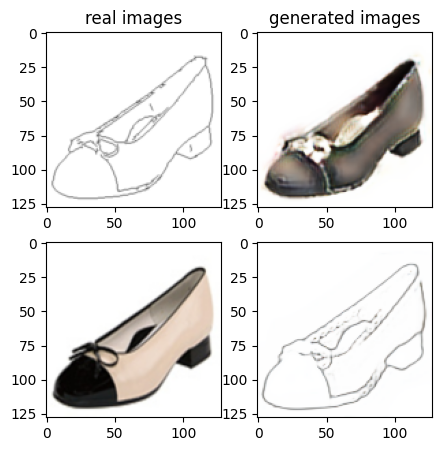

Train Epoch: 2 43% 	Total Loss: 1.323417 	Loss_G_AB: 0.266281	Loss_G_BA: 0.987508	Loss_cycle: 0.451312	Loss_D_A: 0.002911	Loss_D_B: 0.242299
1 71009 T:  2.1649484634399414
Train Epoch: 2 43% 	Total Loss: 1.243346 	Loss_G_AB: 0.336812	Loss_G_BA: 0.999378	Loss_cycle: 0.335603	Loss_D_A: 0.002350	Loss_D_B: 0.237298
1 71019 T:  1.0134899616241455
Train Epoch: 2 43% 	Total Loss: 1.270238 	Loss_G_AB: 0.298844	Loss_G_BA: 0.997911	Loss_cycle: 0.389473	Loss_D_A: 0.002283	Loss_D_B: 0.230105
1 71029 T:  0.9872269630432129
Train Epoch: 2 43% 	Total Loss: 1.328778 	Loss_G_AB: 0.307828	Loss_G_BA: 1.024961	Loss_cycle: 0.408791	Loss_D_A: 0.001964	Loss_D_B: 0.251628
1 71039 T:  0.9825010299682617
Train Epoch: 2 43% 	Total Loss: 1.258797 	Loss_G_AB: 0.289849	Loss_G_BA: 1.003689	Loss_cycle: 0.382828	Loss_D_A: 0.001508	Loss_D_B: 0.227692
1 71049 T:  0.9851820468902588
Train Epoch: 2 43% 	Total Loss: 1.288507 	Loss_G_AB: 0.330624	Loss_G_BA: 0.992369	Loss_cycle: 0.360468	Loss_D_A: 0.002224	Loss_D_B: 0.264319

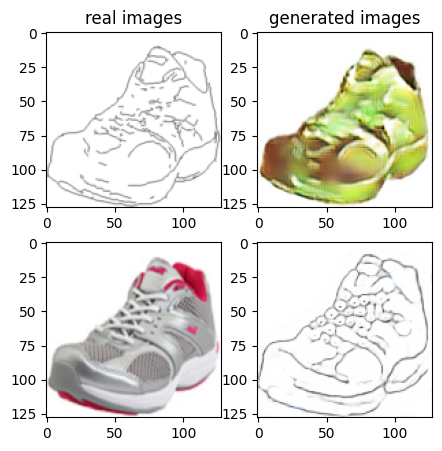

Train Epoch: 2 45% 	Total Loss: 1.265209 	Loss_G_AB: 0.323470	Loss_G_BA: 0.995262	Loss_cycle: 0.304982	Loss_D_A: 0.002621	Loss_D_B: 0.298240
1 72009 T:  2.2305121421813965
Train Epoch: 2 45% 	Total Loss: 1.366305 	Loss_G_AB: 0.278653	Loss_G_BA: 1.010169	Loss_cycle: 0.469822	Loss_D_A: 0.001742	Loss_D_B: 0.250330
1 72019 T:  1.001725196838379
Train Epoch: 2 45% 	Total Loss: 1.297830 	Loss_G_AB: 0.333680	Loss_G_BA: 0.995285	Loss_cycle: 0.423935	Loss_D_A: 0.001579	Loss_D_B: 0.207832
1 72029 T:  0.9873178005218506
Train Epoch: 2 45% 	Total Loss: 1.360318 	Loss_G_AB: 0.319216	Loss_G_BA: 0.998283	Loss_cycle: 0.473374	Loss_D_A: 0.002326	Loss_D_B: 0.225869
1 72039 T:  0.9882090091705322
Train Epoch: 2 45% 	Total Loss: 1.266087 	Loss_G_AB: 0.327707	Loss_G_BA: 0.986663	Loss_cycle: 0.379921	Loss_D_A: 0.001463	Loss_D_B: 0.227518
1 72049 T:  0.9835221767425537
Train Epoch: 2 45% 	Total Loss: 1.164070 	Loss_G_AB: 0.312800	Loss_G_BA: 0.993485	Loss_cycle: 0.262355	Loss_D_A: 0.006721	Loss_D_B: 0.241851


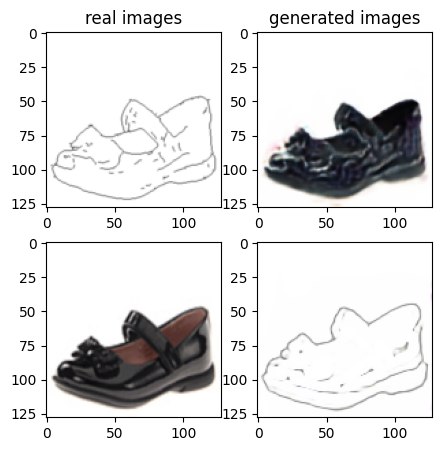

Train Epoch: 2 47% 	Total Loss: 1.224657 	Loss_G_AB: 0.288505	Loss_G_BA: 0.992857	Loss_cycle: 0.330948	Loss_D_A: 0.001445	Loss_D_B: 0.251583
1 73009 T:  2.212836742401123
Train Epoch: 2 47% 	Total Loss: 1.350093 	Loss_G_AB: 0.392151	Loss_G_BA: 1.000469	Loss_cycle: 0.419264	Loss_D_A: 0.002099	Loss_D_B: 0.232420
1 73019 T:  1.0317671298980713
Train Epoch: 2 47% 	Total Loss: 1.254746 	Loss_G_AB: 0.281096	Loss_G_BA: 0.975328	Loss_cycle: 0.351003	Loss_D_A: 0.004954	Loss_D_B: 0.270577
1 73029 T:  1.05198335647583
Train Epoch: 2 47% 	Total Loss: 1.354266 	Loss_G_AB: 0.307010	Loss_G_BA: 1.015437	Loss_cycle: 0.461486	Loss_D_A: 0.002688	Loss_D_B: 0.228869
1 73039 T:  0.9866786003112793
Train Epoch: 2 47% 	Total Loss: 1.267062 	Loss_G_AB: 0.305511	Loss_G_BA: 1.004799	Loss_cycle: 0.361066	Loss_D_A: 0.001498	Loss_D_B: 0.249343
1 73049 T:  0.9860541820526123
Train Epoch: 2 47% 	Total Loss: 1.267333 	Loss_G_AB: 0.330761	Loss_G_BA: 0.996754	Loss_cycle: 0.366625	Loss_D_A: 0.003955	Loss_D_B: 0.232996
1 

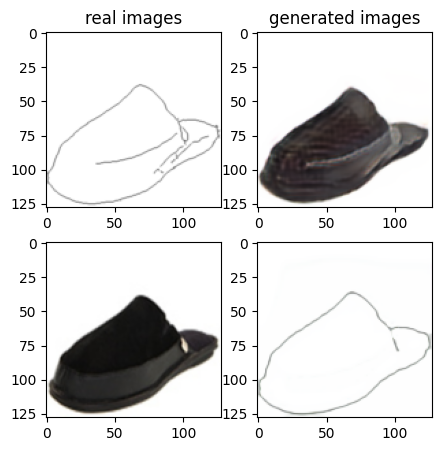

Train Epoch: 2 49% 	Total Loss: 1.222773 	Loss_G_AB: 0.343241	Loss_G_BA: 0.993660	Loss_cycle: 0.355133	Loss_D_A: 0.004894	Loss_D_B: 0.194296
1 74009 T:  2.1748836040496826
Train Epoch: 2 49% 	Total Loss: 1.245296 	Loss_G_AB: 0.279657	Loss_G_BA: 0.995863	Loss_cycle: 0.334393	Loss_D_A: 0.003101	Loss_D_B: 0.270043
1 74019 T:  0.9903748035430908
Train Epoch: 2 49% 	Total Loss: 1.242437 	Loss_G_AB: 0.318954	Loss_G_BA: 0.994891	Loss_cycle: 0.346949	Loss_D_A: 0.003107	Loss_D_B: 0.235459
1 74029 T:  0.9776411056518555
Train Epoch: 2 49% 	Total Loss: 1.354286 	Loss_G_AB: 0.342041	Loss_G_BA: 0.997325	Loss_cycle: 0.451430	Loss_D_A: 0.003660	Loss_D_B: 0.229513
1 74039 T:  0.9824855327606201
Train Epoch: 2 49% 	Total Loss: 1.244977 	Loss_G_AB: 0.401271	Loss_G_BA: 1.016312	Loss_cycle: 0.337711	Loss_D_A: 0.002105	Loss_D_B: 0.196370
1 74049 T:  1.006413459777832
Train Epoch: 2 49% 	Total Loss: 1.221324 	Loss_G_AB: 0.351445	Loss_G_BA: 0.952657	Loss_cycle: 0.339459	Loss_D_A: 0.004108	Loss_D_B: 0.225706


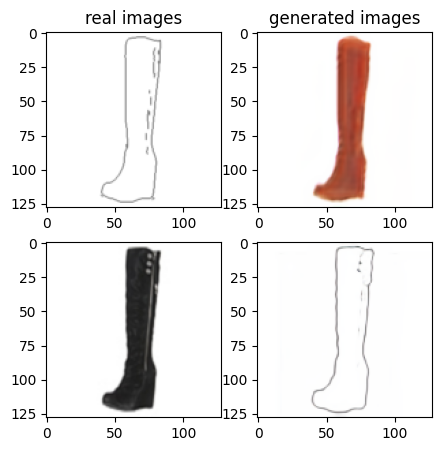

Train Epoch: 2 51% 	Total Loss: 1.217997 	Loss_G_AB: 0.338837	Loss_G_BA: 0.975735	Loss_cycle: 0.335295	Loss_D_A: 0.011974	Loss_D_B: 0.213441
1 75009 T:  2.3308751583099365
Train Epoch: 2 51% 	Total Loss: 1.320396 	Loss_G_AB: 0.327315	Loss_G_BA: 0.959142	Loss_cycle: 0.408766	Loss_D_A: 0.034499	Loss_D_B: 0.233902
1 75019 T:  1.0373480319976807
Train Epoch: 2 51% 	Total Loss: 1.310142 	Loss_G_AB: 0.321925	Loss_G_BA: 0.975300	Loss_cycle: 0.410218	Loss_D_A: 0.009215	Loss_D_B: 0.242097
1 75029 T:  1.0428001880645752
Train Epoch: 2 51% 	Total Loss: 1.283259 	Loss_G_AB: 0.334302	Loss_G_BA: 0.970884	Loss_cycle: 0.376396	Loss_D_A: 0.010714	Loss_D_B: 0.243557
1 75039 T:  1.0468931198120117
Train Epoch: 2 51% 	Total Loss: 1.283189 	Loss_G_AB: 0.262898	Loss_G_BA: 0.956092	Loss_cycle: 0.333927	Loss_D_A: 0.053670	Loss_D_B: 0.286096
1 75049 T:  1.0394539833068848
Train Epoch: 2 51% 	Total Loss: 1.244369 	Loss_G_AB: 0.320095	Loss_G_BA: 0.895086	Loss_cycle: 0.350086	Loss_D_A: 0.061506	Loss_D_B: 0.225187

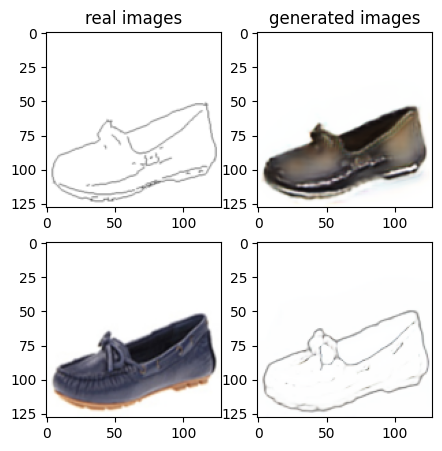

Train Epoch: 2 53% 	Total Loss: 1.206288 	Loss_G_AB: 0.283178	Loss_G_BA: 0.979812	Loss_cycle: 0.339173	Loss_D_A: 0.007952	Loss_D_B: 0.227669
1 76009 T:  1.96193528175354
Train Epoch: 2 53% 	Total Loss: 1.282187 	Loss_G_AB: 0.352391	Loss_G_BA: 1.011524	Loss_cycle: 0.360725	Loss_D_A: 0.002641	Loss_D_B: 0.236864
1 76019 T:  0.982311487197876
Train Epoch: 2 53% 	Total Loss: 1.241239 	Loss_G_AB: 0.325336	Loss_G_BA: 0.977412	Loss_cycle: 0.353393	Loss_D_A: 0.002542	Loss_D_B: 0.233930
1 76029 T:  0.9851517677307129
Train Epoch: 2 53% 	Total Loss: 1.326429 	Loss_G_AB: 0.347051	Loss_G_BA: 1.017079	Loss_cycle: 0.411281	Loss_D_A: 0.003731	Loss_D_B: 0.229352
1 76039 T:  0.9835445880889893
Train Epoch: 2 53% 	Total Loss: 1.251809 	Loss_G_AB: 0.306825	Loss_G_BA: 0.991329	Loss_cycle: 0.364951	Loss_D_A: 0.002141	Loss_D_B: 0.235640
1 76049 T:  0.980546236038208
Train Epoch: 2 53% 	Total Loss: 1.190825 	Loss_G_AB: 0.342407	Loss_G_BA: 1.004205	Loss_cycle: 0.289630	Loss_D_A: 0.003033	Loss_D_B: 0.224857
1 7

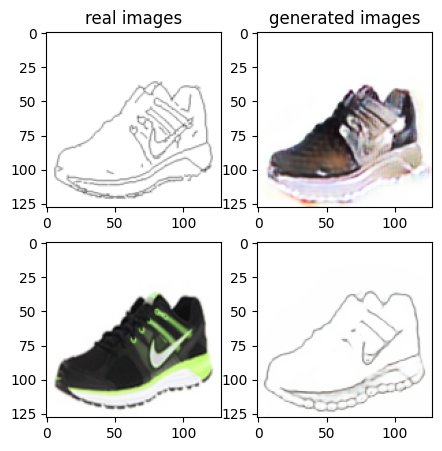

Train Epoch: 2 55% 	Total Loss: 1.317429 	Loss_G_AB: 0.275522	Loss_G_BA: 0.985775	Loss_cycle: 0.425783	Loss_D_A: 0.002145	Loss_D_B: 0.258853
1 77009 T:  1.7761549949645996
Train Epoch: 2 55% 	Total Loss: 1.282219 	Loss_G_AB: 0.377994	Loss_G_BA: 1.006381	Loss_cycle: 0.368080	Loss_D_A: 0.003523	Loss_D_B: 0.218429
1 77019 T:  0.9929525852203369
Train Epoch: 2 55% 	Total Loss: 1.219675 	Loss_G_AB: 0.341130	Loss_G_BA: 1.001514	Loss_cycle: 0.324971	Loss_D_A: 0.002718	Loss_D_B: 0.220664
1 77029 T:  0.9886174201965332
Train Epoch: 2 55% 	Total Loss: 1.312697 	Loss_G_AB: 0.327302	Loss_G_BA: 1.006826	Loss_cycle: 0.421461	Loss_D_A: 0.002672	Loss_D_B: 0.221499
1 77039 T:  0.9810788631439209
Train Epoch: 2 55% 	Total Loss: 1.244638 	Loss_G_AB: 0.264330	Loss_G_BA: 1.003019	Loss_cycle: 0.337203	Loss_D_A: 0.002150	Loss_D_B: 0.271611
1 77049 T:  0.9895198345184326
Train Epoch: 2 55% 	Total Loss: 1.172152 	Loss_G_AB: 0.268461	Loss_G_BA: 0.997001	Loss_cycle: 0.296950	Loss_D_A: 0.001187	Loss_D_B: 0.241284

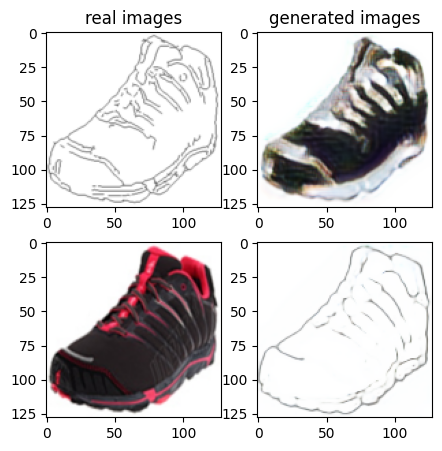

Train Epoch: 2 57% 	Total Loss: 1.244321 	Loss_G_AB: 0.281012	Loss_G_BA: 1.009718	Loss_cycle: 0.347145	Loss_D_A: 0.001690	Loss_D_B: 0.250121
1 78009 T:  1.8084425926208496
Train Epoch: 2 57% 	Total Loss: 1.304723 	Loss_G_AB: 0.280195	Loss_G_BA: 0.995237	Loss_cycle: 0.412252	Loss_D_A: 0.001261	Loss_D_B: 0.253494
1 78019 T:  0.9831640720367432
Train Epoch: 2 57% 	Total Loss: 1.241623 	Loss_G_AB: 0.282170	Loss_G_BA: 1.002651	Loss_cycle: 0.349802	Loss_D_A: 0.001323	Loss_D_B: 0.248087
1 78029 T:  0.992051362991333
Train Epoch: 2 57% 	Total Loss: 1.214809 	Loss_G_AB: 0.299082	Loss_G_BA: 0.999456	Loss_cycle: 0.328434	Loss_D_A: 0.001325	Loss_D_B: 0.235780
1 78039 T:  0.9867534637451172
Train Epoch: 2 57% 	Total Loss: 1.185496 	Loss_G_AB: 0.311325	Loss_G_BA: 0.991035	Loss_cycle: 0.315542	Loss_D_A: 0.001543	Loss_D_B: 0.217232
1 78049 T:  0.9804186820983887
Train Epoch: 2 57% 	Total Loss: 1.299575 	Loss_G_AB: 0.292034	Loss_G_BA: 1.019338	Loss_cycle: 0.377012	Loss_D_A: 0.002182	Loss_D_B: 0.264696


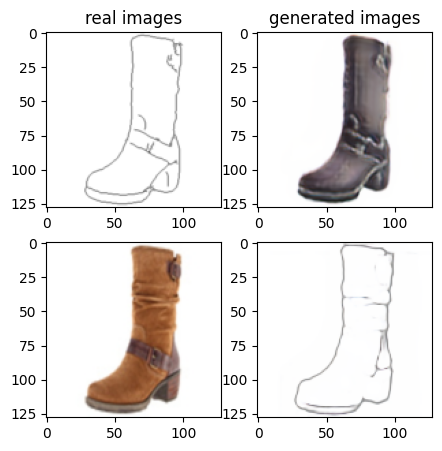

Train Epoch: 2 59% 	Total Loss: 1.258188 	Loss_G_AB: 0.307737	Loss_G_BA: 1.003382	Loss_cycle: 0.372998	Loss_D_A: 0.003393	Loss_D_B: 0.226237
1 79009 T:  1.7805578708648682
Train Epoch: 2 59% 	Total Loss: 1.291462 	Loss_G_AB: 0.280749	Loss_G_BA: 0.984379	Loss_cycle: 0.424587	Loss_D_A: 0.001963	Loss_D_B: 0.232349
1 79019 T:  0.9847643375396729
Train Epoch: 2 59% 	Total Loss: 1.320705 	Loss_G_AB: 0.341144	Loss_G_BA: 1.008742	Loss_cycle: 0.427381	Loss_D_A: 0.002549	Loss_D_B: 0.215832
1 79029 T:  0.981360673904419
Train Epoch: 2 59% 	Total Loss: 1.211923 	Loss_G_AB: 0.295624	Loss_G_BA: 0.988677	Loss_cycle: 0.332379	Loss_D_A: 0.003031	Loss_D_B: 0.234363
1 79039 T:  0.9812302589416504
Train Epoch: 2 59% 	Total Loss: 1.213566 	Loss_G_AB: 0.315630	Loss_G_BA: 1.006330	Loss_cycle: 0.314707	Loss_D_A: 0.003183	Loss_D_B: 0.234697
1 79049 T:  0.9778313636779785
Train Epoch: 2 59% 	Total Loss: 1.373282 	Loss_G_AB: 0.346591	Loss_G_BA: 1.014228	Loss_cycle: 0.469369	Loss_D_A: 0.005812	Loss_D_B: 0.217692


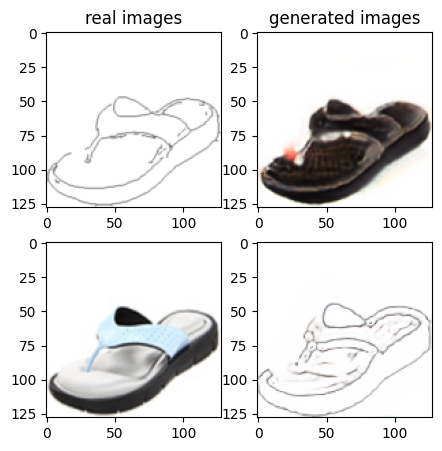

Train Epoch: 2 61% 	Total Loss: 1.254845 	Loss_G_AB: 0.301167	Loss_G_BA: 0.963858	Loss_cycle: 0.380254	Loss_D_A: 0.003367	Loss_D_B: 0.238712
1 80009 T:  1.861570119857788
Train Epoch: 2 61% 	Total Loss: 1.251377 	Loss_G_AB: 0.273700	Loss_G_BA: 1.020319	Loss_cycle: 0.366396	Loss_D_A: 0.003310	Loss_D_B: 0.234661
1 80019 T:  0.9854252338409424
Train Epoch: 2 61% 	Total Loss: 1.199056 	Loss_G_AB: 0.280796	Loss_G_BA: 0.957961	Loss_cycle: 0.288607	Loss_D_A: 0.022423	Loss_D_B: 0.268648
1 80029 T:  0.9798674583435059
Train Epoch: 2 61% 	Total Loss: 1.250819 	Loss_G_AB: 0.347221	Loss_G_BA: 0.981154	Loss_cycle: 0.372121	Loss_D_A: 0.006134	Loss_D_B: 0.208377
1 80039 T:  1.0083861351013184
Train Epoch: 2 61% 	Total Loss: 1.196518 	Loss_G_AB: 0.299326	Loss_G_BA: 1.016313	Loss_cycle: 0.302974	Loss_D_A: 0.005712	Loss_D_B: 0.230014
1 80049 T:  1.0137479305267334
Train Epoch: 2 61% 	Total Loss: 1.363159 	Loss_G_AB: 0.356153	Loss_G_BA: 0.953386	Loss_cycle: 0.461973	Loss_D_A: 0.007930	Loss_D_B: 0.238487


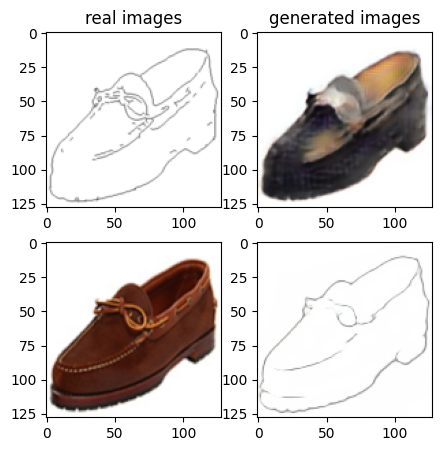

Train Epoch: 2 63% 	Total Loss: 1.202693 	Loss_G_AB: 0.285355	Loss_G_BA: 1.000425	Loss_cycle: 0.329747	Loss_D_A: 0.003863	Loss_D_B: 0.226193
1 81009 T:  1.8250312805175781
Train Epoch: 2 63% 	Total Loss: 1.263419 	Loss_G_AB: 0.310282	Loss_G_BA: 0.995646	Loss_cycle: 0.374342	Loss_D_A: 0.002051	Loss_D_B: 0.234063
1 81019 T:  0.9946708679199219
Train Epoch: 2 63% 	Total Loss: 1.164412 	Loss_G_AB: 0.282138	Loss_G_BA: 0.997678	Loss_cycle: 0.282464	Loss_D_A: 0.002052	Loss_D_B: 0.239989
1 81029 T:  0.9959733486175537
Train Epoch: 2 63% 	Total Loss: 1.208435 	Loss_G_AB: 0.315564	Loss_G_BA: 0.996801	Loss_cycle: 0.319749	Loss_D_A: 0.001460	Loss_D_B: 0.231044
1 81039 T:  1.0009429454803467
Train Epoch: 2 63% 	Total Loss: 1.222600 	Loss_G_AB: 0.316215	Loss_G_BA: 1.005047	Loss_cycle: 0.322461	Loss_D_A: 0.001329	Loss_D_B: 0.238178
1 81049 T:  1.0357623100280762
Train Epoch: 2 63% 	Total Loss: 1.323013 	Loss_G_AB: 0.274180	Loss_G_BA: 0.986820	Loss_cycle: 0.443137	Loss_D_A: 0.001474	Loss_D_B: 0.247902

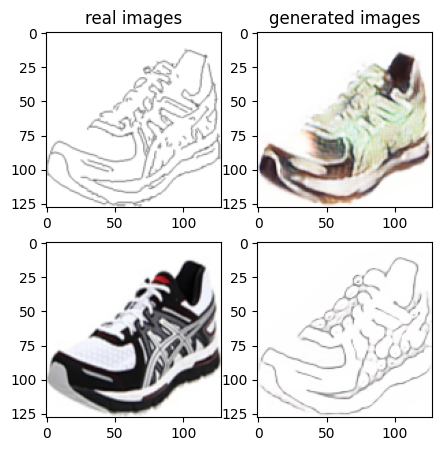

Train Epoch: 2 65% 	Total Loss: 1.215966 	Loss_G_AB: 0.303448	Loss_G_BA: 0.923677	Loss_cycle: 0.355233	Loss_D_A: 0.012575	Loss_D_B: 0.234596
1 82009 T:  1.8317780494689941
Train Epoch: 2 65% 	Total Loss: 1.355879 	Loss_G_AB: 0.336382	Loss_G_BA: 0.942602	Loss_cycle: 0.436806	Loss_D_A: 0.045948	Loss_D_B: 0.233632
1 82019 T:  1.8651385307312012
Train Epoch: 2 65% 	Total Loss: 1.161794 	Loss_G_AB: 0.300729	Loss_G_BA: 0.908519	Loss_cycle: 0.296245	Loss_D_A: 0.031687	Loss_D_B: 0.229237
1 82029 T:  1.0141918659210205
Train Epoch: 2 65% 	Total Loss: 1.253729 	Loss_G_AB: 0.391453	Loss_G_BA: 0.824228	Loss_cycle: 0.329089	Loss_D_A: 0.098346	Loss_D_B: 0.218453
1 82039 T:  0.9888029098510742
Train Epoch: 2 65% 	Total Loss: 1.504885 	Loss_G_AB: 0.331685	Loss_G_BA: 1.065310	Loss_cycle: 0.523976	Loss_D_A: 0.016554	Loss_D_B: 0.265857
1 82049 T:  0.9864199161529541
Train Epoch: 2 65% 	Total Loss: 1.304455 	Loss_G_AB: 0.271557	Loss_G_BA: 0.999374	Loss_cycle: 0.382185	Loss_D_A: 0.004785	Loss_D_B: 0.282019

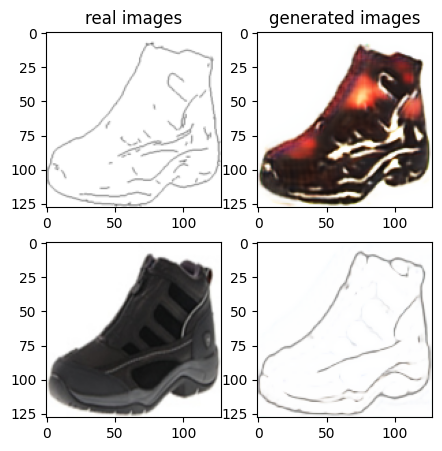

Train Epoch: 2 67% 	Total Loss: 1.312382 	Loss_G_AB: 0.346779	Loss_G_BA: 1.013315	Loss_cycle: 0.388624	Loss_D_A: 0.001929	Loss_D_B: 0.241782
1 83009 T:  2.228611946105957
Train Epoch: 2 67% 	Total Loss: 1.177786 	Loss_G_AB: 0.301023	Loss_G_BA: 0.999564	Loss_cycle: 0.277729	Loss_D_A: 0.002247	Loss_D_B: 0.247516
1 83019 T:  0.9826598167419434
Train Epoch: 2 67% 	Total Loss: 1.307042 	Loss_G_AB: 0.343727	Loss_G_BA: 1.002807	Loss_cycle: 0.397279	Loss_D_A: 0.001587	Loss_D_B: 0.234909
1 83029 T:  0.9885542392730713
Train Epoch: 2 67% 	Total Loss: 1.215947 	Loss_G_AB: 0.270306	Loss_G_BA: 0.994512	Loss_cycle: 0.321560	Loss_D_A: 0.001516	Loss_D_B: 0.260461
1 83039 T:  0.9827022552490234
Train Epoch: 2 67% 	Total Loss: 1.207027 	Loss_G_AB: 0.341533	Loss_G_BA: 1.006815	Loss_cycle: 0.347800	Loss_D_A: 0.001609	Loss_D_B: 0.183444
1 83049 T:  0.9815294742584229
Train Epoch: 2 67% 	Total Loss: 1.272256 	Loss_G_AB: 0.309040	Loss_G_BA: 0.987158	Loss_cycle: 0.373687	Loss_D_A: 0.003016	Loss_D_B: 0.247455


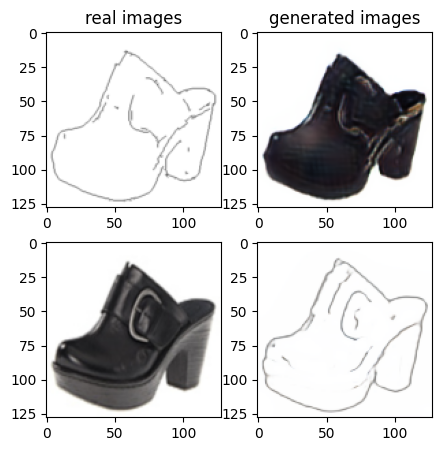

Train Epoch: 2 69% 	Total Loss: 1.283844 	Loss_G_AB: 0.331900	Loss_G_BA: 1.010036	Loss_cycle: 0.392230	Loss_D_A: 0.002019	Loss_D_B: 0.218626
1 84009 T:  2.4507761001586914
Train Epoch: 2 69% 	Total Loss: 1.144720 	Loss_G_AB: 0.329906	Loss_G_BA: 0.997534	Loss_cycle: 0.245627	Loss_D_A: 0.001644	Loss_D_B: 0.233728
1 84019 T:  0.9815840721130371
Train Epoch: 2 69% 	Total Loss: 1.233413 	Loss_G_AB: 0.298103	Loss_G_BA: 1.001370	Loss_cycle: 0.310741	Loss_D_A: 0.001097	Loss_D_B: 0.271838
1 84029 T:  0.9807767868041992
Train Epoch: 2 69% 	Total Loss: 1.225339 	Loss_G_AB: 0.348862	Loss_G_BA: 0.990700	Loss_cycle: 0.345047	Loss_D_A: 0.001537	Loss_D_B: 0.208974
1 84039 T:  0.9817328453063965
Train Epoch: 2 69% 	Total Loss: 1.244993 	Loss_G_AB: 0.340391	Loss_G_BA: 0.979212	Loss_cycle: 0.345389	Loss_D_A: 0.001296	Loss_D_B: 0.238508
1 84049 T:  0.9876601696014404
Train Epoch: 2 69% 	Total Loss: 1.273972 	Loss_G_AB: 0.275050	Loss_G_BA: 1.019380	Loss_cycle: 0.354219	Loss_D_A: 0.001441	Loss_D_B: 0.271096

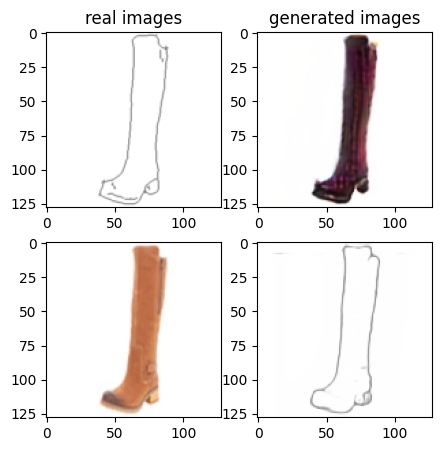

Train Epoch: 2 71% 	Total Loss: 1.268674 	Loss_G_AB: 0.270147	Loss_G_BA: 1.013837	Loss_cycle: 0.349922	Loss_D_A: 0.002253	Loss_D_B: 0.274507
1 85009 T:  1.8062098026275635
Train Epoch: 2 71% 	Total Loss: 1.412831 	Loss_G_AB: 0.328594	Loss_G_BA: 1.003949	Loss_cycle: 0.486882	Loss_D_A: 0.002479	Loss_D_B: 0.257198
1 85019 T:  0.986957311630249
Train Epoch: 2 71% 	Total Loss: 1.291744 	Loss_G_AB: 0.279847	Loss_G_BA: 0.989340	Loss_cycle: 0.384005	Loss_D_A: 0.002356	Loss_D_B: 0.270790
1 85029 T:  0.9798173904418945
Train Epoch: 2 71% 	Total Loss: 1.277950 	Loss_G_AB: 0.282245	Loss_G_BA: 1.013071	Loss_cycle: 0.364900	Loss_D_A: 0.001647	Loss_D_B: 0.263746
1 85039 T:  0.9850828647613525
Train Epoch: 2 71% 	Total Loss: 1.176397 	Loss_G_AB: 0.284728	Loss_G_BA: 0.996363	Loss_cycle: 0.288115	Loss_D_A: 0.005732	Loss_D_B: 0.242004
1 85049 T:  0.9818241596221924
Train Epoch: 2 71% 	Total Loss: 1.298619 	Loss_G_AB: 0.327305	Loss_G_BA: 0.993566	Loss_cycle: 0.432726	Loss_D_A: 0.002055	Loss_D_B: 0.203402


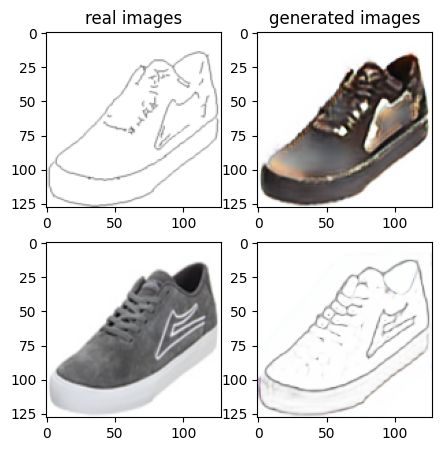

Train Epoch: 2 73% 	Total Loss: 1.178348 	Loss_G_AB: 0.293835	Loss_G_BA: 0.990371	Loss_cycle: 0.300236	Loss_D_A: 0.001675	Loss_D_B: 0.234333
1 86009 T:  2.6295430660247803
Train Epoch: 2 73% 	Total Loss: 1.170300 	Loss_G_AB: 0.303845	Loss_G_BA: 1.003395	Loss_cycle: 0.284070	Loss_D_A: 0.001498	Loss_D_B: 0.231112
1 86019 T:  1.0342121124267578
Train Epoch: 2 73% 	Total Loss: 1.228755 	Loss_G_AB: 0.303181	Loss_G_BA: 1.007046	Loss_cycle: 0.345744	Loss_D_A: 0.001992	Loss_D_B: 0.225904
1 86029 T:  1.0658788681030273
Train Epoch: 2 73% 	Total Loss: 1.381187 	Loss_G_AB: 0.452584	Loss_G_BA: 0.998635	Loss_cycle: 0.394525	Loss_D_A: 0.001544	Loss_D_B: 0.259508
1 86039 T:  1.1137590408325195
Train Epoch: 2 73% 	Total Loss: 1.337452 	Loss_G_AB: 0.341785	Loss_G_BA: 0.990764	Loss_cycle: 0.454679	Loss_D_A: 0.002655	Loss_D_B: 0.213843
1 86049 T:  1.0795979499816895
Train Epoch: 2 73% 	Total Loss: 1.240867 	Loss_G_AB: 0.342276	Loss_G_BA: 1.013966	Loss_cycle: 0.311705	Loss_D_A: 0.002741	Loss_D_B: 0.248300

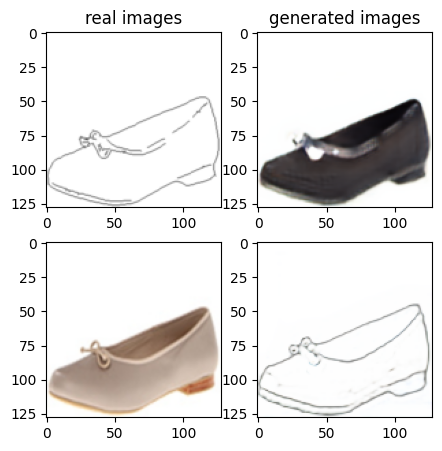

Train Epoch: 2 75% 	Total Loss: 1.177389 	Loss_G_AB: 0.343683	Loss_G_BA: 0.981136	Loss_cycle: 0.295611	Loss_D_A: 0.003461	Loss_D_B: 0.215907
1 87009 T:  1.8211500644683838
Train Epoch: 2 75% 	Total Loss: 1.205616 	Loss_G_AB: 0.343614	Loss_G_BA: 0.998506	Loss_cycle: 0.299074	Loss_D_A: 0.004339	Loss_D_B: 0.231143
1 87019 T:  0.9817831516265869
Train Epoch: 2 75% 	Total Loss: 1.211029 	Loss_G_AB: 0.350845	Loss_G_BA: 1.020991	Loss_cycle: 0.299588	Loss_D_A: 0.003272	Loss_D_B: 0.222251
1 87029 T:  0.9845783710479736
Train Epoch: 2 75% 	Total Loss: 1.352179 	Loss_G_AB: 0.399380	Loss_G_BA: 0.993912	Loss_cycle: 0.430271	Loss_D_A: 0.001602	Loss_D_B: 0.223660
1 87039 T:  0.9852235317230225
Train Epoch: 2 75% 	Total Loss: 1.207090 	Loss_G_AB: 0.329776	Loss_G_BA: 1.003391	Loss_cycle: 0.349216	Loss_D_A: 0.000905	Loss_D_B: 0.190386
1 87049 T:  0.9799680709838867
Train Epoch: 2 75% 	Total Loss: 1.382161 	Loss_G_AB: 0.262919	Loss_G_BA: 0.995028	Loss_cycle: 0.432519	Loss_D_A: 0.001212	Loss_D_B: 0.319456

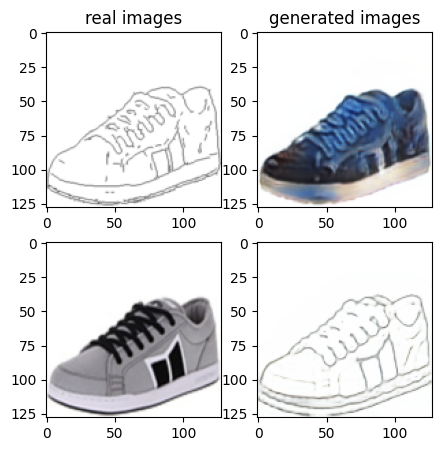

Train Epoch: 2 77% 	Total Loss: 1.303899 	Loss_G_AB: 0.346141	Loss_G_BA: 1.002083	Loss_cycle: 0.387945	Loss_D_A: 0.002785	Loss_D_B: 0.239057
1 88009 T:  1.7838778495788574
Train Epoch: 2 77% 	Total Loss: 1.197446 	Loss_G_AB: 0.308697	Loss_G_BA: 1.016858	Loss_cycle: 0.282807	Loss_D_A: 0.002738	Loss_D_B: 0.249124
1 88019 T:  0.9886500835418701
Train Epoch: 2 77% 	Total Loss: 1.217249 	Loss_G_AB: 0.361551	Loss_G_BA: 1.004021	Loss_cycle: 0.310983	Loss_D_A: 0.004033	Loss_D_B: 0.219448
1 88029 T:  0.983635425567627
Train Epoch: 2 77% 	Total Loss: 1.161630 	Loss_G_AB: 0.316975	Loss_G_BA: 0.984849	Loss_cycle: 0.275631	Loss_D_A: 0.008048	Loss_D_B: 0.227040
1 88039 T:  0.9889471530914307
Train Epoch: 2 77% 	Total Loss: 1.250757 	Loss_G_AB: 0.317455	Loss_G_BA: 0.967775	Loss_cycle: 0.330634	Loss_D_A: 0.015702	Loss_D_B: 0.261806
1 88049 T:  0.9835488796234131
Train Epoch: 2 77% 	Total Loss: 1.242148 	Loss_G_AB: 0.309021	Loss_G_BA: 0.999885	Loss_cycle: 0.335529	Loss_D_A: 0.008503	Loss_D_B: 0.243663


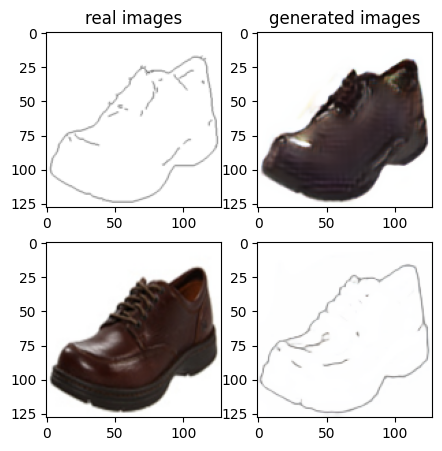

Train Epoch: 2 79% 	Total Loss: 1.267497 	Loss_G_AB: 0.297025	Loss_G_BA: 0.967311	Loss_cycle: 0.354405	Loss_D_A: 0.009675	Loss_D_B: 0.271249
1 89009 T:  2.4539296627044678
Train Epoch: 2 79% 	Total Loss: 1.278470 	Loss_G_AB: 0.399551	Loss_G_BA: 0.953361	Loss_cycle: 0.348944	Loss_D_A: 0.053570	Loss_D_B: 0.199499
1 89019 T:  1.1602747440338135
Train Epoch: 2 79% 	Total Loss: 1.393021 	Loss_G_AB: 0.256433	Loss_G_BA: 0.990339	Loss_cycle: 0.394814	Loss_D_A: 0.055111	Loss_D_B: 0.319710
1 89029 T:  1.0368754863739014
Train Epoch: 2 79% 	Total Loss: 1.299732 	Loss_G_AB: 0.298142	Loss_G_BA: 0.968516	Loss_cycle: 0.391330	Loss_D_A: 0.034527	Loss_D_B: 0.240546
1 89039 T:  1.0868072509765625
Train Epoch: 2 79% 	Total Loss: 1.187403 	Loss_G_AB: 0.282147	Loss_G_BA: 0.993543	Loss_cycle: 0.298031	Loss_D_A: 0.004227	Loss_D_B: 0.247300
1 89049 T:  1.1246531009674072
Train Epoch: 2 79% 	Total Loss: 1.292280 	Loss_G_AB: 0.332374	Loss_G_BA: 1.009062	Loss_cycle: 0.411755	Loss_D_A: 0.002575	Loss_D_B: 0.207231

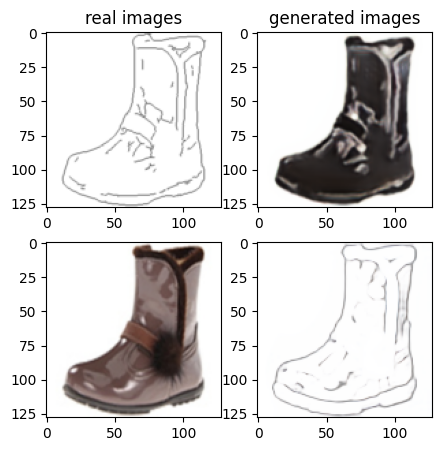

Train Epoch: 2 81% 	Total Loss: 1.244293 	Loss_G_AB: 0.301277	Loss_G_BA: 0.992031	Loss_cycle: 0.331523	Loss_D_A: 0.000823	Loss_D_B: 0.265293
1 90009 T:  1.801847219467163
Train Epoch: 2 81% 	Total Loss: 1.204940 	Loss_G_AB: 0.355940	Loss_G_BA: 0.994299	Loss_cycle: 0.335234	Loss_D_A: 0.001506	Loss_D_B: 0.193080
1 90019 T:  0.994492769241333
Train Epoch: 2 81% 	Total Loss: 1.305104 	Loss_G_AB: 0.301022	Loss_G_BA: 0.987633	Loss_cycle: 0.414884	Loss_D_A: 0.005009	Loss_D_B: 0.240884
1 90029 T:  1.0382657051086426
Train Epoch: 2 81% 	Total Loss: 1.311301 	Loss_G_AB: 0.298279	Loss_G_BA: 0.981435	Loss_cycle: 0.403767	Loss_D_A: 0.004166	Loss_D_B: 0.263511
1 90039 T:  1.0148084163665771
Train Epoch: 2 81% 	Total Loss: 1.245959 	Loss_G_AB: 0.343427	Loss_G_BA: 0.996270	Loss_cycle: 0.321313	Loss_D_A: 0.000940	Loss_D_B: 0.253858
1 90049 T:  1.0073707103729248
Train Epoch: 2 81% 	Total Loss: 1.250421 	Loss_G_AB: 0.321869	Loss_G_BA: 0.996623	Loss_cycle: 0.389868	Loss_D_A: 0.001418	Loss_D_B: 0.199889
1

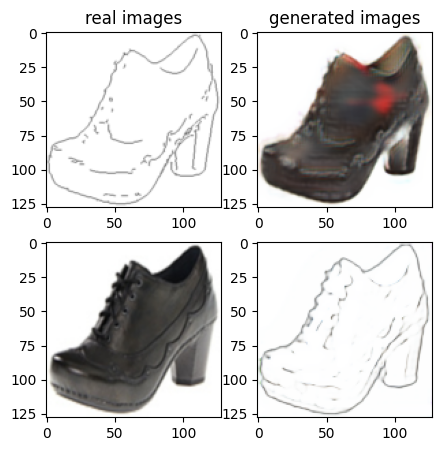

Train Epoch: 2 83% 	Total Loss: 1.262489 	Loss_G_AB: 0.318093	Loss_G_BA: 0.995793	Loss_cycle: 0.378846	Loss_D_A: 0.001495	Loss_D_B: 0.225204
1 91009 T:  2.077423095703125
Train Epoch: 2 83% 	Total Loss: 1.249482 	Loss_G_AB: 0.349434	Loss_G_BA: 0.998377	Loss_cycle: 0.354183	Loss_D_A: 0.001985	Loss_D_B: 0.219409
1 91019 T:  1.0381863117218018
Train Epoch: 2 83% 	Total Loss: 1.227130 	Loss_G_AB: 0.312212	Loss_G_BA: 1.008374	Loss_cycle: 0.325723	Loss_D_A: 0.001461	Loss_D_B: 0.239653
1 91029 T:  1.0162572860717773
Train Epoch: 2 83% 	Total Loss: 1.218928 	Loss_G_AB: 0.271954	Loss_G_BA: 1.008910	Loss_cycle: 0.301217	Loss_D_A: 0.001759	Loss_D_B: 0.275519
1 91039 T:  1.0047924518585205
Train Epoch: 2 83% 	Total Loss: 1.282270 	Loss_G_AB: 0.323127	Loss_G_BA: 0.997891	Loss_cycle: 0.404850	Loss_D_A: 0.001865	Loss_D_B: 0.215046
1 91049 T:  0.9830517768859863
Train Epoch: 2 83% 	Total Loss: 1.213284 	Loss_G_AB: 0.324621	Loss_G_BA: 0.994876	Loss_cycle: 0.315228	Loss_D_A: 0.002394	Loss_D_B: 0.235915


In [ ]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
#from datasets import *
from datasets import *

from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt


# Training Configurations
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
#train_img_dir = './edges2shoes/train/'

train_img_dir = '/content/train/'

img_shape = (3, 128, 128)
n_residual_blocks = 6
num_epochs = 2
batch_size = 1
lr_rate = 0.0002      # Adam optimizer learning rate
betas = (0.5, 0.999)  # Adam optimizer beta 1, beta 2
lambda_cyc = 10.0 	  # cycle loss weight
latent_dim = 8        # latent dimension for the encoded images from domain B
report_feq = 10        # Visualize image every 'report_feq' iters
visual_feq = 1000
save_feq = 1000      # Save models every 'save_feq' iters

# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

train_dataset = Edge2Shoe(train_img_dir)
train_loader = data.DataLoader(train_dataset, batch_size=batch_size)
print('the length of training data:', len(train_dataset))
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = img_shape

# Initialize generator and discriminator

#models file have the architecture for generator and discriminator. we initialize them here
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)


if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)
    D_A = D_A.to(device)
    D_B = D_B.to(device)
    criterion_GAN.to(device)
    criterion_cycle.to(device)

# Initialize weights
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)



# Define optimizer
optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate, betas=betas)

# For adversarial loss
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

# loss recorder
running_loss_D_A = 0
running_loss_D_B = 0
running_loss_GAN_AB = 0
running_loss_GAN_BA = 0
running_loss_cycle = 0
running_total_loss = 0

# loss_D_A = []
# loss_D_B = []
# loss_GAN_AB = []
# loss_GAN_BA = []
# loss_cycle = []
# total_loss = []

# we will store losses everytime we are reporting
# this way we get 9965 losses. We can show losses at the end every 100 iterations or so leading to 100 points in plot
loss_D_A_history = []
loss_D_B_history = []
loss_GAN_AB_history = []
loss_GAN_BA_history = []
loss_cycle_history = []
total_loss_history = []
# Training
counter = 0
total_steps = len(train_loader)*num_epochs; step = 0
for e in range(num_epochs):
    start = time.time()
    for idx, data in enumerate(train_loader):
        ########## Process Inputs ##########
        edge_tensor, rgb_tensor = data
        edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
        real_A = edge_tensor; real_B = rgb_tensor;

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

        # ------------------
        #  Train Generators
        # ------------------
        G_AB.train(); G_BA.train()
        optimizer_G.zero_grad()

        # Generator loss
        loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
        loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle loss
        loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
        loss_cycle_B = loss_cycle_consis(G_AB, fake_A, real_B, criterion_cycle)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2

        # Total loss
        loss_G = loss_GAN + lambda_cyc * loss_cycle

        loss_G.backward()
        optimizer_G.step()


        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        # function to compute loss_D_A
        loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)
        loss_D_A = loss_D_A / 2
        # update the D_A network
        loss_D_A.backward()
        optimizer_D_A.step()


        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()

        # function to compute loss_D_A
        loss_D_B = loss_discriminator(fake_B, D_B, real_B, valid, fake, criterion_GAN)
        loss_D_B = loss_D_B / 2
        # update the D_B network
        loss_D_B.backward()
        optimizer_D_B.step()





        # add all losses
        running_total_loss += (loss_GAN + lambda_cyc * loss_cycle + loss_D_A + loss_D_B).item()

        running_loss_GAN_AB += loss_GAN_AB.item()
        running_loss_GAN_BA += loss_GAN_BA.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_cycle += lambda_cyc * loss_cycle.item()
        ########## Visualization ##########
        if step % report_feq == report_feq-1:
            print('Train Epoch: {} {:.0f}% \tTotal Loss: {:.6f} \tLoss_G_AB: {:.6f}\tLoss_G_BA: {:.6f}\tLoss_cycle: {:.6f}\tLoss_D_A: {:.6f}\tLoss_D_B: {:.6f}'.format
                    (e+1, 100. * idx / len(train_loader), running_total_loss / report_feq,
                    running_loss_GAN_AB/report_feq, running_loss_GAN_BA/report_feq,
                    running_loss_cycle/report_feq, running_loss_D_A/report_feq,
                    running_loss_D_B/report_feq))

            #now store losses in list for plot
            loss_D_A_history.append(running_loss_D_A/report_feq,)
            loss_D_B_history.append(running_loss_D_B/report_feq,)
            loss_GAN_AB_history.append(running_loss_GAN_AB/report_feq,)
            loss_GAN_BA_history.append(running_loss_GAN_BA/report_feq,)
            loss_cycle_history.append(running_loss_cycle/report_feq,)
            total_loss_history.append(running_total_loss/report_feq,)

            #now reset once saved
            running_loss_D_A = 0
            running_loss_D_B = 0
            running_loss_GAN_AB = 0
            running_loss_GAN_BA = 0
            running_loss_cycle = 0
            running_total_loss = 0
            end = time.time()
            print(e, step, 'T: ', end-start)
            start = end
        ########## Visualize Generated images ##########
        if step % visual_feq == 0:
            vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            fig, axs = plt.subplots(2,2, figsize = (5,5))

            axs[0,0].imshow(vis_real_A.transpose(1,2,0))
            axs[0,0].set_title('real images')
            axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
            axs[0,1].set_title('generated images')
            axs[1,0].imshow(vis_real_B.transpose(1,2,0))
            axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
            plt.show()
        ########## Save Generators ##########
        if step % save_feq == save_feq-1:
          """
            if not os.path.exists('models'): os.mkdir('models')
            torch.save(G_AB, '/content/models/G_AB.pt')
            torch.save(G_BA, '/content/models/G_BA.pt')
            # feel free to save checkpoint if you need retrain the model...
          """
          #we will do checkpointing
          checkpoint_filename = f'checkpoint_step_{step}.pt'
          checkpoint_path = os.path.join('/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/cyclegan_losses/', checkpoint_filename)

          checkpoint = {
              #store losses list
              "loss_D_A": loss_D_A_history,
              "loss_D_B": loss_D_B_history,
              "loss_GAN_AB": loss_GAN_AB_history,
              "loss_GAN_BA": loss_GAN_BA_history,
              "loss_cycle": loss_cycle_history,
              "loss_total": total_loss_history,
              #store generators and discriminators since they are getting updated in backprop
              "G_AB": G_AB.state_dict(),
              "G_BA": G_BA.state_dict(),
              "D_A": D_A.state_dict(),
              "D_B": D_B.state_dict(),
                        }
          torch.save(checkpoint, checkpoint_path)
          #counter+=1
          #if(counter==6):
            #5 models saved (5000iterations done) -> break and see ouur 5 losses history
            #break




        #increment step initialized before training begins
        step += 1
    #break from outer loop
    #if(counter==6):
      #break

#now plot losses appended every 100th iterations -> 100 plots
plt.figure(figsize=(10, 5))
plt.plot(loss_D_A_history[::100], label='Discriminator A Loss')
plt.plot(loss_D_B_history[::100], label='Discriminator B Loss')
plt.plot(loss_GAN_AB_history[::100], label='Generator AB Loss')
plt.plot(loss_GAN_BA_history[::100], label='Generator BA Loss')
plt.title('Training Losses for Generators and Discriminators every 100th iteration of an epoch')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(loss_cycle_history[::100], label='Cycle Consistency Loss')
plt.title('Cycle Consistency Loss')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.title('Cycle Consistency Loss every 100th iteration of an epoch')
plt.legend()
plt.show()


### Model ran for 90999 iterations. 99k makes 2 epochs. So we can say that we are almost done with 2 epochs

In [17]:
#load model
ckt = torch.load('/content/drive/MyDrive/classwork/cis680/homework/hw5 gans vae/cyclegan_losses/checkpoint_step_90999.pt',map_location=torch.device('cpu'))

#loading losses for plotting
loss_D_A_history = ckt['loss_D_A']
loss_D_B_history = ckt['loss_D_B']
loss_GAN_AB_history = ckt['loss_GAN_AB']
loss_GAN_BA_history = ckt['loss_GAN_BA']
loss_cycle_history = ckt['loss_cycle']
total_loss_history = ckt['loss_total']
loss_D_A_history = ckt['loss_D_A']

#loading generator & discriminator object
img_shape = (3, 128, 128)
input_shape = img_shape
n_residual_blocks = 6

G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)
G_AB.load_state_dict(ckt['G_AB'])
G_BA.load_state_dict(ckt['G_BA'])
D_A.load_state_dict(ckt['D_A'])
D_B.load_state_dict(ckt['D_B'])


<All keys matched successfully>

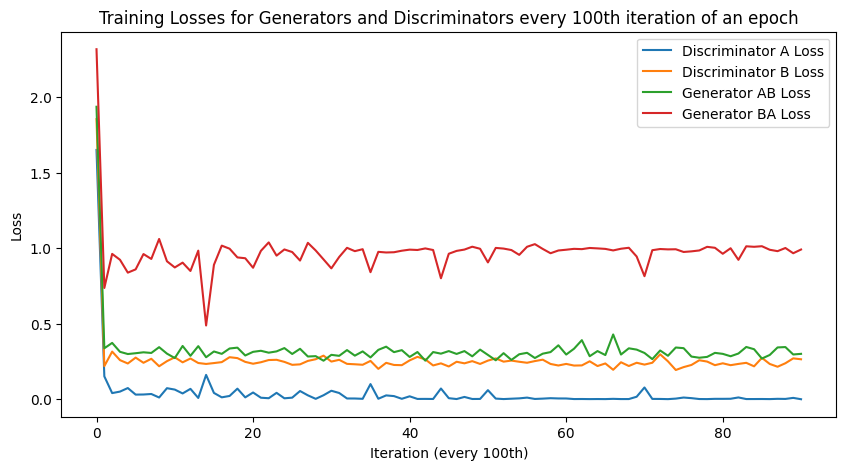

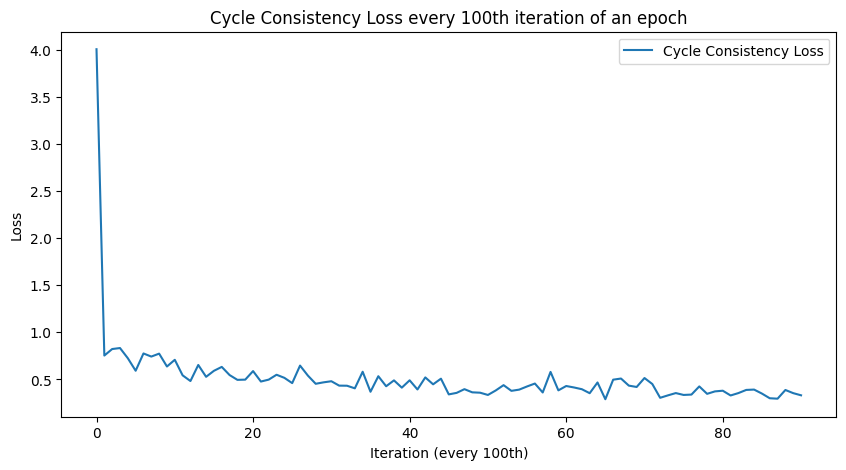

In [18]:
plt.figure(figsize=(10, 5))
plt.plot(loss_D_A_history[::100], label='Discriminator A Loss')
plt.plot(loss_D_B_history[::100], label='Discriminator B Loss')
plt.plot(loss_GAN_AB_history[::100], label='Generator AB Loss')
plt.plot(loss_GAN_BA_history[::100], label='Generator BA Loss')
plt.title('Training Losses for Generators and Discriminators every 100th iteration of an epoch')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(loss_cycle_history[::100], label='Cycle Consistency Loss')
plt.title('Cycle Consistency Loss')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.title('Cycle Consistency Loss every 100th iteration of an epoch')
plt.legend()
plt.show()

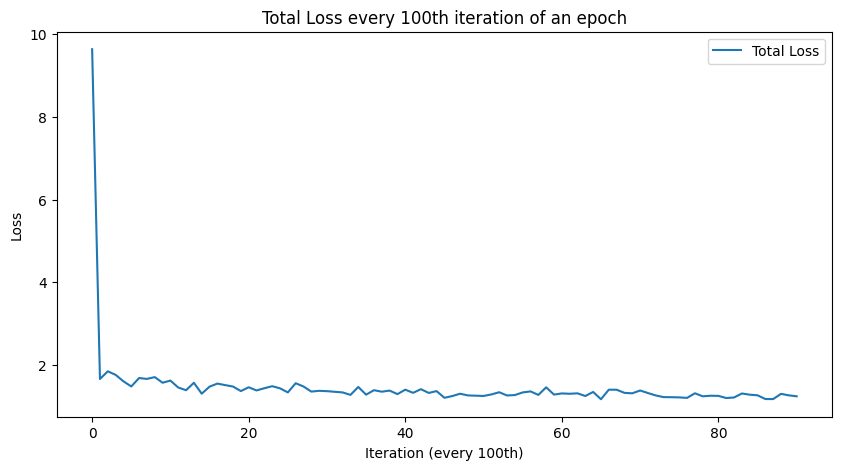

In [20]:
plt.figure(figsize=(10, 5))
plt.plot(total_loss_history[::100], label='Total Loss')
plt.title('Total Loss')
plt.xlabel('Iteration (every 100th)')
plt.ylabel('Loss')
plt.title('Total Loss every 100th iteration of an epoch')
plt.legend()
plt.show()

# CycleGAN testing (TODO)

In [36]:
from torch.utils.data import DataLoader, TensorDataset
test_batch_size = 1
#test_img_dir = './edges2shoes/val/'
test_img_dir = '/content/val/'

test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

In [23]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#already loaded above
#G_AB = torch.load('/content/models/G_AB.pt')
#G_BA = torch.load('/content/models/G_BA.pt')
cuda = torch.cuda.is_available()

if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)

In [56]:
# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

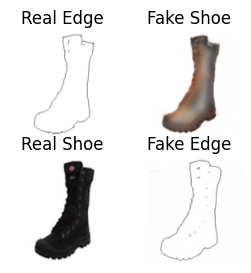

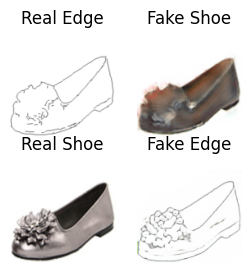

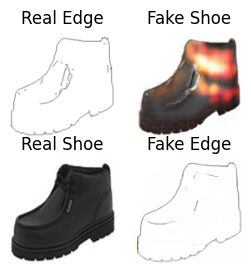

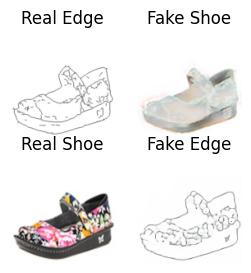

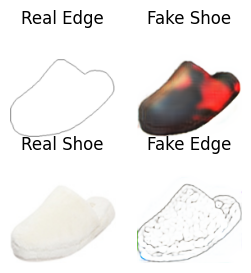

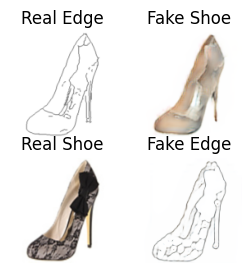

In [60]:
G_AB.eval()
G_BA.eval()
################################
# Please visualize real_edge, fake_shoe, real_shoe, fake_edge in 2-by-2 grids:
for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)


    fake_A = G_BA(real_B)  #torch.Size([1, 3, 128, 128])
    fake_A = denorm(fake_A.detach())
    fake_A = fake_A.numpy().astype(np.uint8).transpose(0,2,3,1)

    fake_B = G_AB(real_A)  #torch.Size([1, 3, 128, 128])
    fake_B = denorm(fake_B.detach())
    #print(fake_B[0])
    fake_B = fake_B.numpy().astype(np.uint8).transpose(0,2,3,1)

    real_A = denorm(real_A.detach())
    real_A = real_A.numpy().astype(np.uint8).transpose(0,2,3,1)

    real_B = denorm(real_B.detach())
    real_B = real_B.numpy().astype(np.uint8).transpose(0,2,3,1)
    #print(fake_A.shape)

    fig,axes = plt.subplots(2,2, figsize = (3,3))
    axes[0, 0].imshow(real_A[0])
    axes[0, 0].set_title("Real Edge")
    axes[0, 0].axis('off')

    axes[0, 1].imshow(fake_B[0])
    axes[0, 1].set_title("Fake Shoe")
    axes[0, 1].axis('off')

    axes[1, 0].imshow(real_B[0])
    axes[1, 0].set_title("Real Shoe")
    axes[1, 0].axis('off')

    axes[1, 1].imshow(fake_A[0])
    axes[1, 1].set_title("Fake Edge")
    axes[1, 1].axis('off')

    if(idx == 5):
      break



################################



# Quantitative Evaluation

## FID Score computation

First, we have to create 6 datasets:
- Domain A real set 1
- Domain A real set 2
- Domain A generate set

- Domain B real set 1
- Domain B real set 2
- Domain B generate set



Create folder to save images and create dataset.

In [61]:
! mkdir real_A_1 real_A_2 gen_A
! mkdir real_B_1 real_B_2 gen_B

In [63]:
# First create test data loader
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
#test_img_dir = './edges2shoes/val/'
test_img_dir = '/content/val/'


test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load learnt Generator G_AB and G_BA
#G_AB = torch.load('/content/models/G_AB.pt').to(device)
#G_BA = torch.load('/content/models/G_BA.pt').to(device)
G_AB.load_state_dict(ckt['G_AB'])
G_BA.load_state_dict(ckt['G_BA'])

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []

for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    # plt.imshow(real_A.type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    # print(real_A.shape)

    if idx < evaluate_num:
        fake_A = G_BA(real_B)
        fake_B = G_AB(real_A)
        real_A_set_1.append(denorm(real_A.detach()))
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_A.append(denorm(fake_A.detach()))
        gen_set_B.append(denorm(fake_B.detach()))

        # plt.imshow(data[0].type(torch.uint8).squeeze(0).permute(1,2,0))
        # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
        # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
        # plt.show()
        plt.imsave('./real_A_1/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_A/gen_A' + str(idx) + '.png', denorm(fake_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).type(torch.uint8).squeeze(), './real_A_1/real_A' + str(idx) + '.png', normalize=False)

        # save_image(denorm(real_B).detach().squeeze(), './real_B_1/real_B' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_A).detach().squeeze(), './gen_A/gen_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_B).detach().squeeze(), './gen_B/gen_B' + str(idx) + '.png', normalize=False)
        # del real_A; del real_B; del fake_A; del fake_B

    elif evaluate_num <= idx < 2*evaluate_num:
        real_A_set_2.append(real_A.detach())
        real_B_set_2.append(real_B.detach())
        plt.imsave('./real_A_2/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).detach().squeeze(), './real_A_2/real_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(real_B).detach().squeeze(), './real_B_2/real_B' + str(idx) + '.png', normalize=False)

    if idx == 2*evaluate_num-1:
        break
# make 6 pytorch dataset
real_A_dataset_1 = TensorDataset(torch.cat(real_A_set_1))
real_A_dataset_2 = TensorDataset(torch.cat(real_A_set_2))
real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_A = TensorDataset(torch.cat(gen_set_A))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))



## Compute FID score

In [64]:
! pip install pytorch-fid

In [67]:
! pip install scipy==1.11.1
# to avoid ValueError: Imaginary component

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.3/36.3 MB 34.7 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.3
    Uninstalling scipy-1.11.3:
      Successfully uninstalled scipy-1.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.


In [68]:
print('computing FID score between real_edge_1 and real_edge_2')
#! python -m pytorch_fid '/content/real_A_1' '/content/real_A_2' --gpu 0
! python -m pytorch_fid '/content/real_A_1' '/content/real_A_2'


print('computing FID score between real_edge_1 and gen_edge')
#! python -m pytorch_fid '/content/real_A_1' '/content/gen_A' --gpu 0
! python -m pytorch_fid '/content/real_A_1' '/content/gen_A'


print('computing FID score between real_shoe_1 and real_shoe_2')
#! python -m pytorch_fid '/content/real_B_1' '/content/real_B_2' --gpu 0
! python -m pytorch_fid '/content/real_B_1' '/content/real_B_2'


print('computing FID score between real_shoe_1 and gen_shoe')
#! python -m pytorch_fid '/content/real_B_1' '/content/gen_B' --gpu 0
! python -m pytorch_fid '/content/real_B_1' '/content/gen_B'

computing FID score between real_edge_1 and real_edge_2
100% 2/2 [00:51<00:00, 25.84s/it]
100% 2/2 [00:42<00:00, 21.46s/it]
FID:  50.10597859917954
computing FID score between real_edge_1 and gen_edge
100% 2/2 [00:42<00:00, 21.36s/it]
100% 2/2 [00:46<00:00, 23.19s/it]
FID:  99.80046131409844
computing FID score between real_shoe_1 and real_shoe_2
100% 2/2 [00:42<00:00, 21.19s/it]
100% 2/2 [00:44<00:00, 22.39s/it]
FID:  58.80420301905852
computing FID score between real_shoe_1 and gen_shoe
100% 2/2 [00:44<00:00, 22.17s/it]
100% 2/2 [00:44<00:00, 22.27s/it]
FID:  123.79387242137818


## Compute IS score

#### upload inception.py

In [71]:
from inception_score import inception_score

import warnings
warnings.filterwarnings("ignore")

print('IS score for real_edge_1 data set:')
#print(inception_score(real_A_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print(inception_score(real_A_dataset_1, cuda=False, batch_size=64, resize=True, splits=1))

print('IS score for gen_edge data set:')
#print(inception_score(gen_dataset_A, cuda=True, batch_size=64, resize=True, splits=1))
print(inception_score(gen_dataset_A, cuda=False, batch_size=64, resize=True, splits=1))



print('IS score for real_shoe_1:')
#print(inception_score(real_B_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print(inception_score(real_B_dataset_1, cuda=False, batch_size=64, resize=True, splits=1))

print('IS score for gen_shoe data set:')
#print(inception_score(gen_dataset_B, cuda=True, batch_size=64, resize=True, splits=1))
print(inception_score(gen_dataset_B, cuda=False, batch_size=64, resize=True, splits=1))

IS score for real_edge_1 data set:
(1.001543486827918, 0.0)
IS score for gen_edge data set:
(1.0010872079538045, 0.0)
IS score for real_shoe_1:
(3.539735974730432, 0.0)
IS score for gen_shoe data set:
(1.9373810161357972, 0.0)
